# IoT Academy - Smart Manufacturing - Testbed 2 - Day 3

---

In this third laboratory activity, you will deepen particular machine learning (ML) topics, such as models comparison and feature selection.

In the first cells of the notebook some utility operation are defined to import and process the dataset with the same steps we used the last time.

#### Jupyter

 - Remember that your code is executed dynamically, do not skip the execution of any cell before proceeding
 - Play with the code, do not be afraid to mess the code up. You can always download again the original version of the code
 - If you are using Colab, remember that the runtime will be disconnected after a period of inactivity
 - Remember to save your old results - maybe with a screenshot or duplicating the cells - if you want to compare your modification with old results
 - Enable your GPU! Click on "Runtime" in the tool bar > "Cambia tipo di runtime" > select "GPU" in the "Acceleratore hardware" drop down list
 - Ask for any kind of help!

# Activity 1 

## Performance comparison of pre-trained ML models 

## Data analysis and set up

In every machine learning (ML) task, the very first steps include to prepare the environment and the data for the ML models.

## Import libraries and define utility functions

Here we import useful libraries and code.

In [ ]:
import pandas as pd
import numpy as np
import sys
import random
import pickle
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from math import floor
from tensorflow import keras
from tensorflow.keras import layers, callbacks

In [ ]:
mean = lambda l: sum(l) / len(l)

def describe(l):
    print(f'Min={min(l):.4}, Max={max(l):.4}, Avg={mean(l):.4}, Tot={len(l)}')
    return min(l), max(l), mean(l), len(l)

#### Set up global variables

In [ ]:
pd.set_option('display.float_format', lambda x: '%.4f' % x)
plt.rcParams['figure.figsize'] = [12, 9]

#### Import data

In [ ]:
!git clone https://github.com/Lostefra/IoT_Academy_2023.git

Cloning into 'IoT_Academy_2023'...
remote: Enumerating objects: 138, done.
remote: Counting objects: 100% (65/65), done.
remote: Compressing objects: 100% (65/65), done.
remote: Total 138 (delta 25), reused 0 (delta 0), pack-reused 73
Receiving objects: 100% (138/138), 11.02 MiB | 22.48 MiB/s, done.
Resolving deltas: 100% (55/55), done.


#### Paths

Here we define the location of the dataset that we have just collected. We have 3 datasets: one for accelerations/gyroscope, one for positions and one for labels.

In [ ]:
f_headers = r'IoT_Academy_2023/headers.txt'
f_acc = r'IoT_Academy_2023/test_data_rul/dataset_acc.csv'
f_pos = r'IoT_Academy_2023/test_data_rul/dataset_pos.csv'
f_labels = r'IoT_Academy_2023/test_data_rul/labels.csv'

## Raw data import

We import the data that we have just collected.

In [ ]:
with open(f_headers) as f_headers:
    col_acc = f_headers.readline()[:-1].split(",")
    col_pos = f_headers.readline()[:-1].split(",")
    col_lab = f_headers.readline().split(",")

In [ ]:
acc_df = pd.read_csv(f_acc, names=col_acc)
pos_df = pd.read_csv(f_pos, names=col_pos)
lab_df = pd.read_csv(f_labels, names=col_lab)
all_df = [acc_df, lab_df]

#### Raw data inspection

In [ ]:
print(f'The dataset contains {len(acc_df)} samples')
acc_df.head()

The dataset contains 49979 samples


,time_server,time_client,Gz,Ax,Ay
0,1651503005.5170,1651176129.8823,0.0687,-2.0750,-0.1953
1,1651503005.6167,1651176129.9824,0.0687,-2.4170,-0.6104
2,1651503005.7167,1651176130.0825,0.0687,-1.5870,-0.0244
3,1651503005.8166,1651176130.1828,0.0687,-2.0260,-0.9766
4,1651503005.9165,1651176130.2830,0.0763,-2.0020,-0.6104


In [ ]:
print(f'The dataset contains {len(pos_df)} samples')
pos_df.head()

The dataset contains 25338 samples


,time_server,POSx,POSy,orient
0,1651505818.5333,31.7187,29.1164,52.2161
1,1651505818.6358,31.7321,29.1264,54.4788
2,1651505818.7355,31.7467,29.1363,56.8535
3,1651505818.8354,31.7617,29.1457,59.1696
4,1651505818.9354,31.7762,29.1632,61.2057


In [ ]:
print(f'The dataset contains {len(lab_df)} samples')
lab_df.head()

The dataset contains 26 samples


,time_server,label
0,1651505990.9049,s
1,1651506204.2696,f
2,1651506232.7222,s
3,1651506368.3697,f
4,1651506397.5757,s


## Data merge

Since we have 3 datasets, we need some code to merge all the data into one single dataset. 

The following functions allow to merge the data by grouping together those samples whose timestamp is closer.

In [ ]:
def find_nearest(array, value, return_index=True):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    if return_index:
        return array[idx], idx
    else:
        return array[idx]

def merge_data(acc, pos, lab):
    
    delta = 0.05
    merged_data = []
    disalignments = []
    
    for i_lab in range(len(lab) - 1):
        if lab.loc[i_lab, "label"] == "s":
            start = lab.loc[i_lab, "time_server"]
            end = lab.loc[i_lab + 1, "time_server"]
            curr_acc = acc[(acc["time_server"] > start - delta) & (acc["time_server"] < end + delta)]
            curr_pos = pos[(pos["time_server"] > start - delta) & (pos["time_server"] < end + delta)]
            
            for i_acc in range(len(curr_acc)):
                curr_data_acc = curr_acc.iloc[i_acc]
                curr_time = curr_data_acc["time_server"]
                curr_data_acc = curr_data_acc.tolist()
                nearest, i_nearest = find_nearest(curr_pos["time_server"].to_numpy(), curr_time)
                disalignments.append(np.abs(curr_time - nearest))
                curr_data_pos = curr_pos.iloc[i_nearest].tolist()
                merged_data.append(curr_data_acc + curr_data_pos + [len(curr_acc) - 1 - i_acc])
                
            print(f'The {int(i_lab / 2 + 1)}° lap lasts for approx. {len(curr_acc) / 10} seconds')
        
    return merged_data, disalignments

In [ ]:
merged_data, _ = merge_data(acc_df, pos_df, lab_df)

The 1° lap lasts for approx. 210.1 seconds
The 2° lap lasts for approx. 133.3 seconds
The 3° lap lasts for approx. 106.3 seconds
The 4° lap lasts for approx. 135.8 seconds
The 5° lap lasts for approx. 95.7 seconds
The 6° lap lasts for approx. 99.7 seconds
The 7° lap lasts for approx. 96.8 seconds
The 8° lap lasts for approx. 96.7 seconds
The 9° lap lasts for approx. 95.4 seconds
The 10° lap lasts for approx. 135.3 seconds
The 11° lap lasts for approx. 93.4 seconds
The 12° lap lasts for approx. 94.7 seconds
The 13° lap lasts for approx. 24.3 seconds


We employ `pandas.DataFrame` as data structure to handle the dataset. It basically consists in a tabular data structure.

In [ ]:
raw_df = pd.DataFrame(merged_data, columns=col_acc+["time_server_pos"]+col_pos[1:]+["label"])
raw_df

,time_server,time_client,Gz,Ax,Ay,time_server_pos,POSx,POSy,orient,label
0,1651505990.8958,1651179115.2670,-0.4809,0.8057,-1.8550,1651505990.9168,31.4612,20.5103,-4.5177,2100
1,1651505990.9959,1651179115.3674,-0.4427,-3.9060,1.9530,1651505991.0180,31.4529,20.6053,-5.4122,2099
2,1651505991.0459,1651179115.4177,-0.4809,-2.2460,-1.8310,1651505991.0180,31.4529,20.6053,-5.4122,2098
3,1651505991.1959,1651179115.5682,-0.3511,-1.3430,-5.4930,1651505991.2230,31.4423,20.7088,-6.1759,2097
4,1651505991.2958,1651179115.6688,-0.2901,-0.0732,-1.8310,1651505991.3341,31.4336,20.7628,-6.1412,2096
...,...,...,...,...,...,...,...,...,...,...
14170,1651508387.1363,1651181511.5192,-0.0611,-11.8200,-5.1510,1651508387.0684,31.1923,26.9123,-155.9550,4
14171,1651508387.2367,1651181511.6195,0.1145,-3.5640,-5.9330,1651508387.2108,31.1323,26.7749,-156.3772,3
14172,1651508387.3365,1651181511.7200,-0.0229,-29.0300,-6.2740,1651508387.3132,31.1065,26.7159,-156.3608,2
14173,1651508387.4366,1651181511.8204,-0.4275,-31.3700,-1.8310,1651508387.4155,31.0975,26.6952,-156.4760,1


## Data processing

In this section, we perform some operations to process the dataset and reduce it to only those columns of our interest.

In [ ]:
useful_columns_raw = ["Gz", "Ax", "Ay", 'POSx', 'POSy', 'orient', "label"]

In [ ]:
raw_df_reduced = raw_df[useful_columns_raw]

In the following cell we identify those samples which represent a fault (i.e. a fall of the bottle).

Later on, we split the dataset in several dataset, each one for a distinct experiment/fault.

In [ ]:
df_split = []
fault_indexes = raw_df_reduced.index[raw_df_reduced["label"] == 0].tolist() # list of indexes representing faults
        
previous = 0
for fi in fault_indexes:
    df_split.append(raw_df_reduced.iloc[previous:fi+1, :])
    previous = fi + 1

In [ ]:
print(f'There are {len(df_split)} faults, hence {len(df_split)} datasets.')
for i, df_tmp in enumerate(df_split):
    print(i, df_tmp.shape)

There are 13 faults, hence 13 datasets.
0 (2101, 7)
1 (1333, 7)
2 (1063, 7)
3 (1358, 7)
4 (957, 7)
5 (997, 7)
6 (968, 7)
7 (967, 7)
8 (954, 7)
9 (1353, 7)
10 (934, 7)
11 (947, 7)
12 (243, 7)


## Features creation

In this section our focus is to determine additional features to extract more insights from the IoT time series.

In particular, we compute the min, max, mean of samples in a window of 10 samples (which accounts for around 1s) and also the derivative (i.e. the difference) between 2 subsequent observations.

In order to compute the aggregation over windows, we employ the `rolling` method available for `pandas` time series.

In [ ]:
w_len = 10
margin = w_len

In [ ]:
new_dfs = []

for temps in df_split:
    
    means = temps.rolling(w_len).mean()
    means.columns = [t + "_mean" for t in temps.columns]
    
    mins = temps.rolling(w_len).min()
    mins.columns = [t + "_min" for t in temps.columns]
    
    maxs = temps.rolling(w_len).max()
    maxs.columns = [t + "_max" for t in temps.columns]
    
    temps_diff = temps - temps.shift(1)
    temps_diff.columns = [t + "_diff" for t in temps.columns]
    
    df_with_nan = pd.concat([temps, means, mins, maxs, temps_diff], axis=1)
    df_curr = df_with_nan.dropna()
    
    new_dfs.append(df_curr)
    
df_new_features = new_dfs[0]
for to_concat in new_dfs[1:]:
    df_new_features = pd.concat([df_new_features, to_concat])

In [ ]:
new_features = ['Gz', 'Ax', 'Ay', 'Gz_mean', 'Ax_mean',
                'Ay_mean', 'Gz_min', 'Ax_min','Ay_min', 
                'Gz_max', 'Ax_max', 'Ay_max', 'Gz_diff', 
                'Ax_diff', 'Ay_diff', 'POSx', 'POSy', 
                'orient', 'label']
df_new_features = df_new_features[new_features]
df_new_features = df_new_features.reset_index(drop=True)

In [ ]:
df_new_features.head()

,Gz,Ax,Ay,Gz_mean,Ax_mean,Ay_mean,Gz_min,Ax_min,Ay_min,Gz_max,Ax_max,Ay_max,Gz_diff,Ax_diff,Ay_diff,POSx,POSy,orient,label
0,0.0229,2.5630,0.0000,-0.2206,-0.3174,-1.1864,-0.4809,-3.9060,-5.4930,0.0229,3.5400,2.1730,0.0000,3.4419,-2.1730,31.3972,21.0727,-6.8706,2091
1,0.1450,-3.3940,4.3210,-0.1580,-0.7374,-0.5688,-0.4809,-3.9060,-5.4930,0.1450,3.5400,4.3210,0.1221,-5.9570,4.3210,31.3889,21.1417,-6.8653,2090
2,0.2137,-0.9277,-4.3460,-0.0924,-0.4396,-1.1987,-0.4809,-3.3940,-5.4930,0.2137,3.5400,4.3210,0.0687,2.4663,-8.6670,31.3803,21.2130,-6.7723,2089
3,0.3206,1.1470,-1.4650,-0.0122,-0.1003,-1.1621,-0.3511,-3.3940,-5.4930,0.3206,3.5400,4.3210,0.1069,2.0747,2.8810,31.3692,21.2846,-6.6144,2088
4,0.4198,0.0977,-0.4395,0.0649,0.0438,-0.6568,-0.2901,-3.3940,-4.3460,0.4198,3.5400,4.3210,0.0992,-1.0493,1.0255,31.3604,21.3611,-6.4120,2087


The `describe` method of the `DataFrame` class allow to get statistical insight over the time series.

In [ ]:
df_new_features.describe()

,Gz,Ax,Ay,Gz_mean,Ax_mean,Ay_mean,Gz_min,Ax_min,Ay_min,Gz_max,Ax_max,Ay_max,Gz_diff,Ax_diff,Ay_diff,POSx,POSy,orient,label
count,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000
mean,0.5341,-2.2674,-0.3477,0.5340,-2.2002,-0.3514,-0.0166,-7.4874,-5.5965,1.0593,2.9465,4.7864,-0.0000,-0.0212,0.0022,31.4998,25.0989,18.7291,613.4577
std,2.0102,4.6531,3.8021,1.9463,2.5636,1.4546,1.9440,4.9432,3.5718,2.0120,3.7635,3.3064,0.3111,5.0321,4.9419,0.2992,3.6560,114.8900,426.8572
min,-5.8630,-40.2600,-21.0700,-4.4740,-15.7430,-6.9042,-5.8630,-40.2600,-21.0700,-4.2750,-10.5200,-2.9540,-4.2216,-32.9880,-30.4400,30.8190,20.0738,-179.9988,0.0000
25%,-0.2061,-3.9060,-2.3190,-0.1939,-3.4643,-1.2280,-0.4962,-10.4500,-7.4460,0.0916,-0.4395,2.4900,-0.0611,-2.0750,-2.3680,31.2926,21.0164,-4.9336,273.0000
50%,0.1756,-2.1240,-0.2930,0.2091,-2.1936,-0.3199,-0.0229,-5.8350,-4.6880,0.5573,3.0030,4.0770,0.0076,0.0000,-0.0244,31.4422,25.8039,1.6788,566.0000
75%,1.5650,0.3418,1.6850,1.6557,-0.2344,0.5755,0.8855,-3.8570,-2.9790,2.4580,5.5180,6.3230,0.0763,2.0990,2.4170,31.8378,28.9582,123.4938,859.0000
max,5.8400,17.6000,18.7700,4.5664,4.0576,6.4745,4.3970,0.5615,2.0020,5.8400,17.6000,18.7700,2.9540,44.5100,32.5900,32.0663,29.2509,179.9983,2091.0000


## Handling seasonality with differencing over position and orientation

Differencing is a technique to make a non-stationary time series stationary. Stationarity is important because many useful analytical tools and statistical tests and models rely on it.

Differencing works by computing the differences between consecutive observations. For this reason, it is important to identify the period of the data. There are two possible periods: the temporal and the spatial one. 
- The temporal period would correspond to the time required to complete one lap. Nevertheless, this set up has some complications. Not all the laps share the same durations since the AGV does not follow a predefined track and faults break the seasonality
- The spatial periodicity occurs since a set of similar positions is occupied over all the laps. In particular, we can discretize the positions over blocks of lenght of 0.1m on the main axis (Y) and over the AGV's orientation. 

Exploiting the spatial periodicity is more convenient for this task. In principle, we will be able to enlight more those events which are unusual for a given position and orientation.

We now discretize the positions on the Y axis in 92 discrete values ranging from the min to the max of all available values.

We then discretize the orientation in 3 values to distinguish when the AGV is going in one direction, or in the opposite, or when it is inverting its direction.

In [ ]:
df_new_features["POSy"].min(), df_new_features["POSy"].max()

(20.07377243041992, 29.25093078613281)

In [ ]:
fixed_pos = np.linspace(20.1, 29.2, 92)
fixed_pos

array([20.1, 20.2, 20.3, 20.4, 20.5, 20.6, 20.7, 20.8, 20.9, 21. , 21.1,
       21.2, 21.3, 21.4, 21.5, 21.6, 21.7, 21.8, 21.9, 22. , 22.1, 22.2,
       22.3, 22.4, 22.5, 22.6, 22.7, 22.8, 22.9, 23. , 23.1, 23.2, 23.3,
       23.4, 23.5, 23.6, 23.7, 23.8, 23.9, 24. , 24.1, 24.2, 24.3, 24.4,
       24.5, 24.6, 24.7, 24.8, 24.9, 25. , 25.1, 25.2, 25.3, 25.4, 25.5,
       25.6, 25.7, 25.8, 25.9, 26. , 26.1, 26.2, 26.3, 26.4, 26.5, 26.6,
       26.7, 26.8, 26.9, 27. , 27.1, 27.2, 27.3, 27.4, 27.5, 27.6, 27.7,
       27.8, 27.9, 28. , 28.1, 28.2, 28.3, 28.4, 28.5, 28.6, 28.7, 28.8,
       28.9, 29. , 29.1, 29.2])

In [ ]:
df_new_features["orient_discr"] = pd.Series([1 if (orient > -45 and orient < 45) 
                                             else -1 if (orient < -135 or orient > 135) 
                                             else 0 for orient in df_new_features["orient"]])
df_new_features["POSy_discr"] = pd.Series([find_nearest(fixed_pos, curr_pos, return_index=False) 
                                           for curr_pos in df_new_features["POSy"]])

In [ ]:
df_new_features.head()

,Gz,Ax,Ay,Gz_mean,Ax_mean,Ay_mean,Gz_min,Ax_min,Ay_min,Gz_max,...,Ay_max,Gz_diff,Ax_diff,Ay_diff,POSx,POSy,orient,label,orient_discr,POSy_discr
0,0.0229,2.5630,0.0000,-0.2206,-0.3174,-1.1864,-0.4809,-3.9060,-5.4930,0.0229,...,2.1730,0.0000,3.4419,-2.1730,31.3972,21.0727,-6.8706,2091,1,21.1000
1,0.1450,-3.3940,4.3210,-0.1580,-0.7374,-0.5688,-0.4809,-3.9060,-5.4930,0.1450,...,4.3210,0.1221,-5.9570,4.3210,31.3889,21.1417,-6.8653,2090,1,21.1000
2,0.2137,-0.9277,-4.3460,-0.0924,-0.4396,-1.1987,-0.4809,-3.3940,-5.4930,0.2137,...,4.3210,0.0687,2.4663,-8.6670,31.3803,21.2130,-6.7723,2089,1,21.2000
3,0.3206,1.1470,-1.4650,-0.0122,-0.1003,-1.1621,-0.3511,-3.3940,-5.4930,0.3206,...,4.3210,0.1069,2.0747,2.8810,31.3692,21.2846,-6.6144,2088,1,21.3000
4,0.4198,0.0977,-0.4395,0.0649,0.0438,-0.6568,-0.2901,-3.3940,-4.3460,0.4198,...,4.3210,0.0992,-1.0493,1.0255,31.3604,21.3611,-6.4120,2087,1,21.4000


At this point, we have the discretized values that allow us to identifies those samples which correspond to a new iteration of a new period.

We now apply differencing over the mean values of `Ax`, `Ay` and `Gz`.

In [ ]:
Ax_differencing_dict = {}
Ay_differencing_dict = {}
Gz_differencing_dict = {}
count_dict = {}
differencing_list_Ax = []
differencing_list_Ay = []
differencing_list_Gz = []

for _, row in df_new_features.iterrows():
    if row["label"] >= margin:
        keys = (row["orient_discr"], row["POSy_discr"])
        if keys not in Ax_differencing_dict:
            Ax_differencing_dict[keys] = row["Ax_mean"]
            Ay_differencing_dict[keys] = row["Ay_mean"]
            Gz_differencing_dict[keys] = row["Gz_mean"]
            count_dict[keys] = 1
        else:
            Ax_differencing_dict[keys] += row["Ax_mean"]
            Ay_differencing_dict[keys] += row["Ay_mean"]
            Gz_differencing_dict[keys] += row["Gz_mean"]
            count_dict[keys] += 1
        
for keys in Ax_differencing_dict:
    Ax_differencing_dict[keys] = Ax_differencing_dict[keys] / count_dict[keys]
    Ay_differencing_dict[keys] = Ay_differencing_dict[keys] / count_dict[keys]
    Gz_differencing_dict[keys] = Gz_differencing_dict[keys] / count_dict[keys]
    
for _, row in df_new_features.iterrows():
    differencing_list_Ax.append(row["Ax_mean"] - Ax_differencing_dict[(row["orient_discr"], row["POSy_discr"])])
    differencing_list_Ay.append(row["Ay_mean"] - Ay_differencing_dict[(row["orient_discr"], row["POSy_discr"])])
    differencing_list_Gz.append(row["Gz_mean"] - Gz_differencing_dict[(row["orient_discr"], row["POSy_discr"])])
    
df_new_features["differencing_Ax_mean"] = pd.Series(differencing_list_Ax)
df_new_features["differencing_Ay_mean"] = pd.Series(differencing_list_Ay)
df_new_features["differencing_Gz_mean"] = pd.Series(differencing_list_Gz)
df_new_features.head()

,Gz,Ax,Ay,Gz_mean,Ax_mean,Ay_mean,Gz_min,Ax_min,Ay_min,Gz_max,...,Ay_diff,POSx,POSy,orient,label,orient_discr,POSy_discr,differencing_Ax_mean,differencing_Ay_mean,differencing_Gz_mean
0,0.0229,2.5630,0.0000,-0.2206,-0.3174,-1.1864,-0.4809,-3.9060,-5.4930,0.0229,...,-2.1730,31.3972,21.0727,-6.8706,2091,1,21.1000,-0.5458,-0.9801,-0.1583
1,0.1450,-3.3940,4.3210,-0.1580,-0.7374,-0.5688,-0.4809,-3.9060,-5.4930,0.1450,...,4.3210,31.3889,21.1417,-6.8653,2090,1,21.1000,-0.9658,-0.3625,-0.0958
2,0.2137,-0.9277,-4.3460,-0.0924,-0.4396,-1.1987,-0.4809,-3.3940,-5.4930,0.2137,...,-8.6670,31.3803,21.2130,-6.7723,2089,1,21.2000,-0.7052,-1.2222,-0.0927
3,0.3206,1.1470,-1.4650,-0.0122,-0.1003,-1.1621,-0.3511,-3.3940,-5.4930,0.3206,...,2.8810,31.3692,21.2846,-6.6144,2088,1,21.3000,-0.4065,-0.9770,-0.0710
4,0.4198,0.0977,-0.4395,0.0649,0.0438,-0.6568,-0.2901,-3.3940,-4.3460,0.4198,...,1.0255,31.3604,21.3611,-6.4120,2087,1,21.4000,-0.4596,-0.3943,-0.0694


In [ ]:
df_new_features.columns

Index(['Gz', 'Ax', 'Ay', 'Gz_mean', 'Ax_mean', 'Ay_mean', 'Gz_min', 'Ax_min',
       'Ay_min', 'Gz_max', 'Ax_max', 'Ay_max', 'Gz_diff', 'Ax_diff', 'Ay_diff',
       'POSx', 'POSy', 'orient', 'label', 'orient_discr', 'POSy_discr',
       'differencing_Ax_mean', 'differencing_Ay_mean', 'differencing_Gz_mean'],
      dtype='object')

## Features scaling

Feature scaling is an important procedure since almost all ML models expect ro receive standardized inputs for faster convergence. 

Standardization is a technique which shifts the data distribution to have 0 mean and unitary variance.

In [ ]:
scaler = StandardScaler()
df = pd.DataFrame(scaler.fit_transform(df_new_features), 
                  columns=list(df_new_features.columns))
df = df.drop(columns=["label", 'orient_discr','POSy_discr'])
df["orient_discr"] = df_new_features["orient_discr"]
df["POSy_discr"] = df_new_features["POSy_discr"]
df["label"] = df_new_features["label"]
df

,Gz,Ax,Ay,Gz_mean,Ax_mean,Ay_mean,Gz_min,Ax_min,Ay_min,Gz_max,...,Ay_diff,POSx,POSy,orient,differencing_Ax_mean,differencing_Ay_mean,differencing_Gz_mean,orient_discr,POSy_discr,label
0,-0.2543,1.0381,0.0915,-0.3877,0.7344,-0.5741,-0.2389,0.7245,0.0290,-0.5151,...,-0.4402,-0.3430,-1.1013,-0.2228,-0.3180,-0.7549,-0.1137,1,21.1000,2091
1,-0.1936,-0.2421,1.2280,-0.3556,0.5706,-0.1495,-0.2389,0.7245,0.0290,-0.4544,...,0.8739,-0.3708,-1.0824,-0.2228,-0.5782,-0.2833,-0.0695,1,21.1000,2090
2,-0.1594,0.2879,-1.0516,-0.3218,0.6868,-0.5825,-0.2389,0.8281,0.0290,-0.4203,...,-1.7543,-0.3993,-1.0629,-0.2220,-0.4167,-0.9397,-0.0674,1,21.2000,2089
3,-0.1062,0.7338,-0.2939,-0.2806,0.8192,-0.5573,-0.1721,0.8281,0.0290,-0.3672,...,0.5825,-0.4367,-1.0433,-0.2206,-0.2316,-0.7525,-0.0520,1,21.3000,2088
4,-0.0569,0.5083,-0.0241,-0.2410,0.8754,-0.2099,-0.1407,0.8281,0.3501,-0.3179,...,0.2071,-0.4659,-1.0224,-0.2188,-0.2645,-0.3076,-0.0509,1,21.4000,2087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14053,-0.2961,-2.0530,-1.2634,-0.2791,0.4372,-1.4499,-0.3802,-0.8765,-1.8769,-0.2154,...,-0.3710,-1.0279,0.4960,-1.5205,-0.4630,-0.3554,0.5460,-1,26.9000,4
14054,-0.2088,-0.2787,-1.4690,-0.3038,0.1724,-1.9518,-0.3802,-0.8765,-1.8769,-0.2154,...,-0.1587,-1.2284,0.4584,-1.5242,-1.0422,-0.5698,0.4894,-1,26.8000,3
14055,-0.2771,-5.7517,-1.5587,-0.3371,-0.9571,-2.8515,-0.3802,-4.3582,-1.8769,-0.2268,...,-0.0695,-1.3146,0.4423,-1.5240,-2.6711,-2.1763,0.4937,-1,26.7000,2
14056,-0.4784,-6.2546,-0.3901,-0.3901,-2.4608,-2.1317,-0.3802,-4.8316,-0.3129,-0.3634,...,0.8986,-1.3448,0.4366,-1.5250,-5.0599,-1.3770,0.4209,-1,26.7000,1


In [ ]:
df.describe()

,Gz,Ax,Ay,Gz_mean,Ax_mean,Ay_mean,Gz_min,Ax_min,Ay_min,Gz_max,...,Ay_diff,POSx,POSy,orient,differencing_Ax_mean,differencing_Ay_mean,differencing_Gz_mean,orient_discr,POSy_discr,label
count,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,...,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000,14058.0000
mean,0.0000,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,...,-0.0000,0.0000,0.0000,-0.0000,0.0000,0.0000,0.0000,-0.0050,25.0962,613.4577
std,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,...,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.9038,3.6576,426.8572
min,-3.1824,-8.1652,-5.4504,-2.5731,-5.2828,-4.5050,-3.0076,-6.6301,-4.3323,-2.6513,...,-6.1603,-2.2757,-1.3745,-1.7298,-7.9837,-4.4441,-2.5851,-1.0000,20.1000,0.0000
25%,-0.3682,-0.3522,-0.5185,-0.3740,-0.4931,-0.6026,-0.2467,-0.5994,-0.5178,-0.4810,...,-0.4796,-0.6927,-1.1167,-0.2060,-0.4783,-0.6170,-0.3887,-1.0000,21.0000,273.0000
50%,-0.1784,0.0308,0.0144,-0.1669,0.0026,0.0217,-0.0033,0.3343,0.2544,-0.2495,...,-0.0054,-0.1924,0.1928,-0.1484,0.0243,-0.0230,-0.0101,0.0000,25.8000,566.0000
75%,0.5128,0.5607,0.5346,0.5764,0.7669,0.6373,0.4640,0.7344,0.7328,0.6952,...,0.4886,1.1299,1.0556,0.9119,0.4713,0.5986,0.3436,1.0000,29.0000,859.0000
max,2.6395,4.2698,5.0284,2.0719,2.4411,4.6928,2.2704,1.6283,2.1274,2.3762,...,6.5944,1.8937,1.1357,1.4037,5.9977,5.5113,4.1166,1.0000,29.2000,2091.0000


## Remaining useful life (RUL)

The following plot shows the Remaining Useful Life (RUL), namely the number of time steps before that a failure occurs.

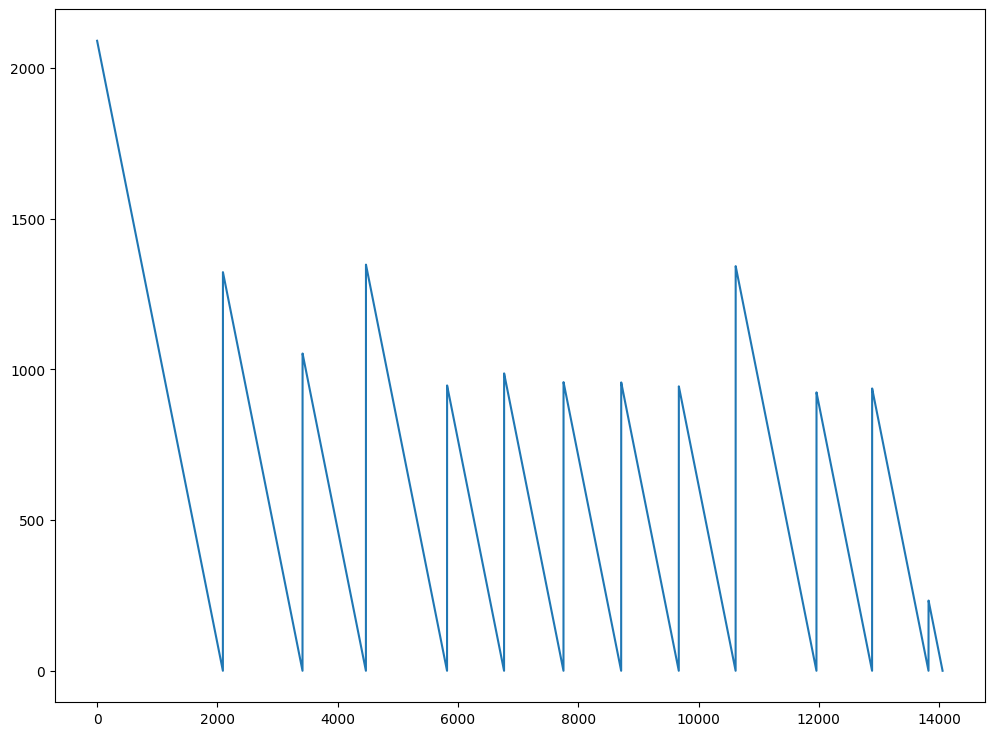

In [ ]:
plt.plot(df["label"])
plt.show()

## Data trends visualization

We will now plot some features (possibly zoomed), the positions, and the anomalies over the time axis.

Pay attention to how the mean and differencing methods helps to denoise the input signal and to enlight the unusual behaviours.

In [ ]:
def plot_all_signal(df, feature):
    plt.plot(df[feature], alpha=0.6)
    plt.plot(df["POSy"])
    ranges = (df["label"] == 0).map({True:0, False:30})
    plt.scatter(range(len(df)), ranges, color="red", s=20)
    plt.ylim(-9,5)
    plt.legend([feature, "POSy", 'Anomalies'], loc='upper right')
    plt.show()

In [ ]:
def plot_all_signal_zoomed(df, feature):
    for i in range(0, len(df) - 1000, 1000):
        start = i
        end = i + 1000
        plt.plot(df[feature][start:end], alpha=0.6)
        plt.plot(df["POSy"][start:end])
        ranges = (df["label"] == 0).map({True:0, False:30})
        plt.scatter(range(start, end), ranges[start:end], color="red", s=20)
        plt.ylim(-9,5)
        plt.legend([feature, "POSy", 'Anomalies'], loc='upper right')
        plt.show()

In [ ]:
def plot_only_faults(df, feature):
    for i, is_fault in enumerate((df["label"] == 0).tolist()):
        if is_fault:
            start = i - 20
            end = i + 1
            plt.plot(df[feature][start:end], alpha=0.6)
            plt.plot(df["POSy"][start:end])
            ranges = (df["label"] == 0).map({True:0, False:30})
            plt.scatter(range(start, end), ranges[start:end], color="red", s=20)
            plt.ylim(-9,5)
            plt.legend([feature, "POSy", 'Anomalies'], loc='upper right')
            plt.show()

#### Ax: raw values

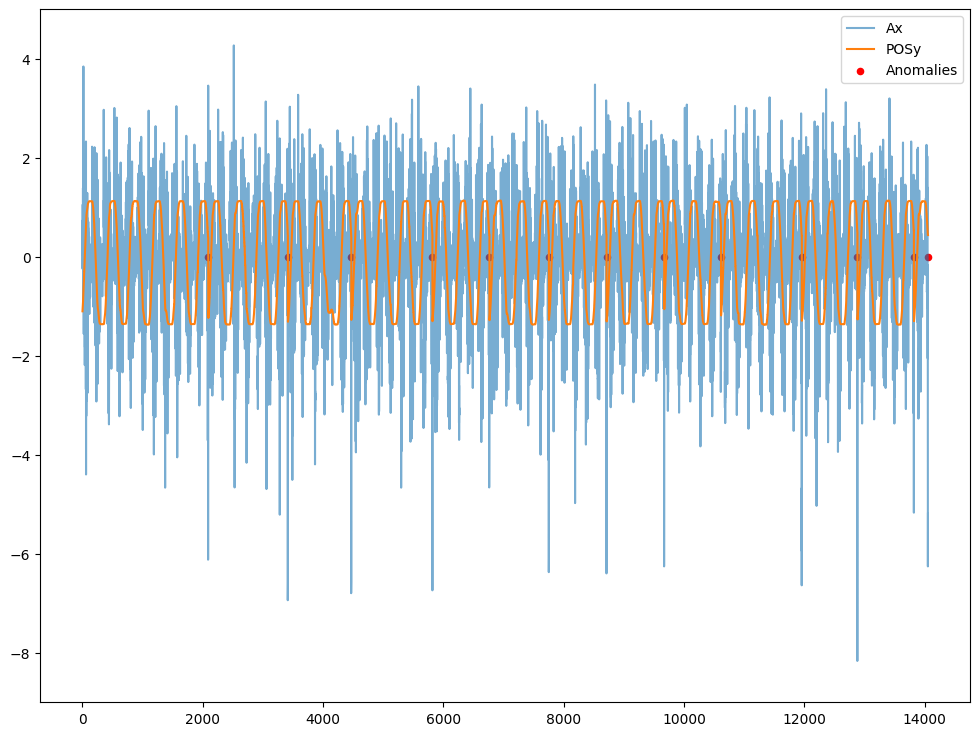

In [ ]:
plot_all_signal(df, "Ax")

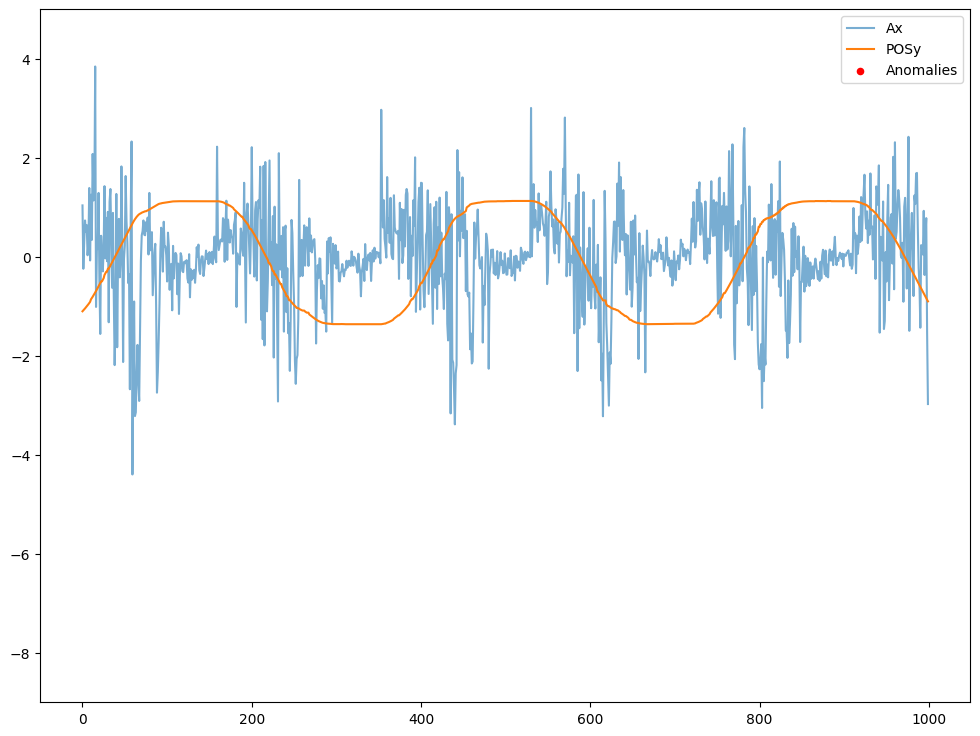

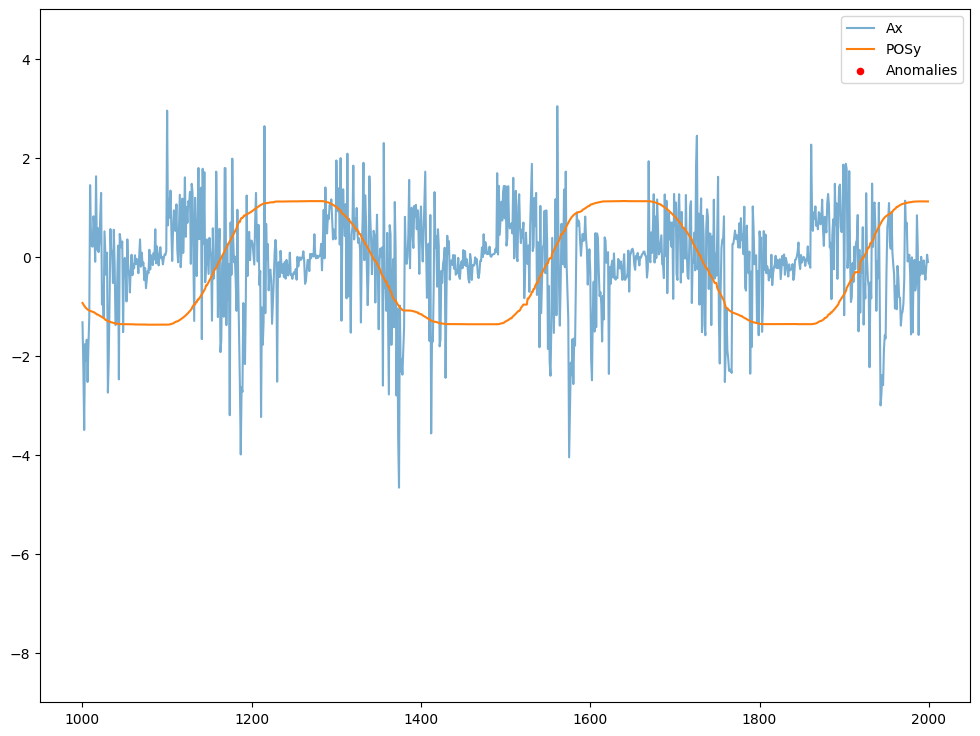

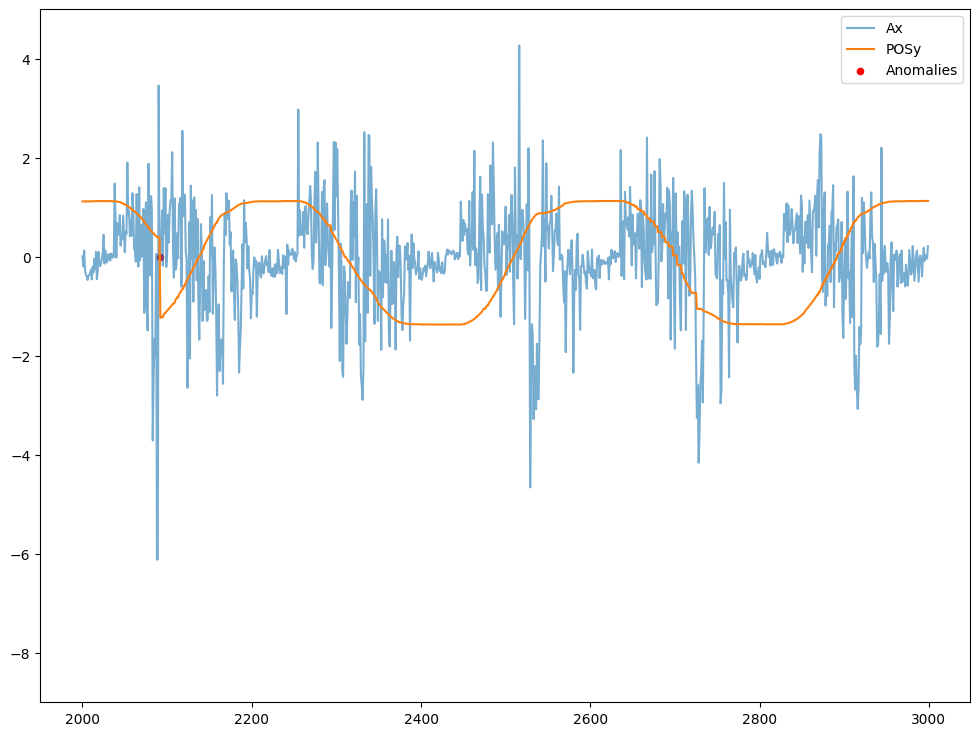

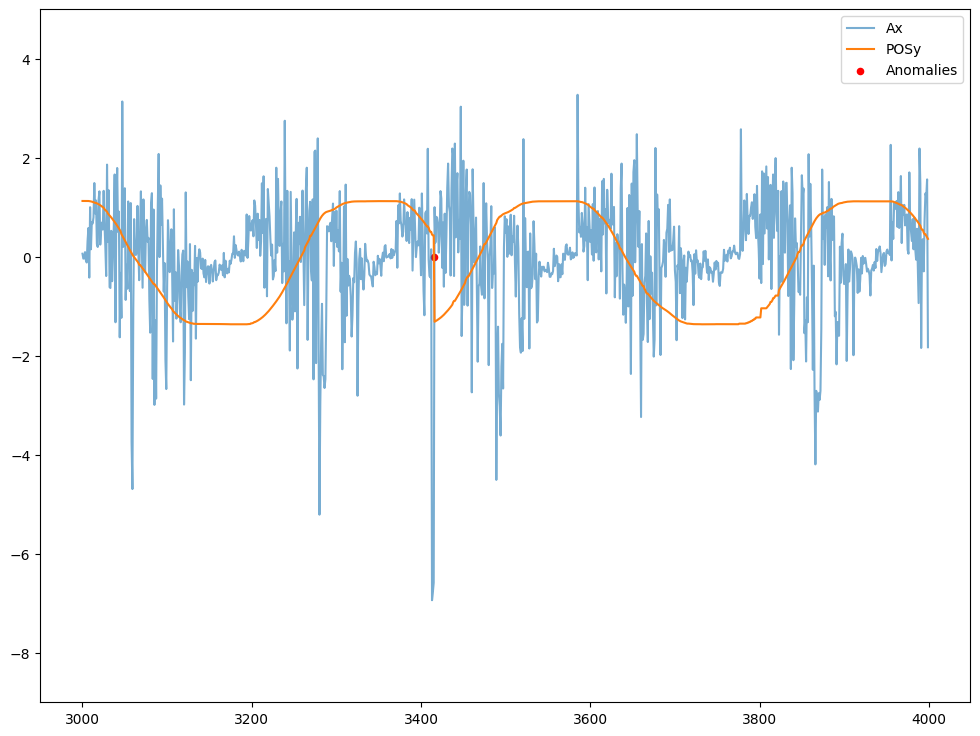

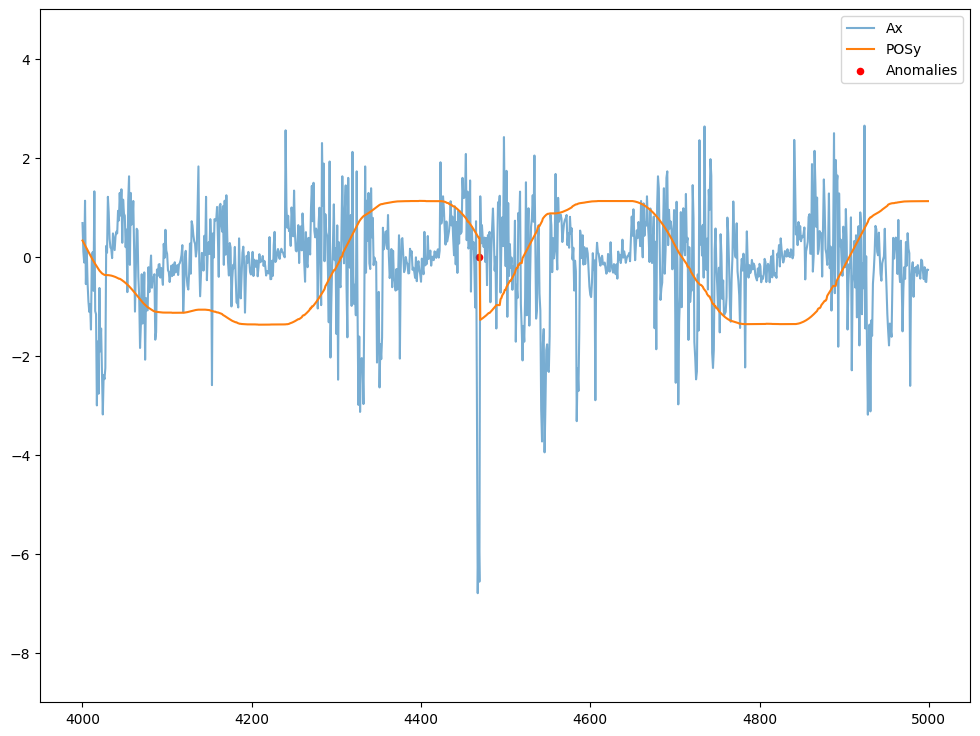

...

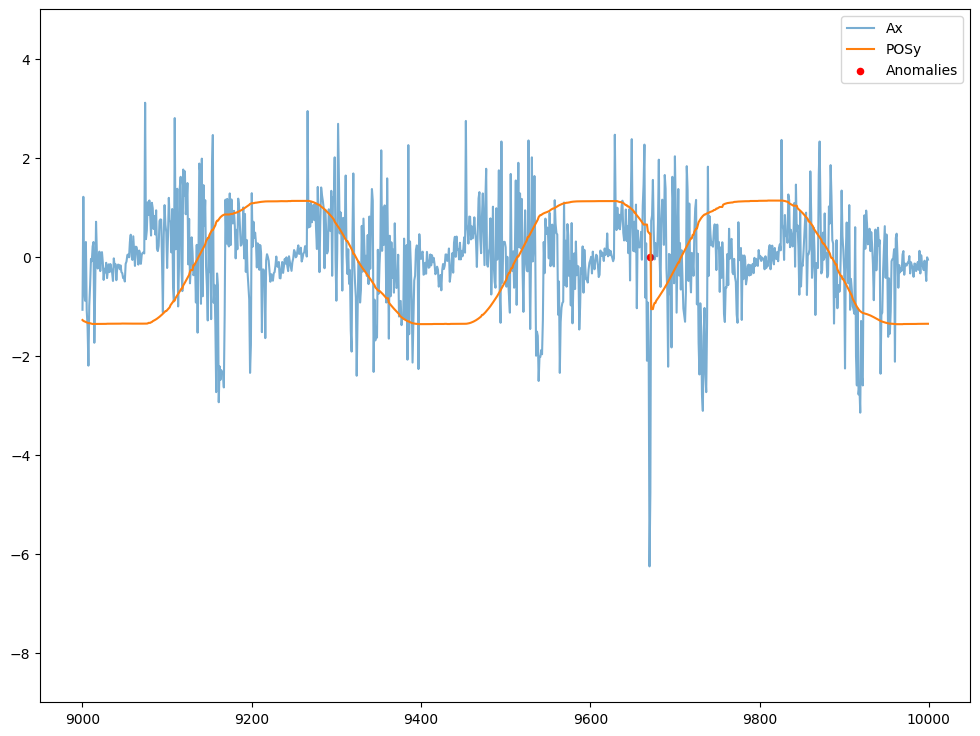

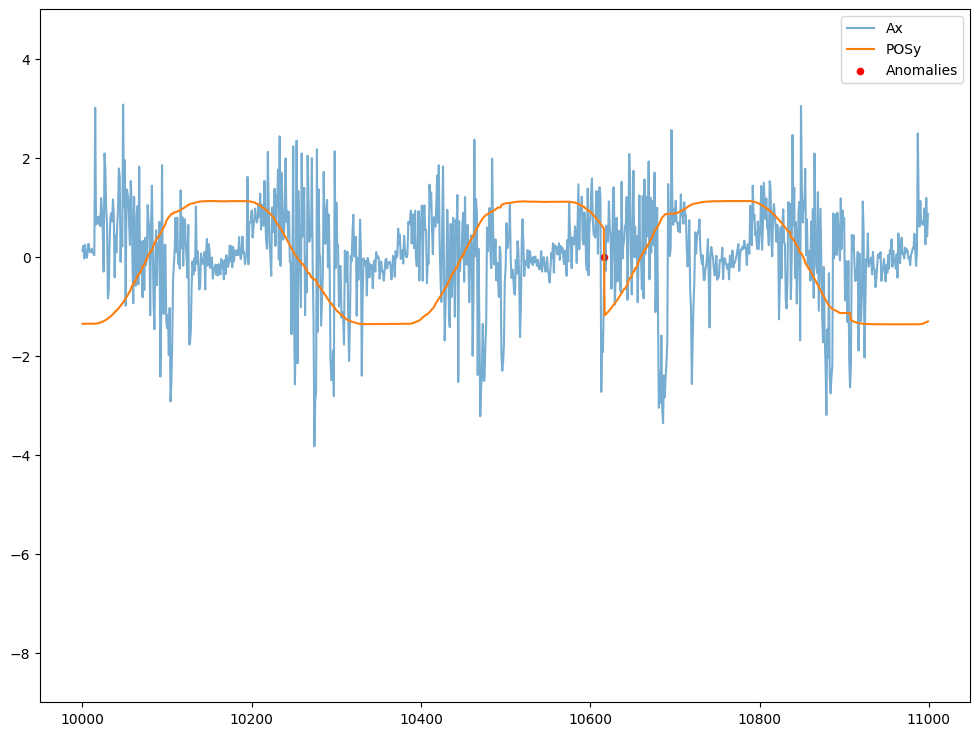

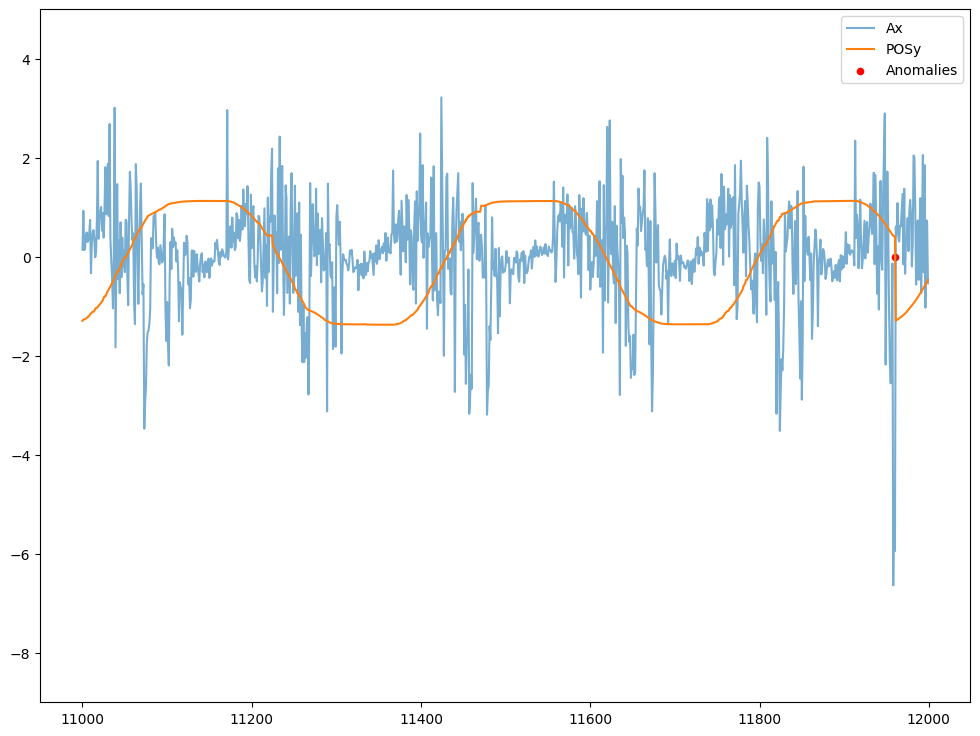

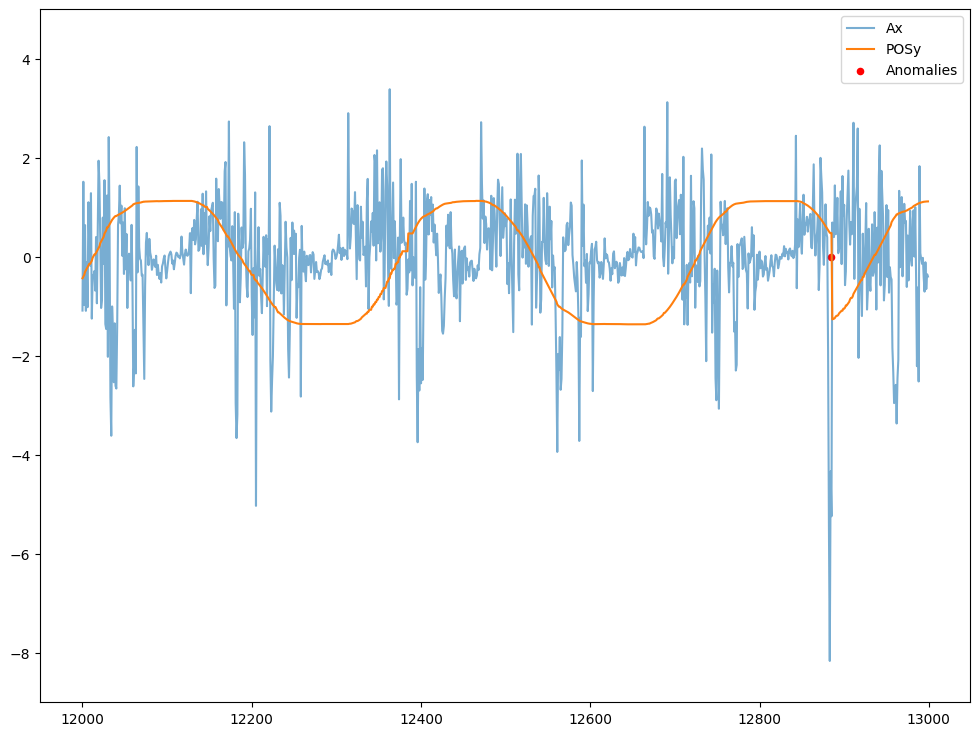

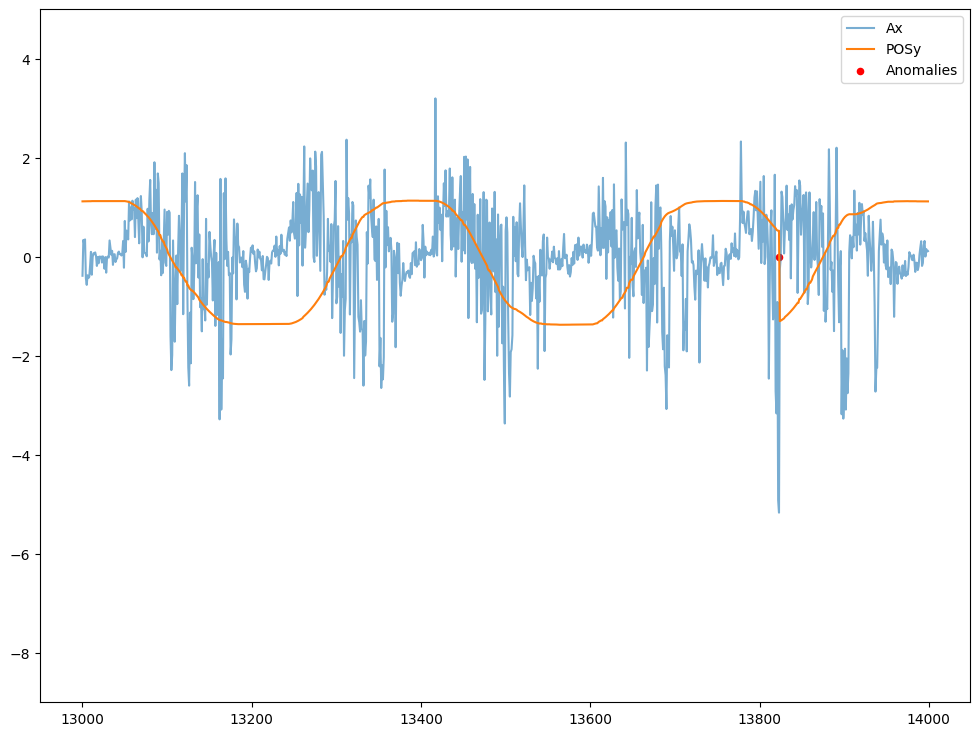

In [ ]:
plot_all_signal_zoomed(df, "Ax")

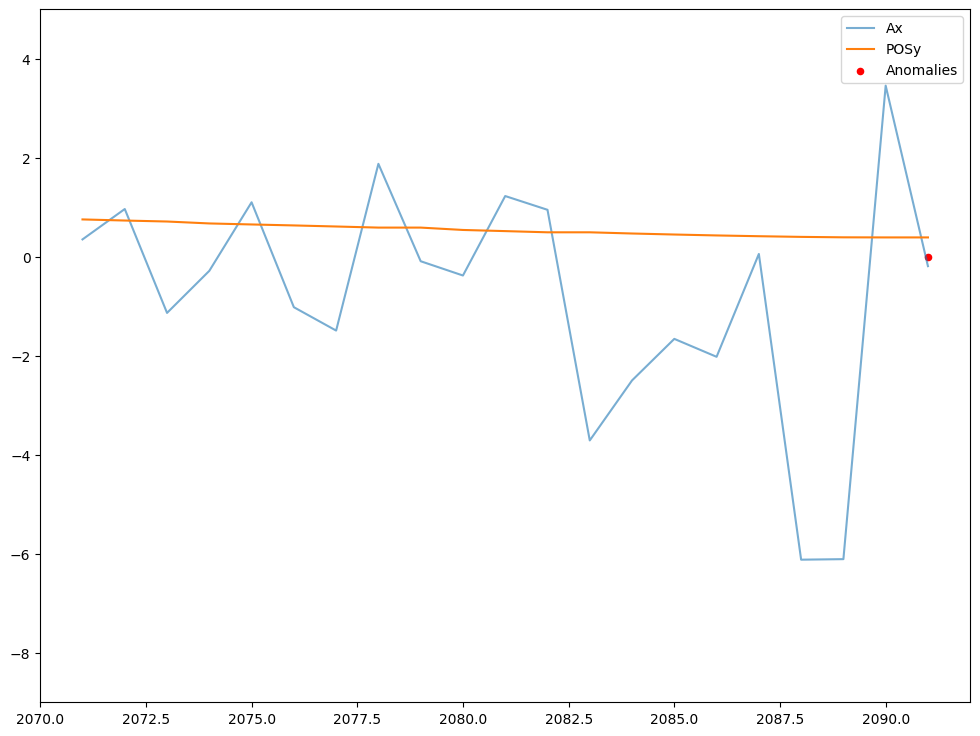

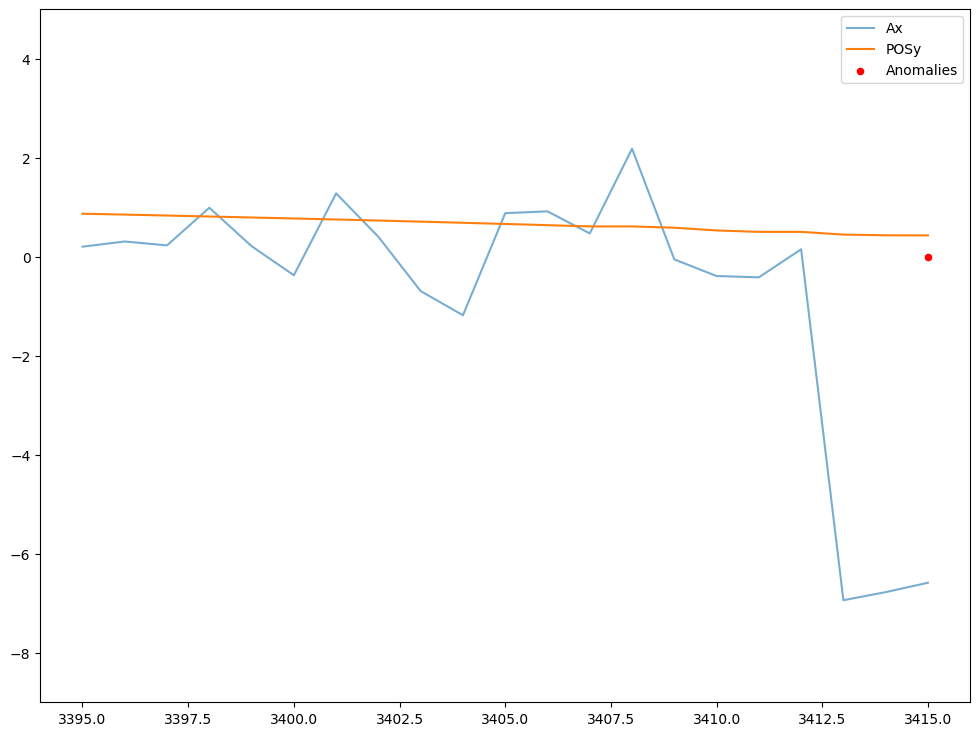

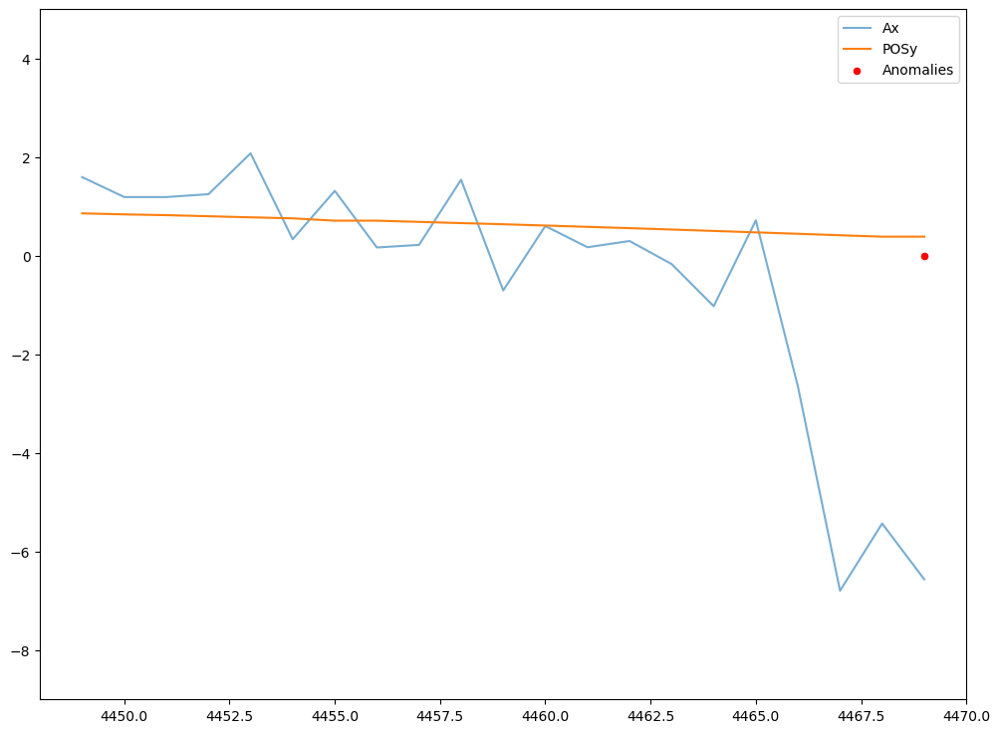

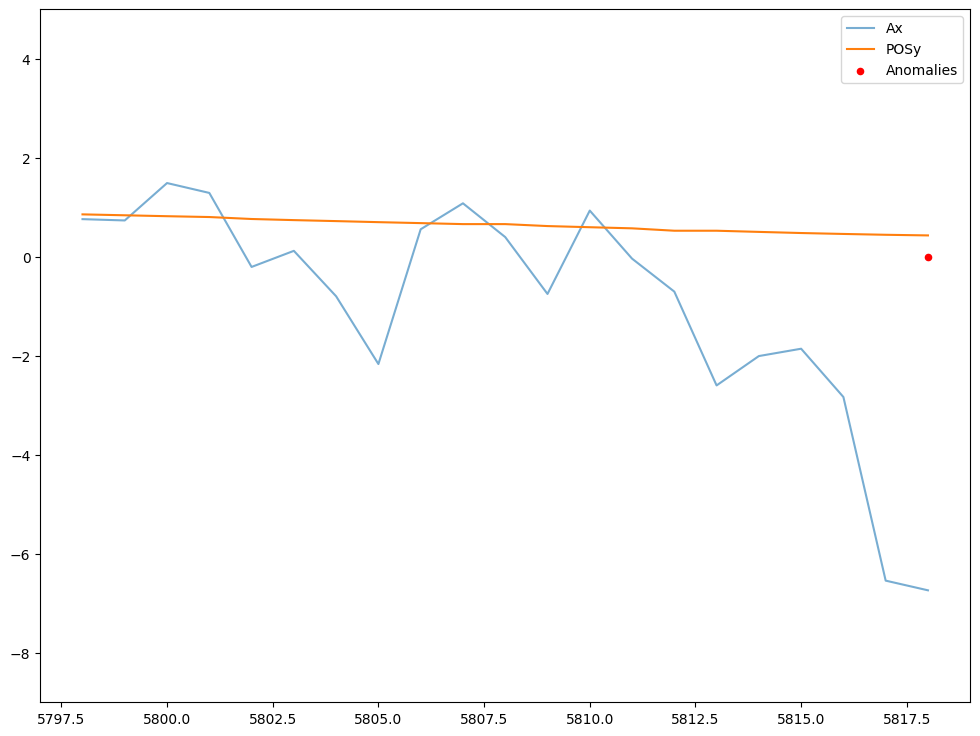

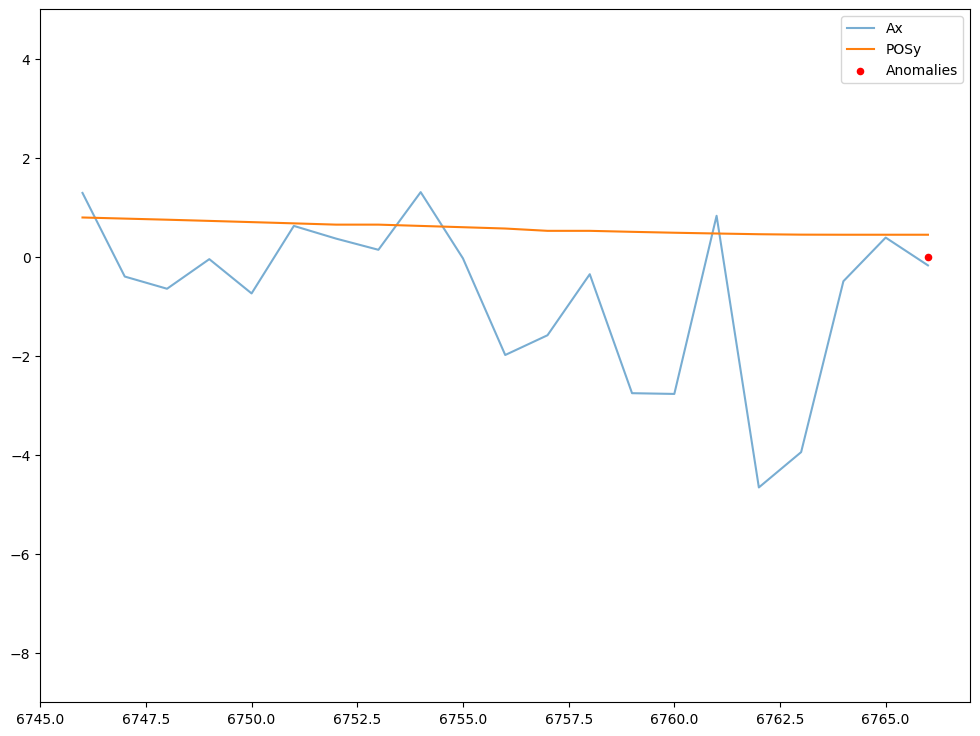

...

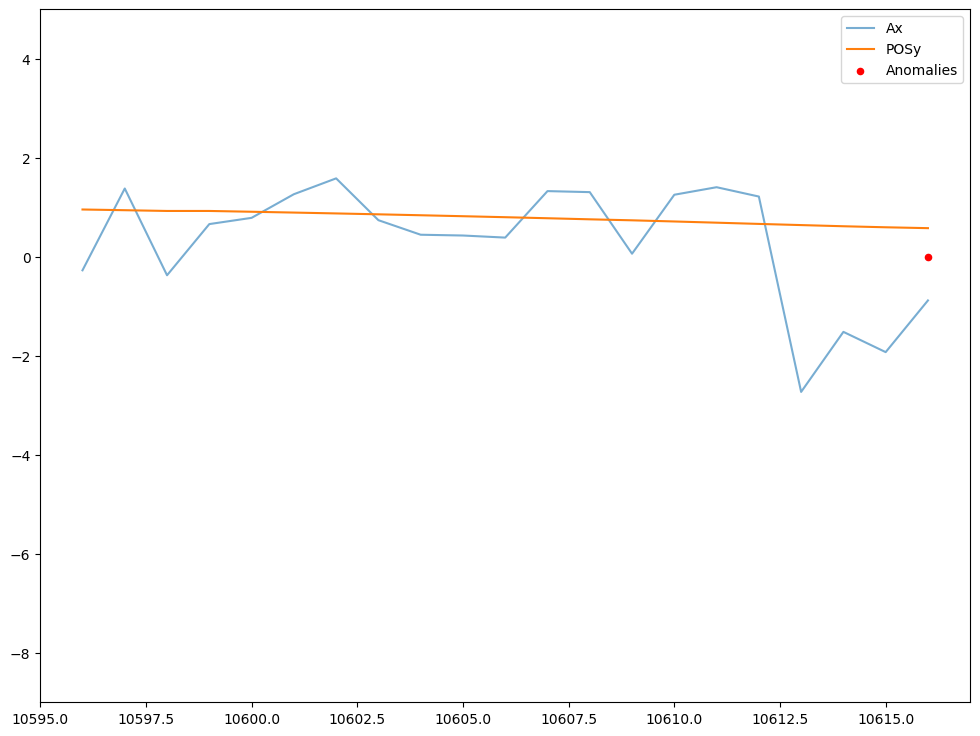

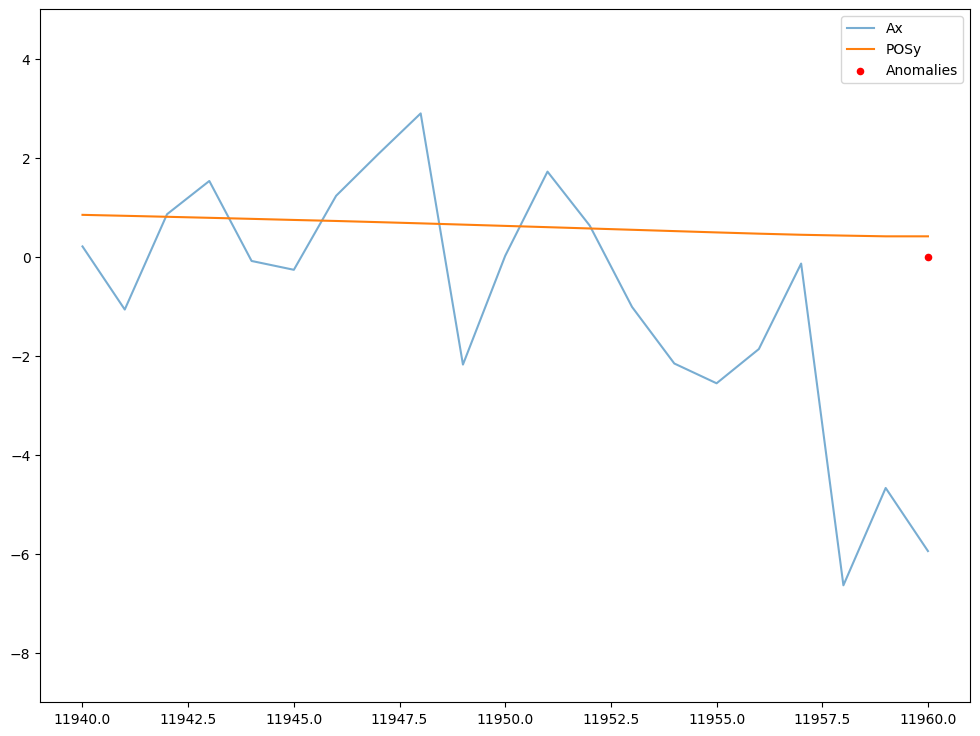

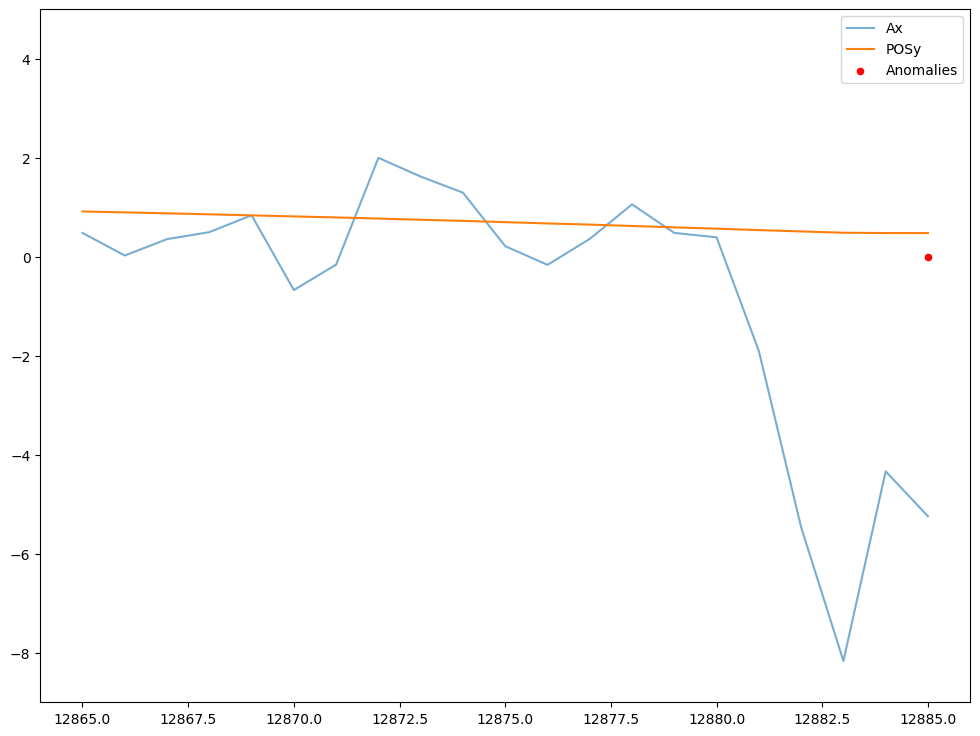

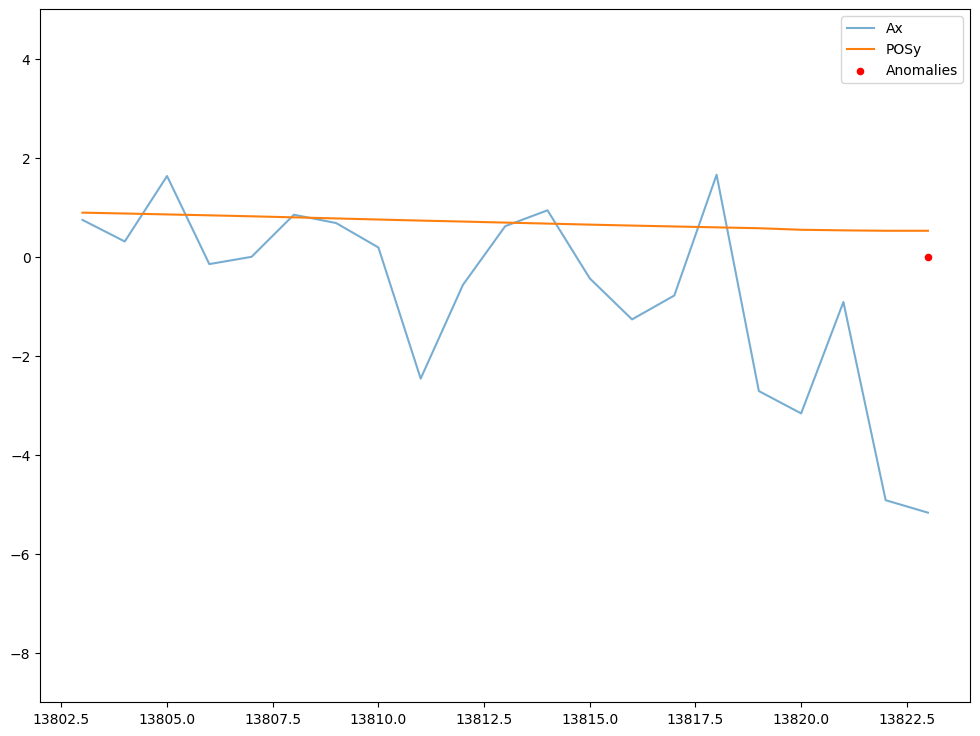

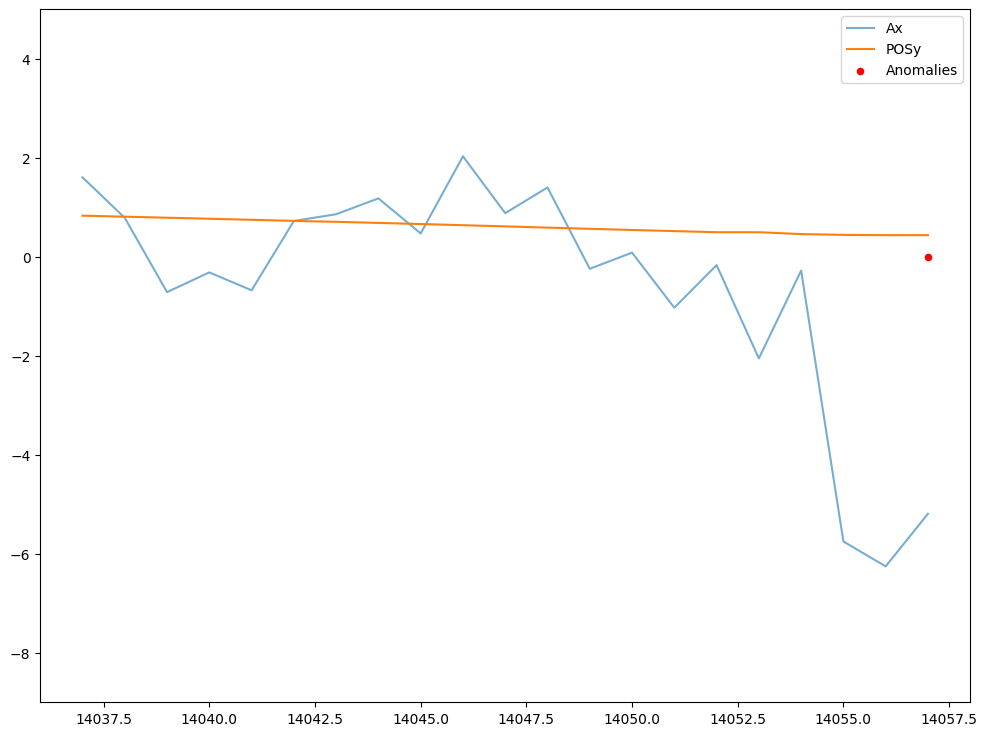

In [ ]:
plot_only_faults(df, "Ax")

#### Ax: mean values

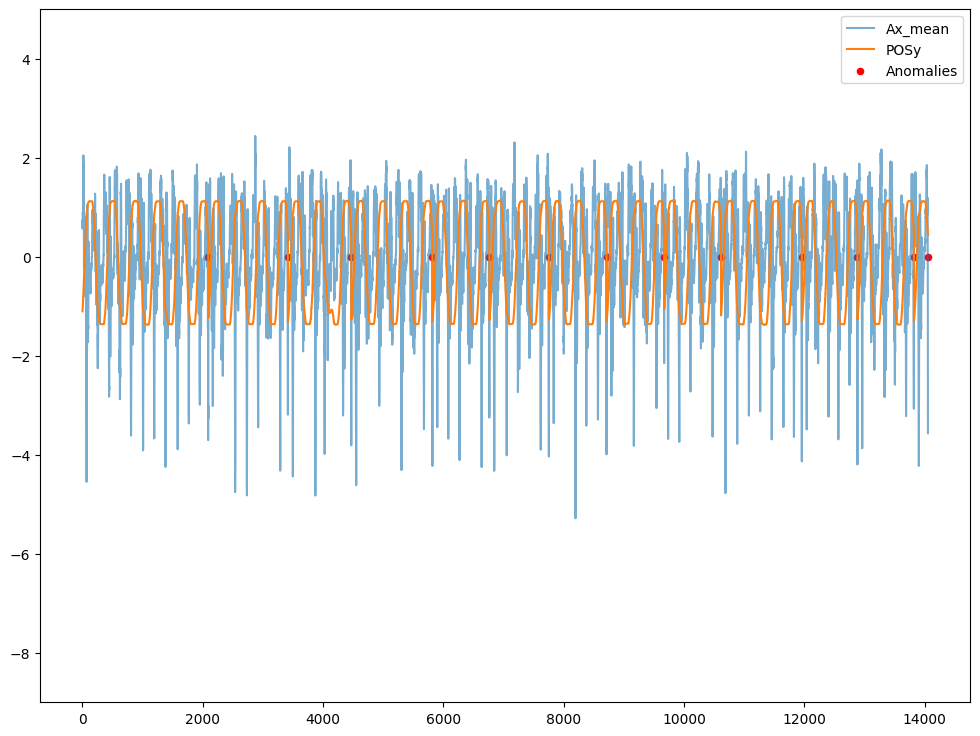

In [ ]:
plot_all_signal(df, "Ax_mean")

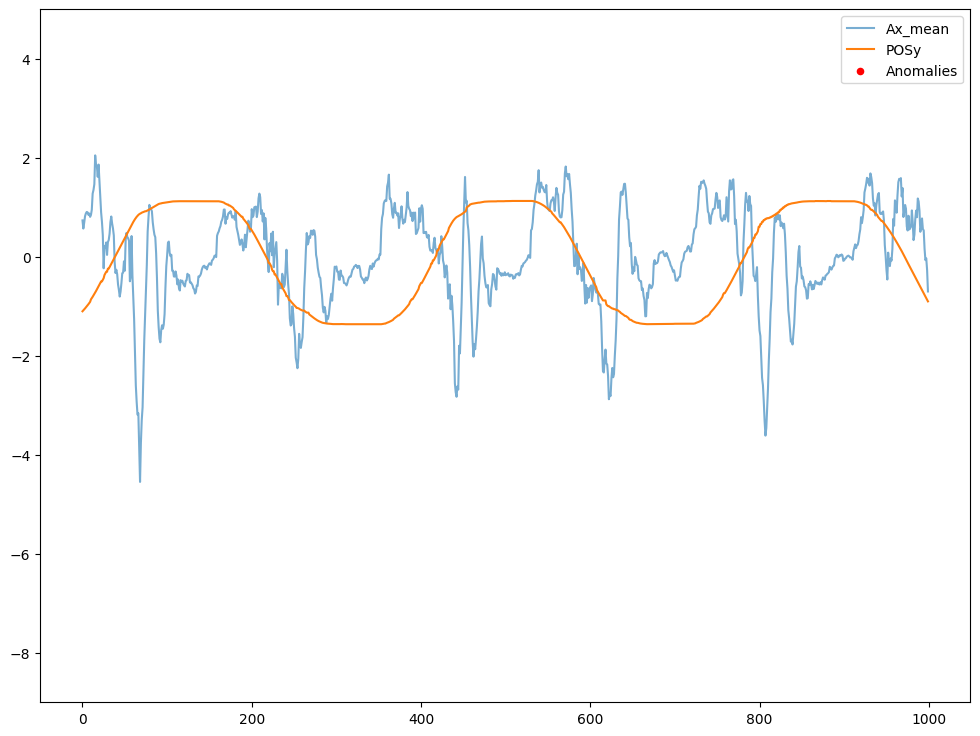

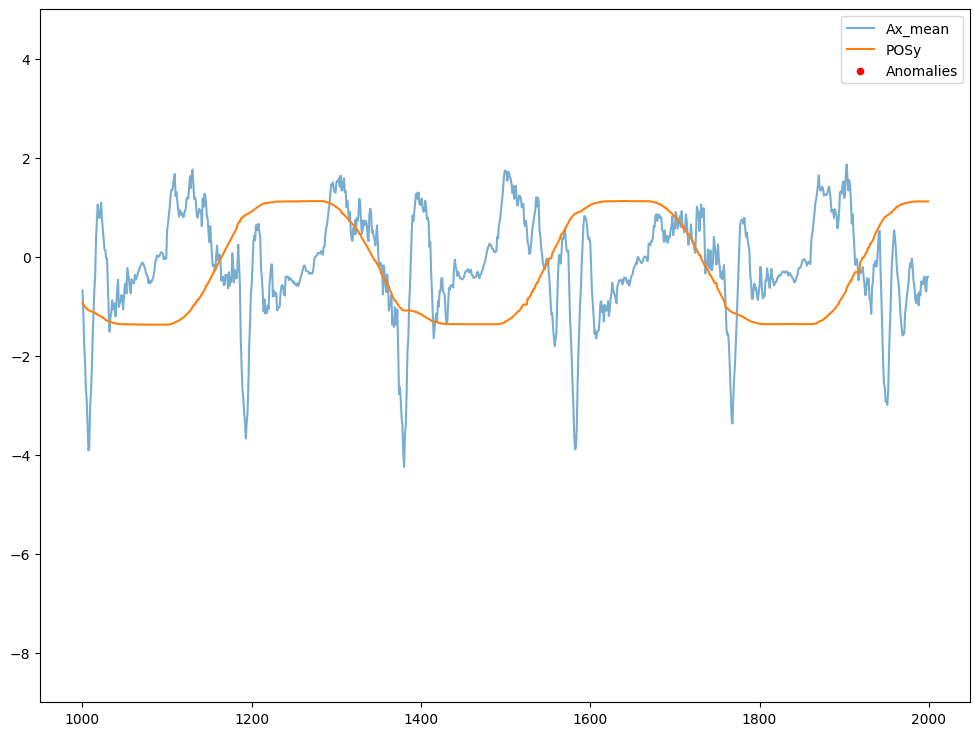

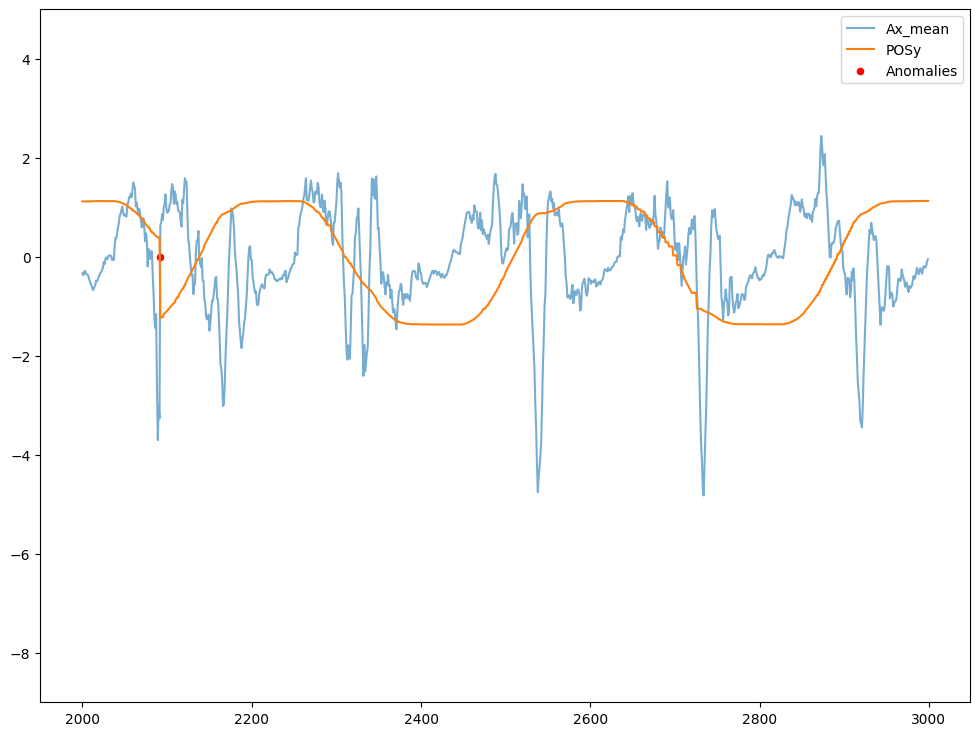

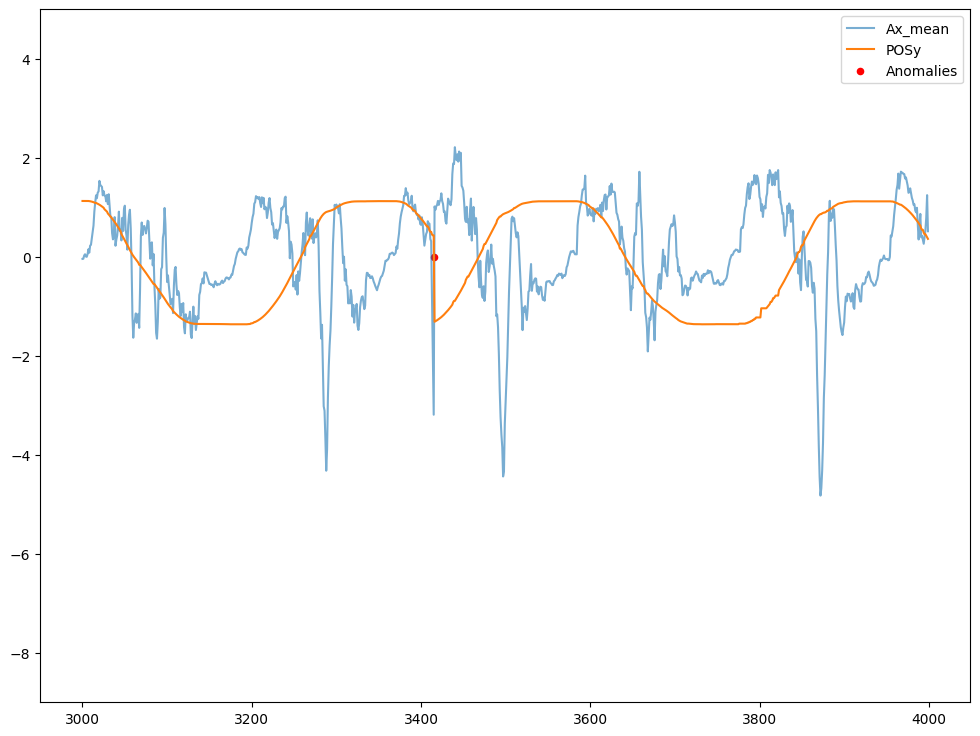

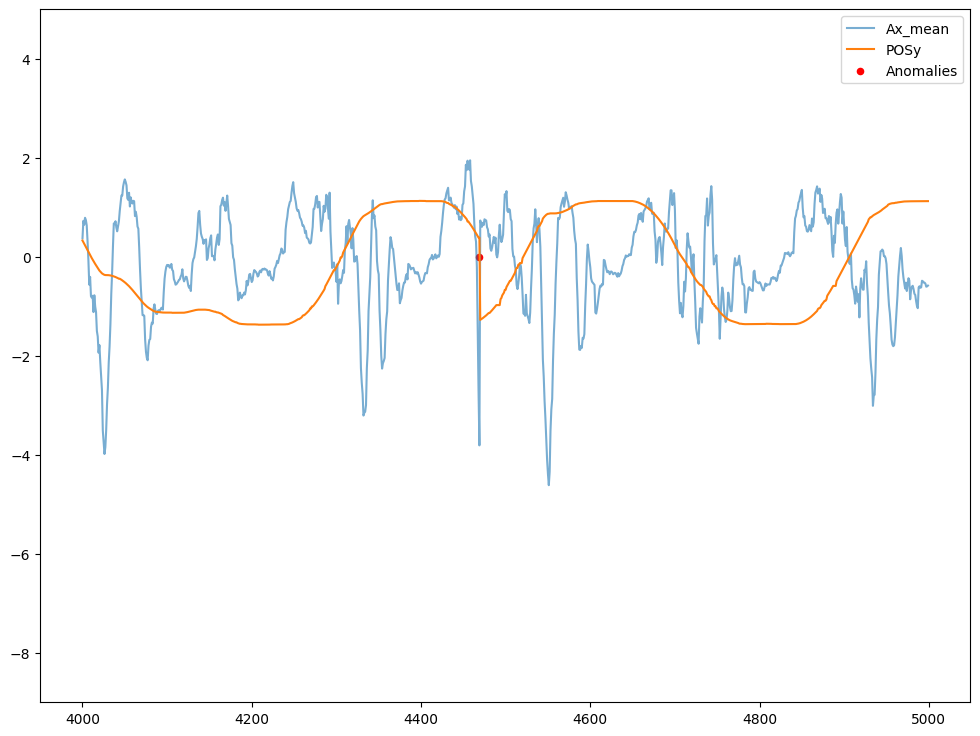

...

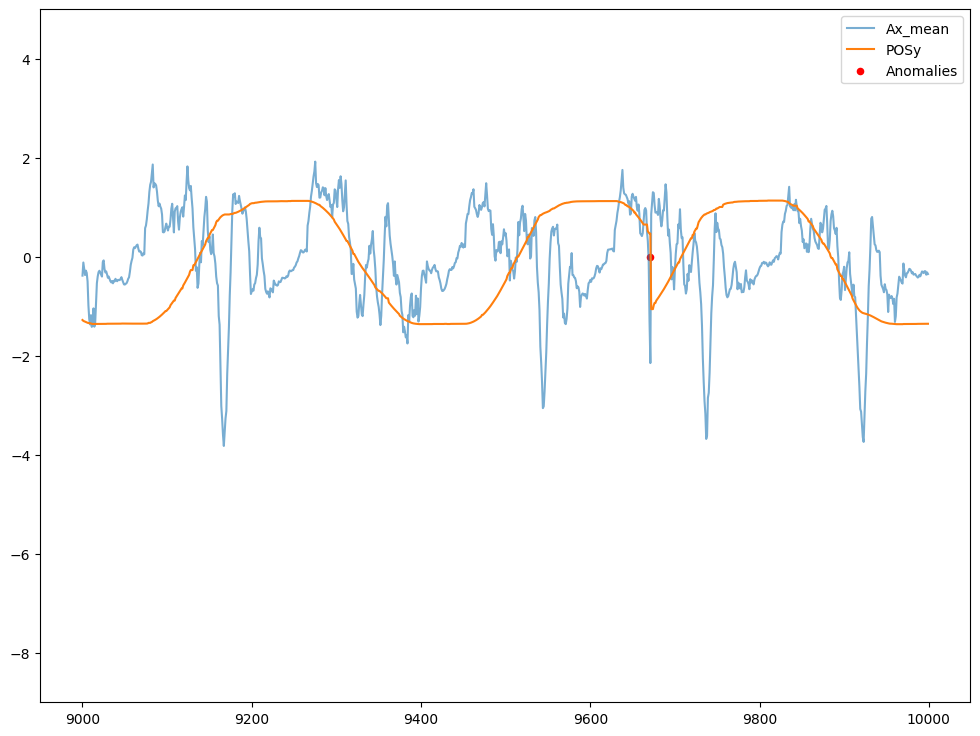

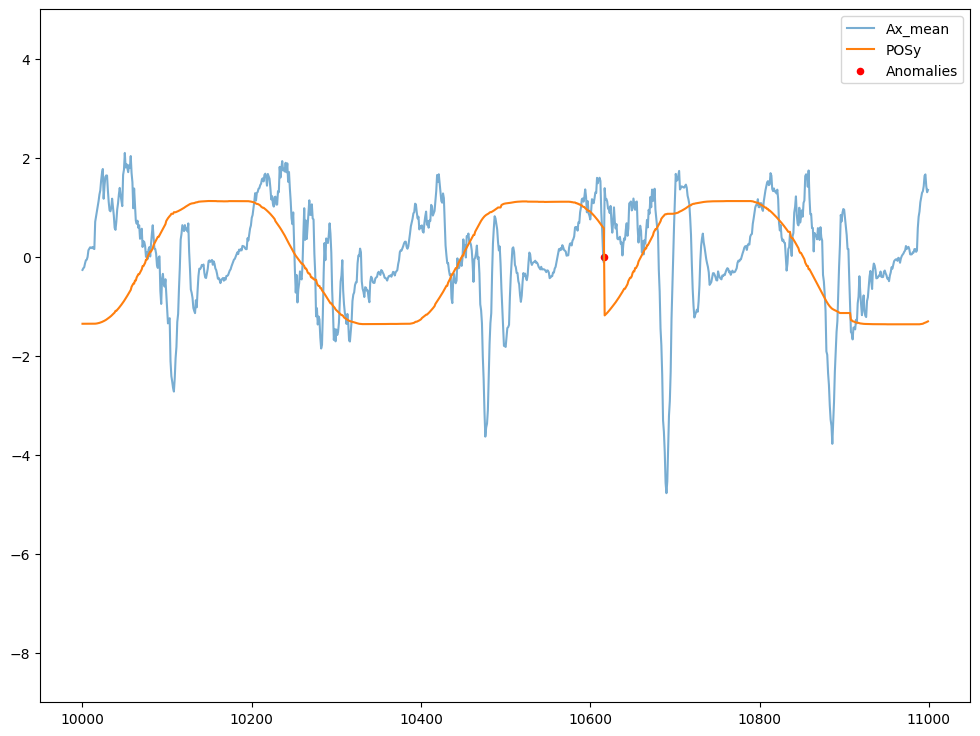

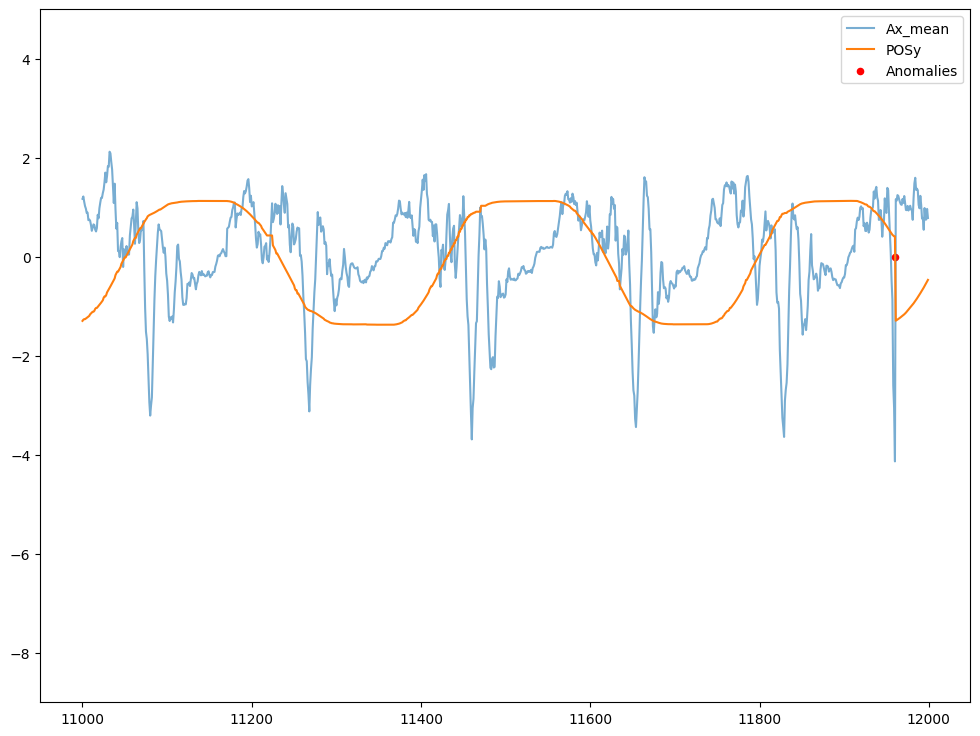

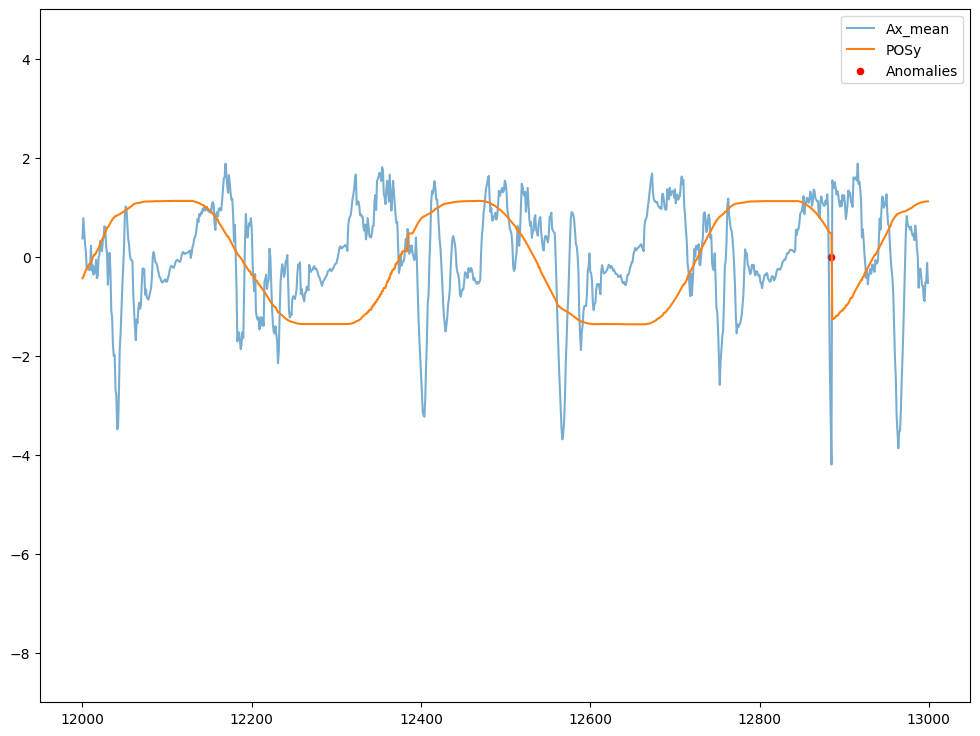

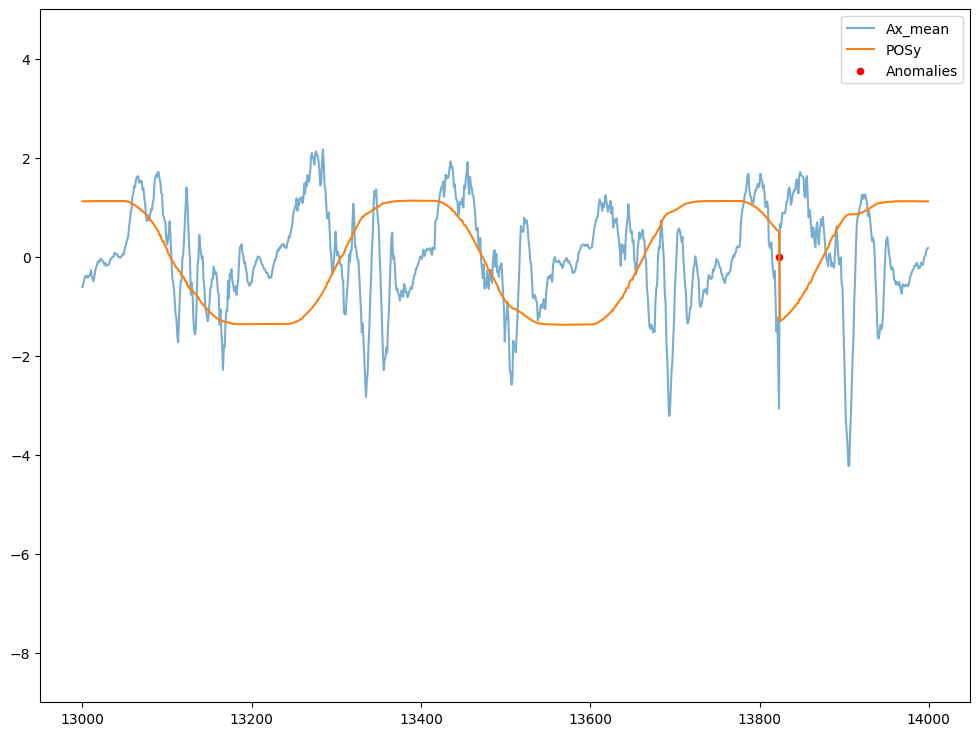

In [ ]:
plot_all_signal_zoomed(df, "Ax_mean")

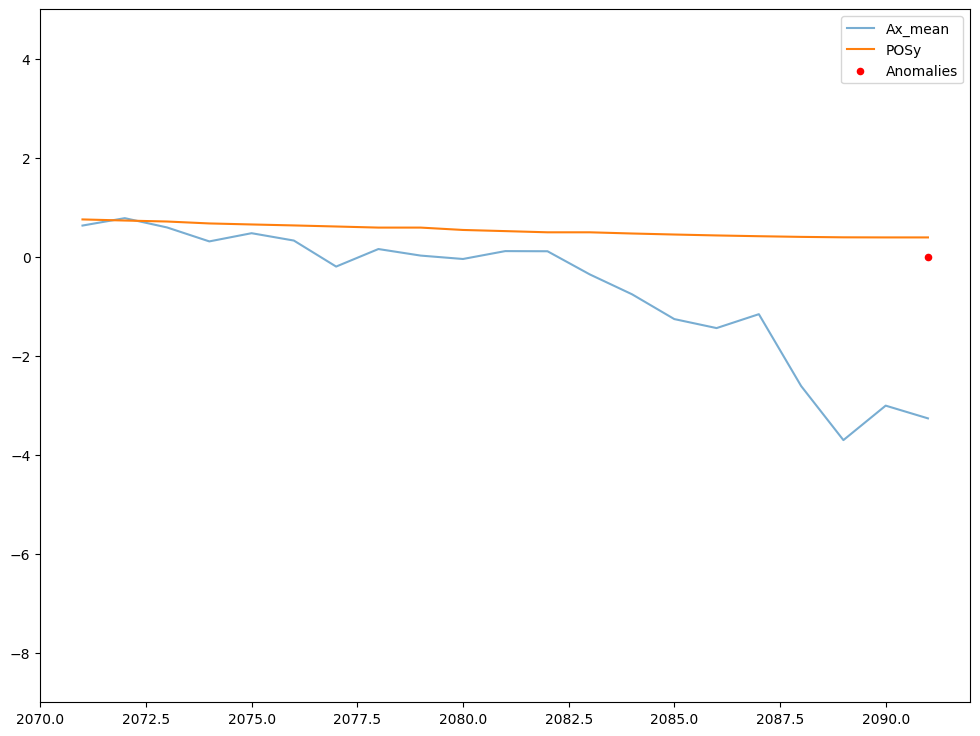

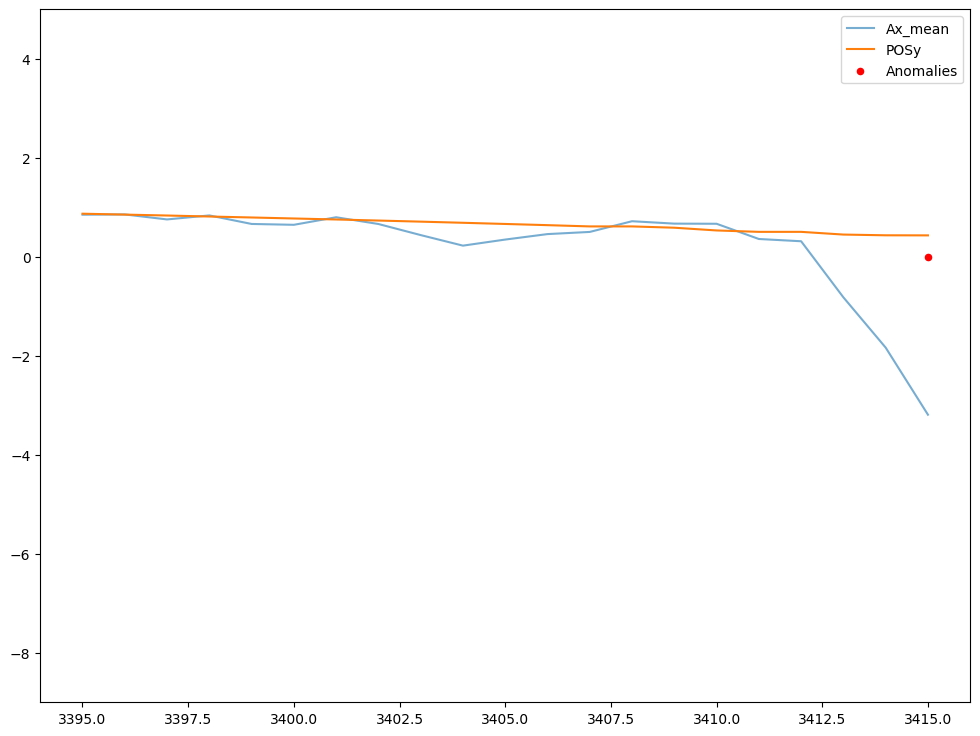

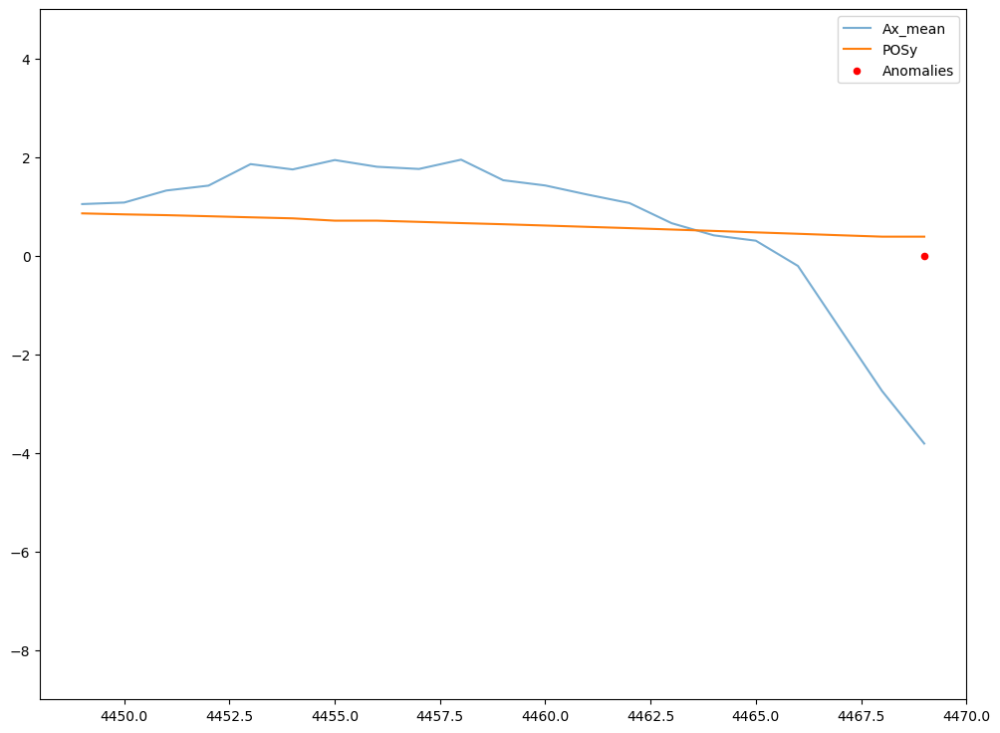

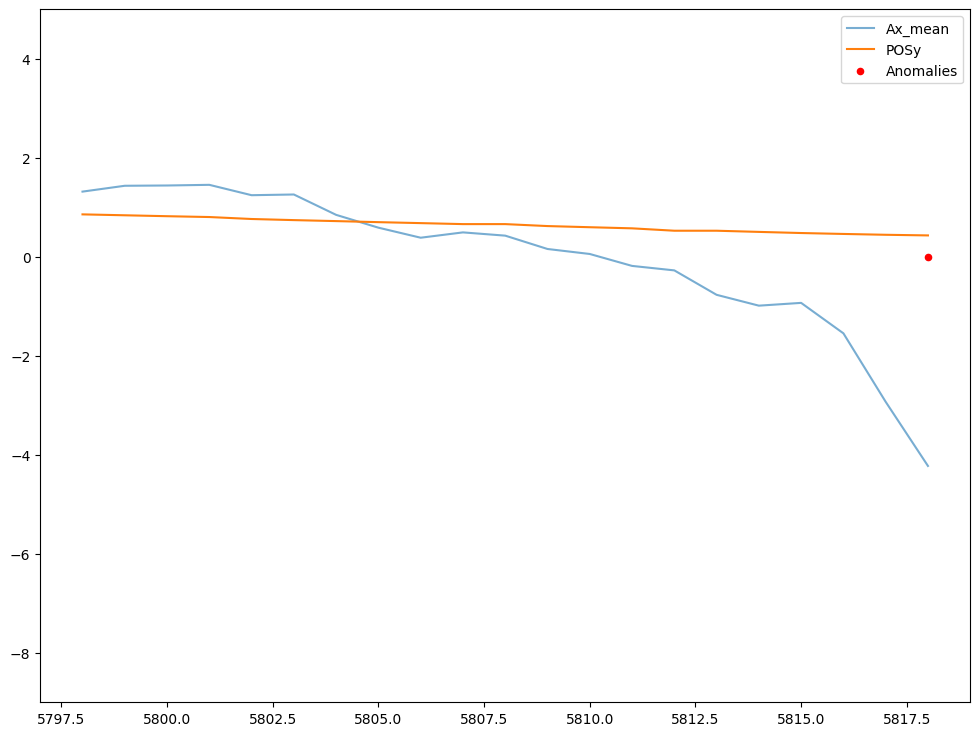

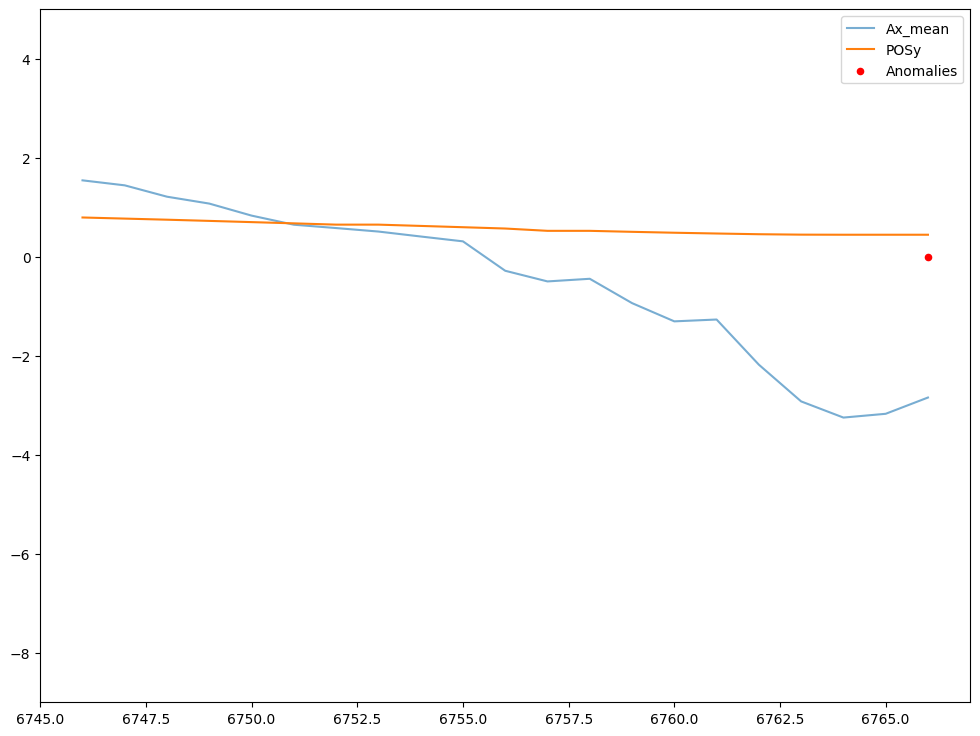

...

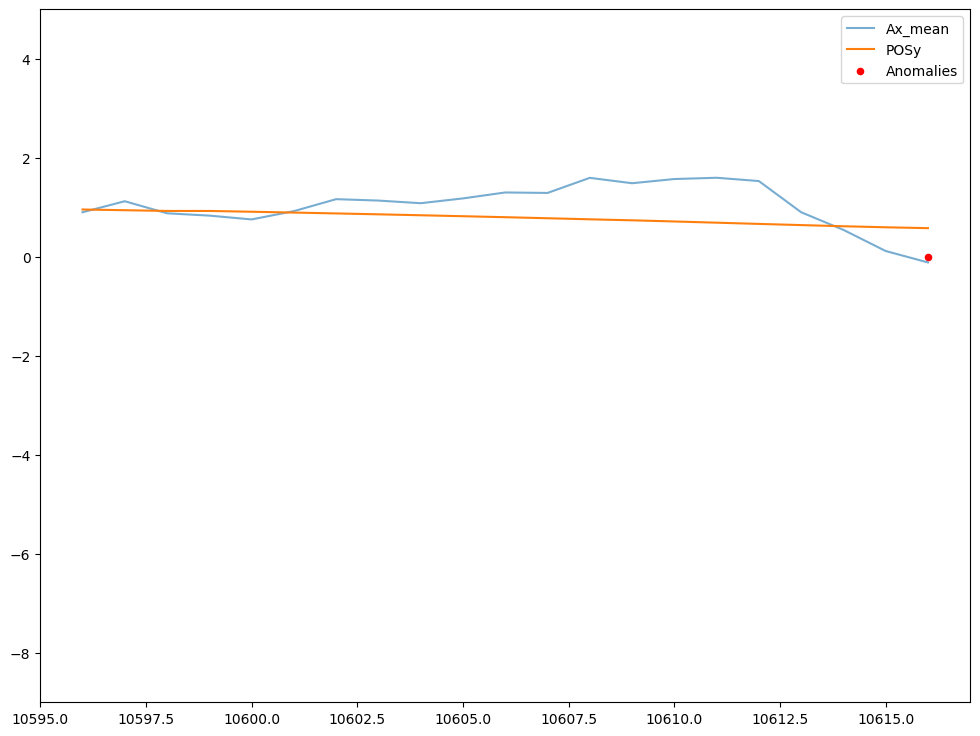

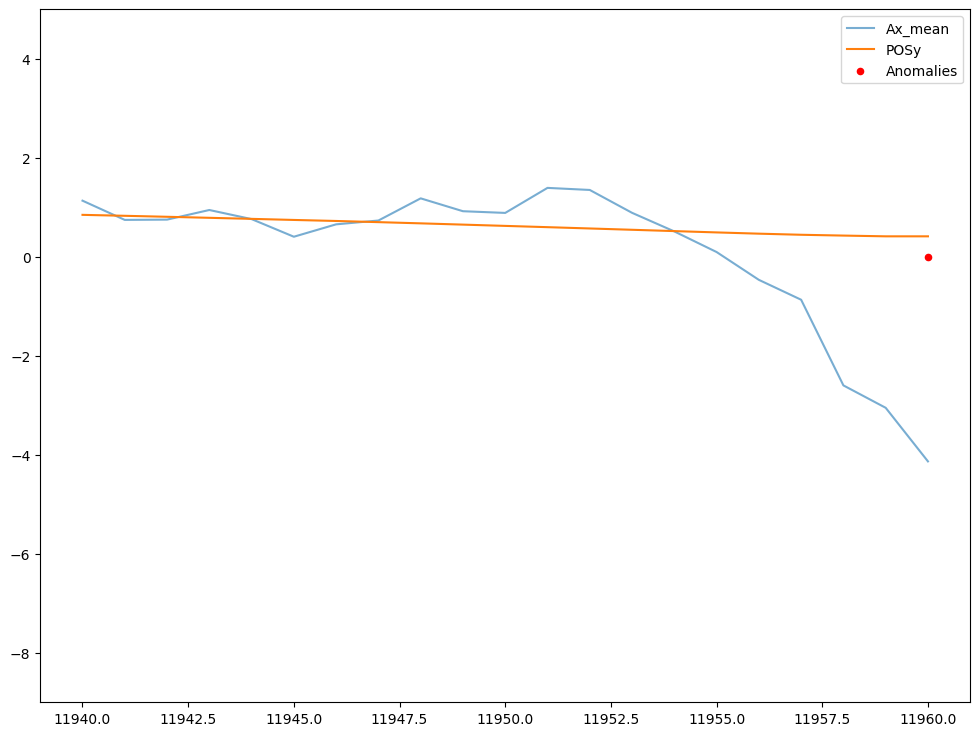

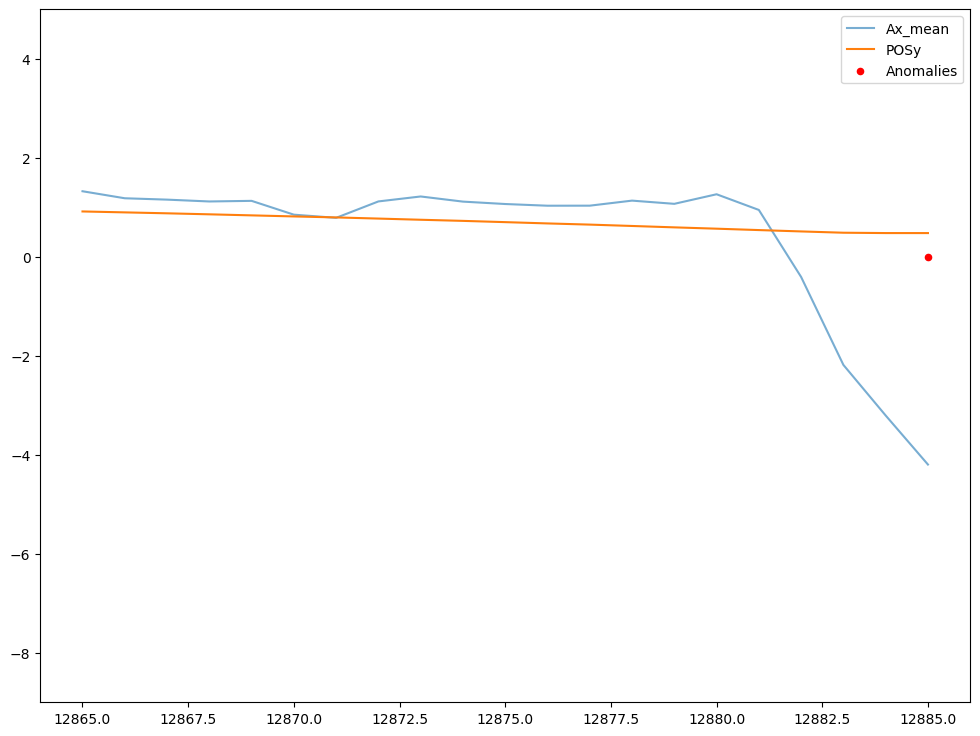

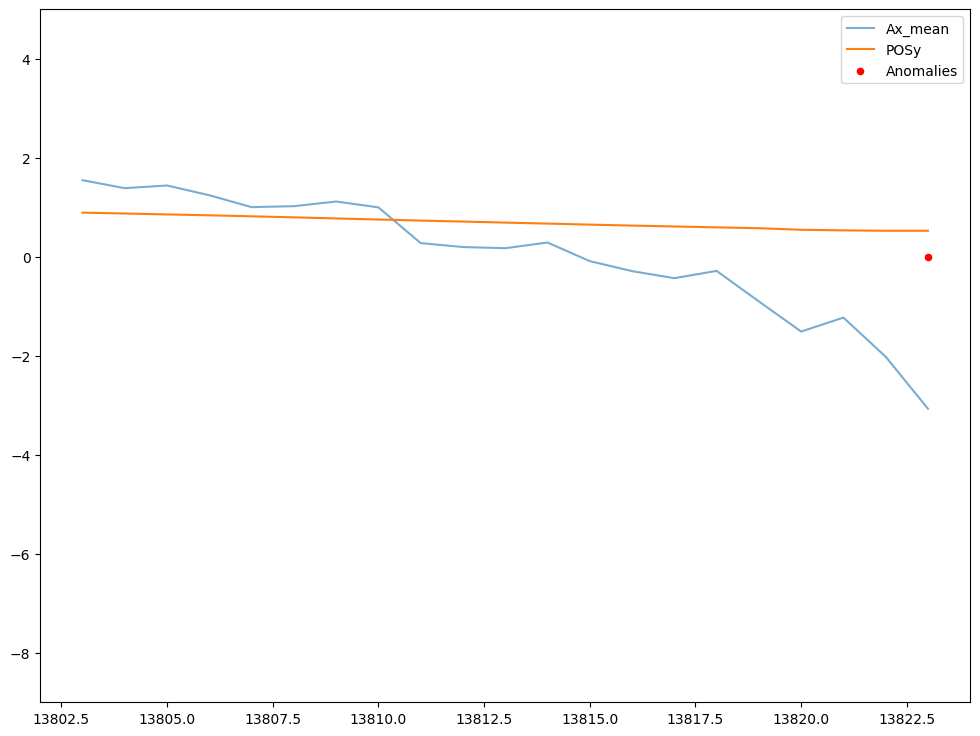

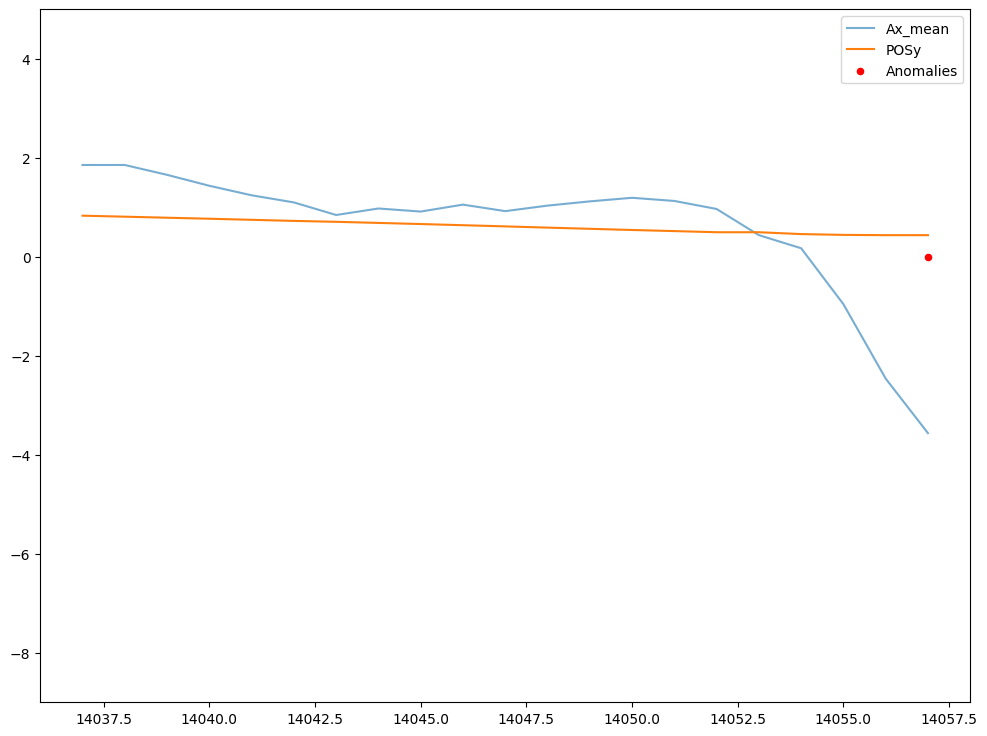

In [ ]:
plot_only_faults(df, "Ax_mean")

#### Ax: mean values with differencing

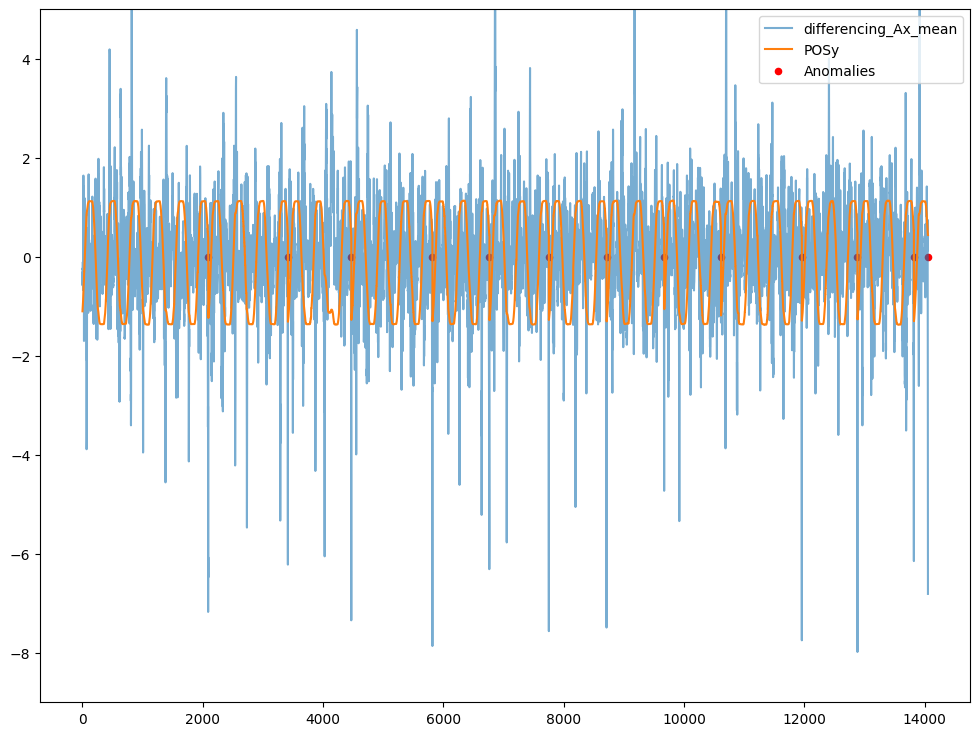

In [ ]:
plot_all_signal(df, "differencing_Ax_mean")

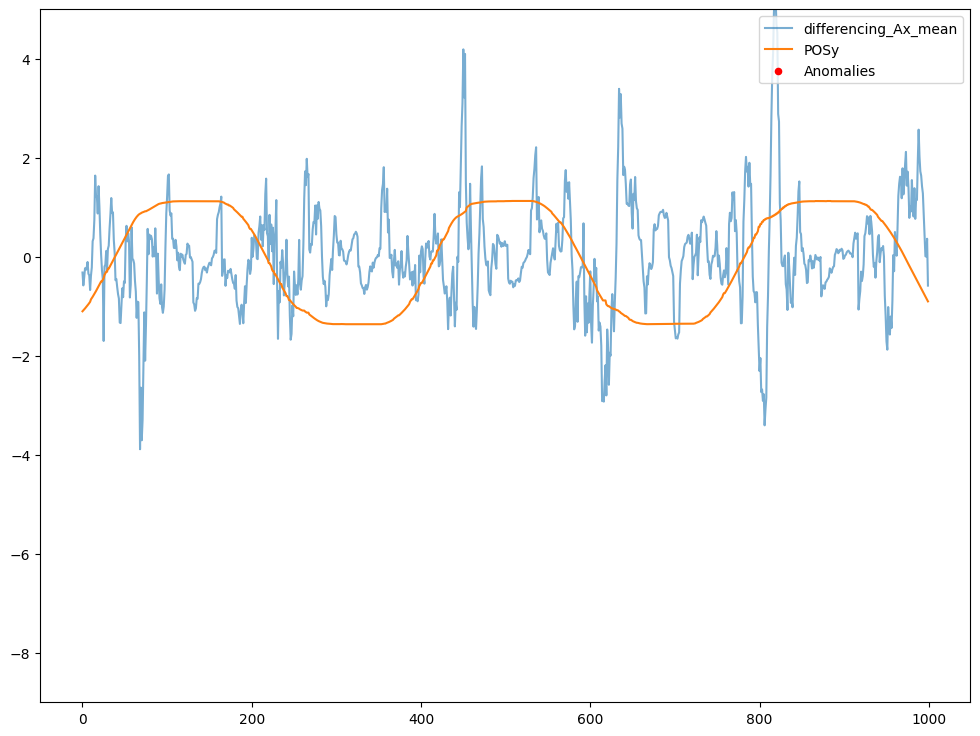

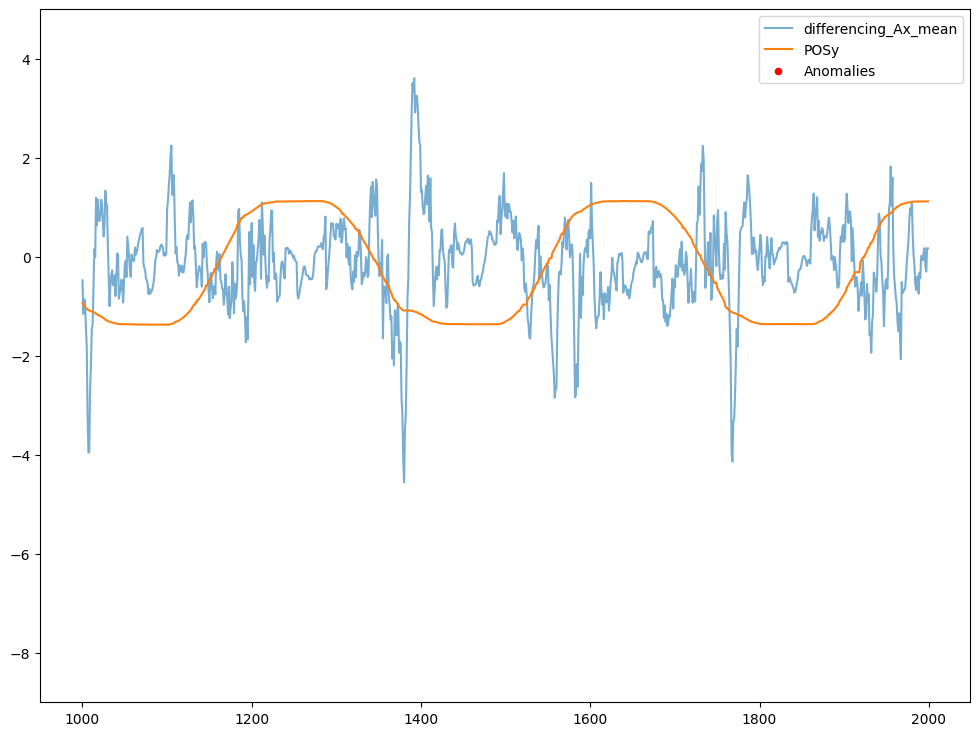

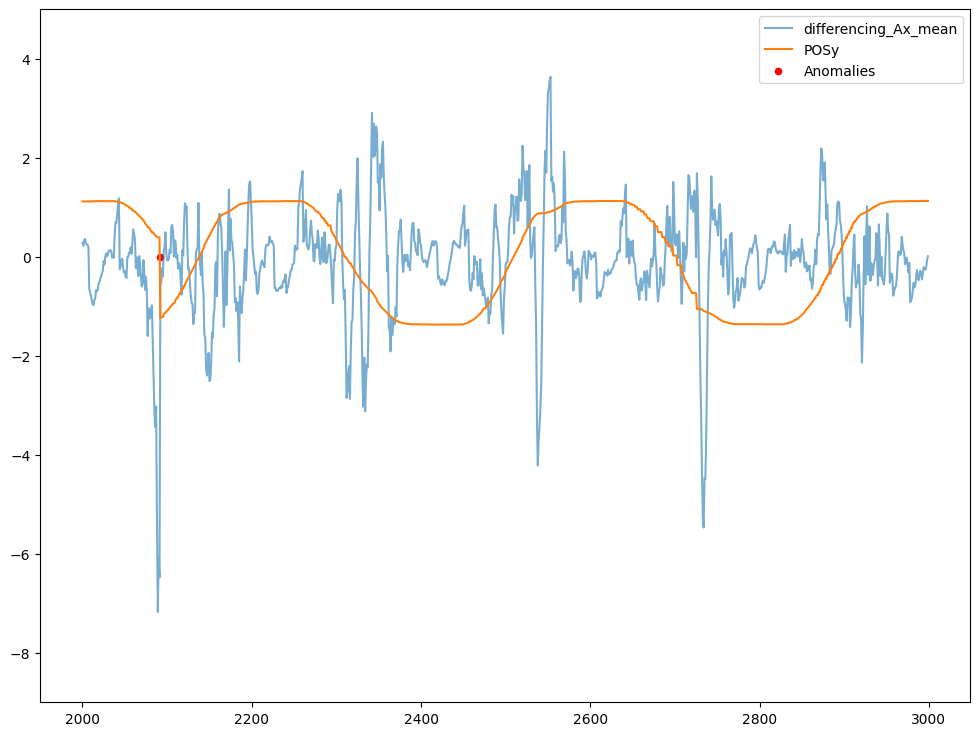

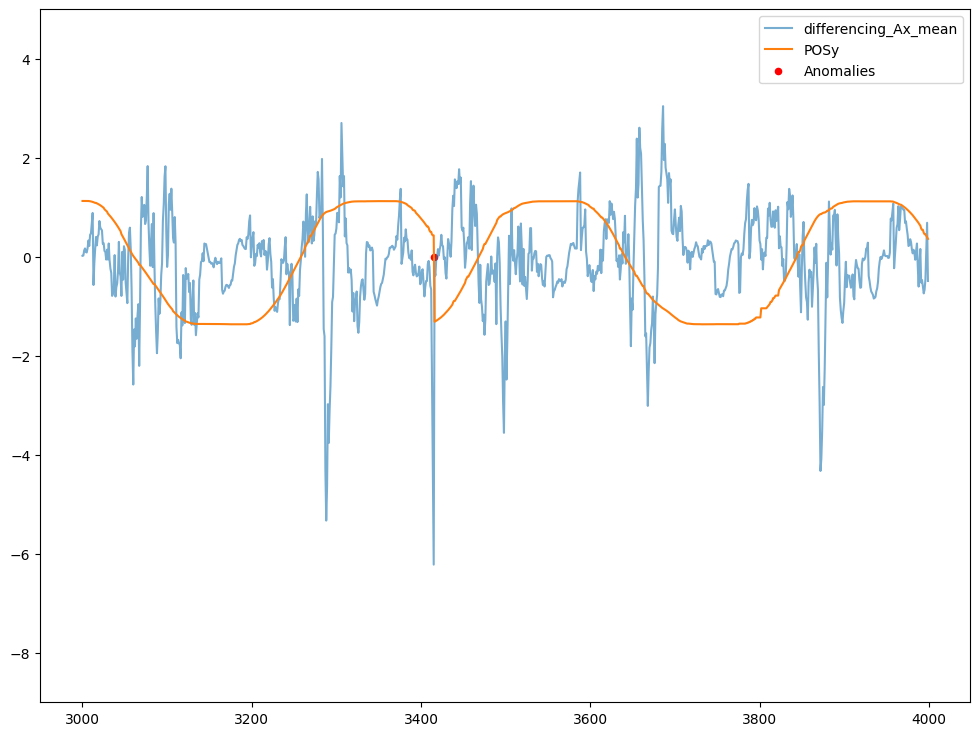

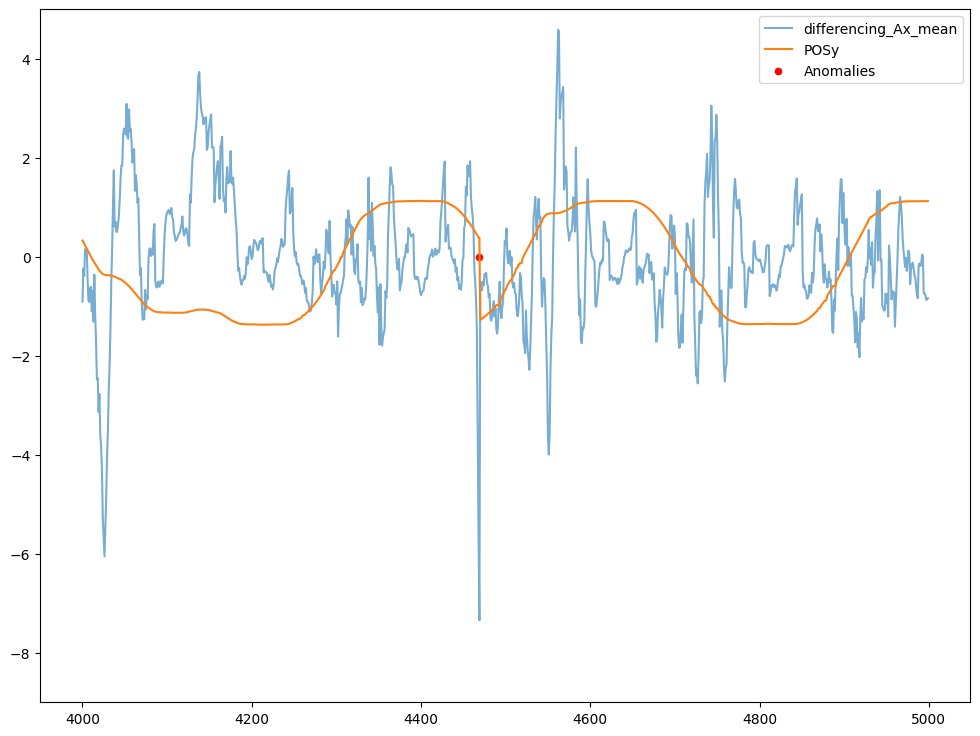

...

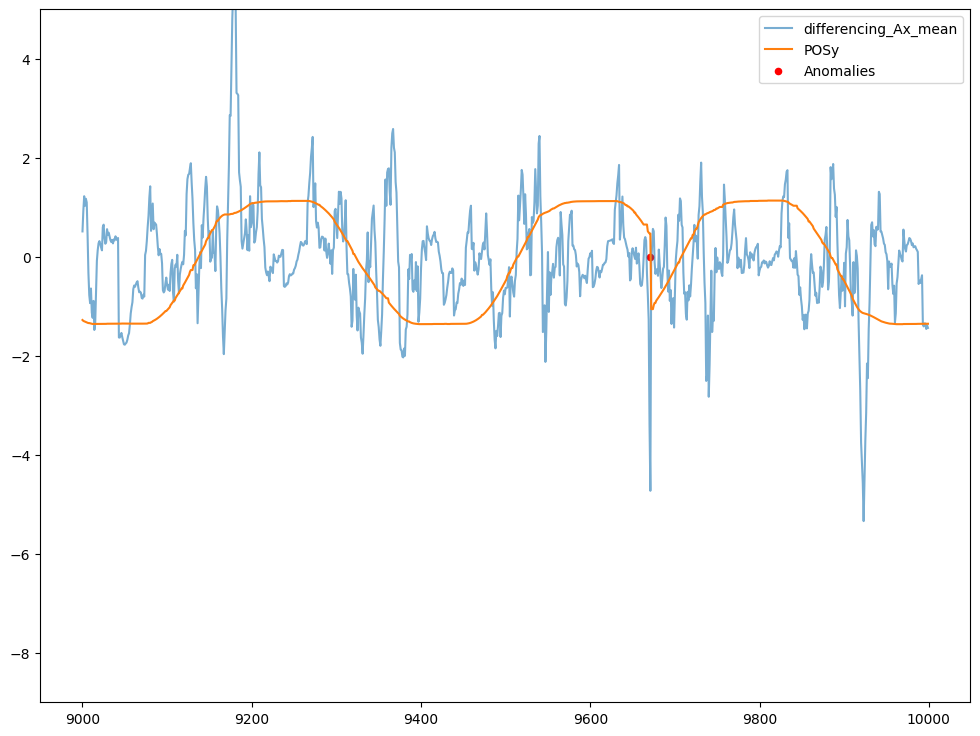

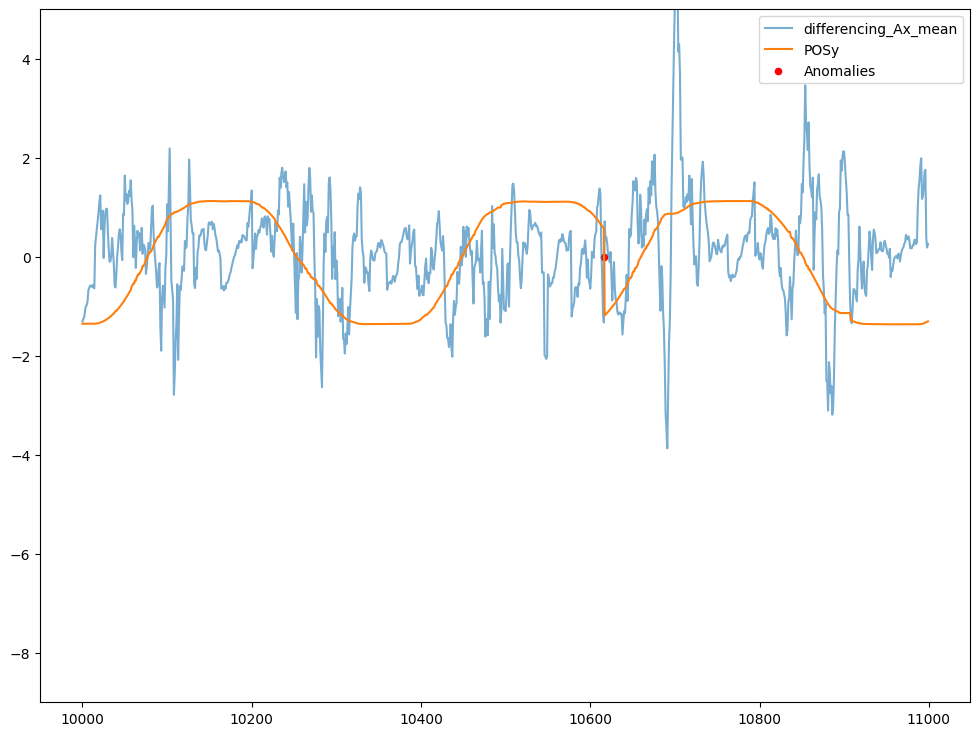

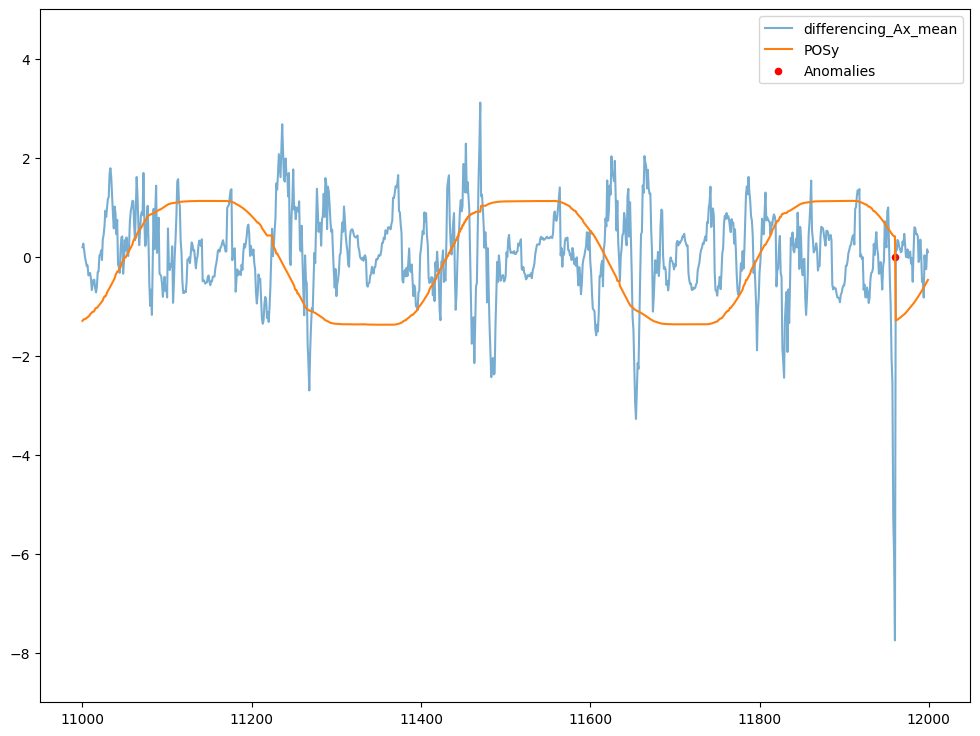

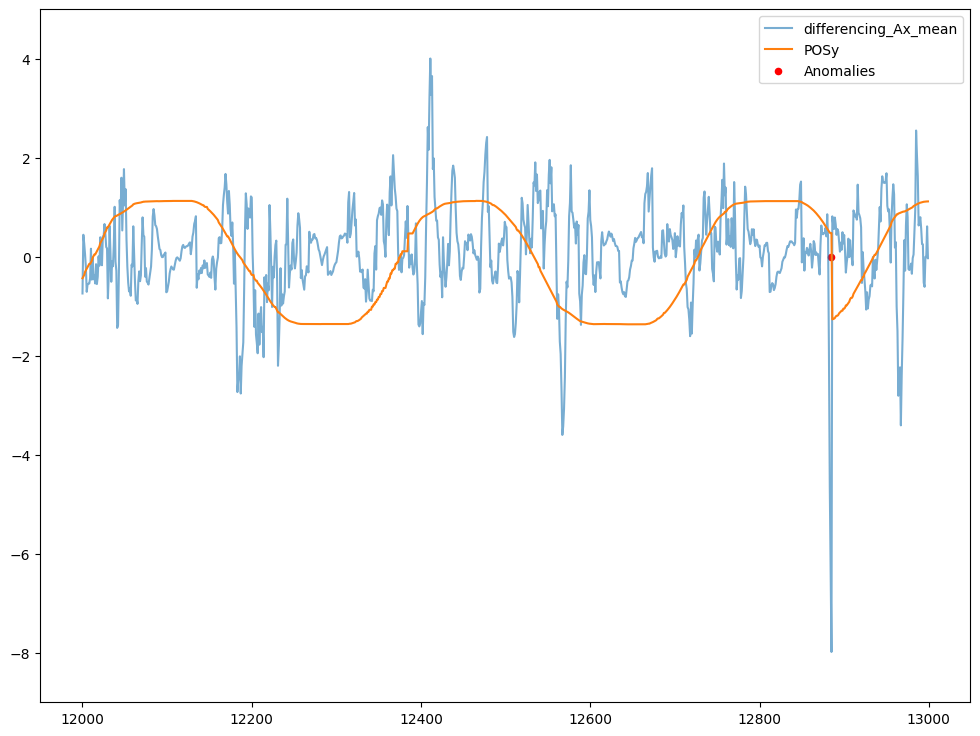

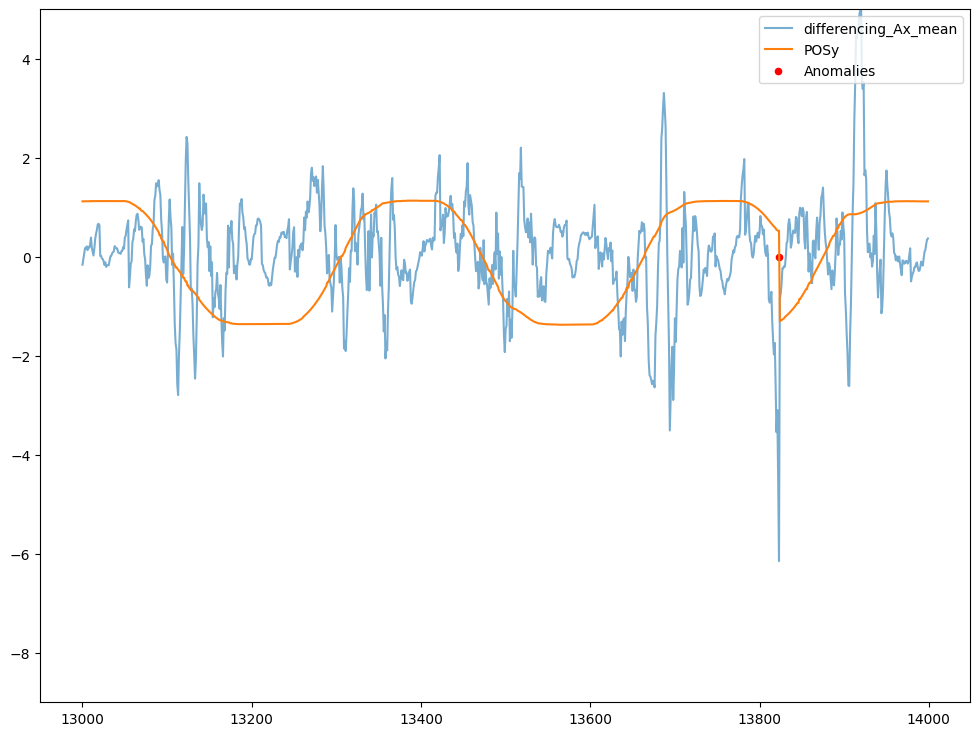

In [ ]:
plot_all_signal_zoomed(df, "differencing_Ax_mean")

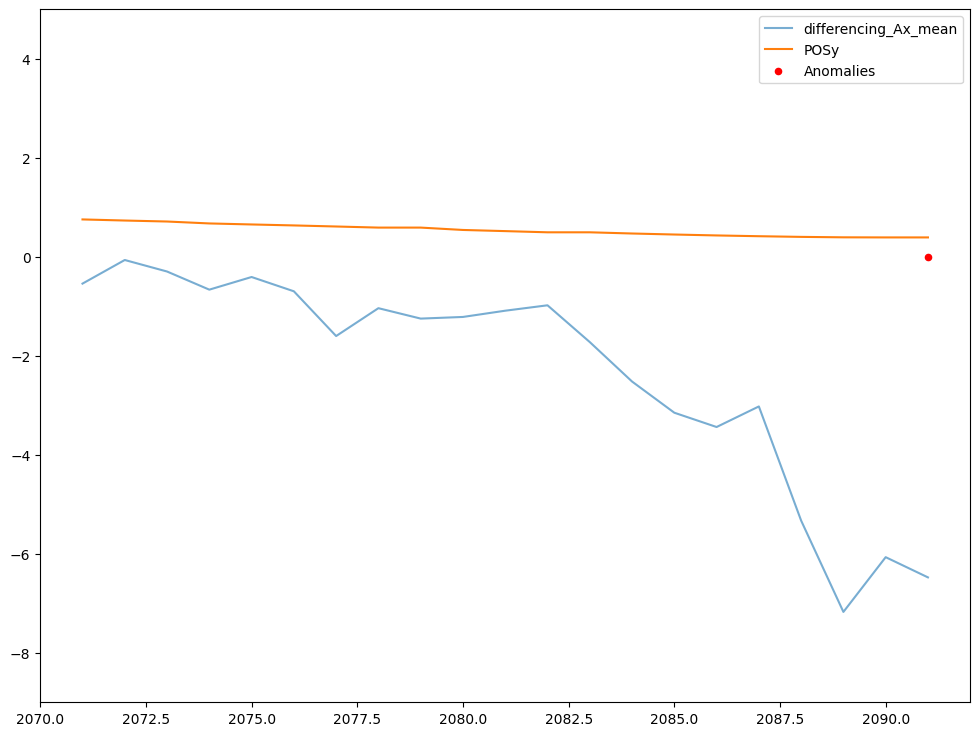

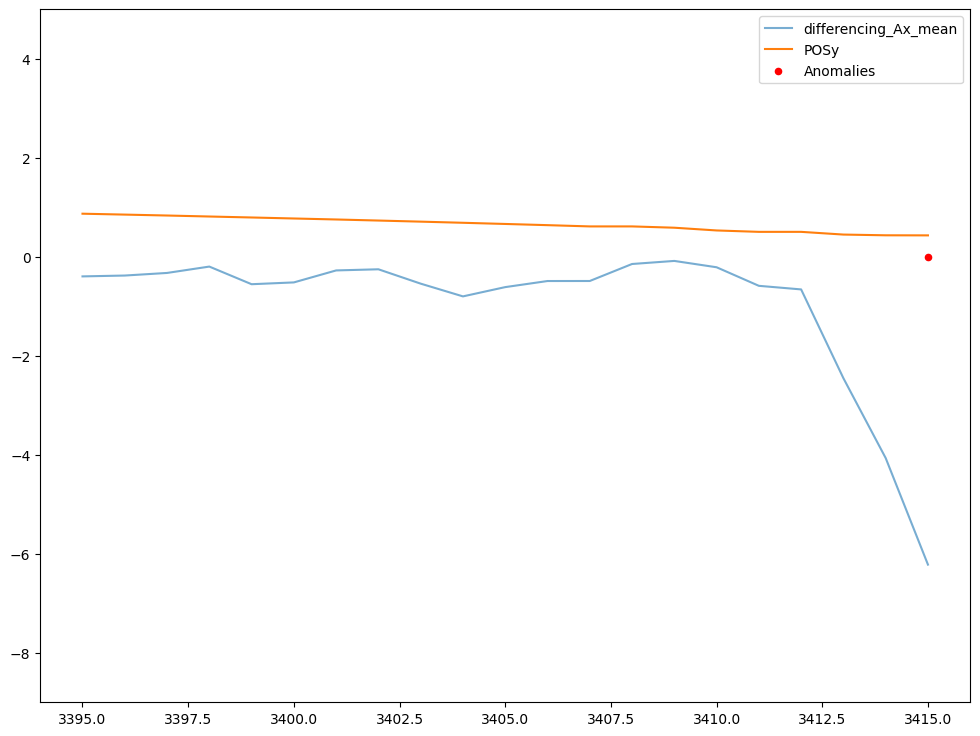

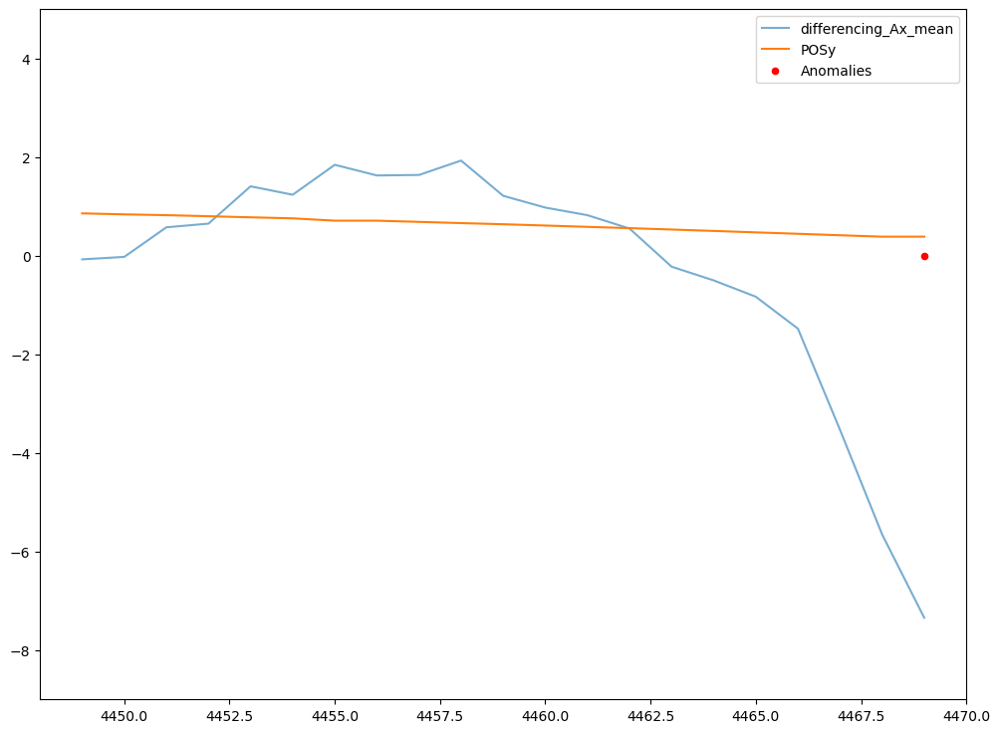

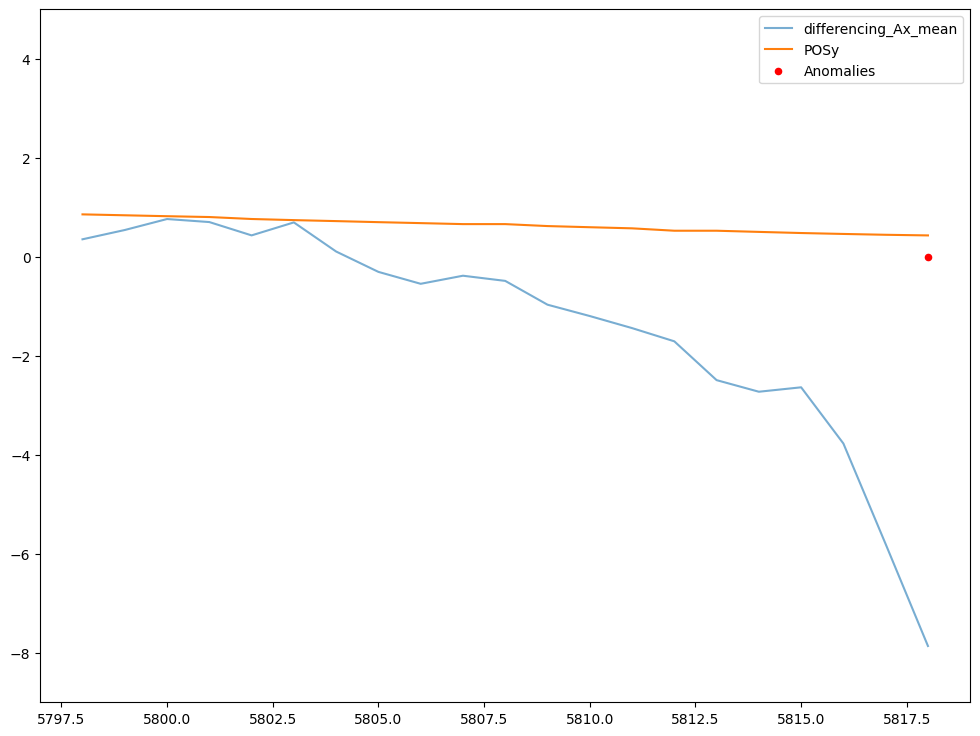

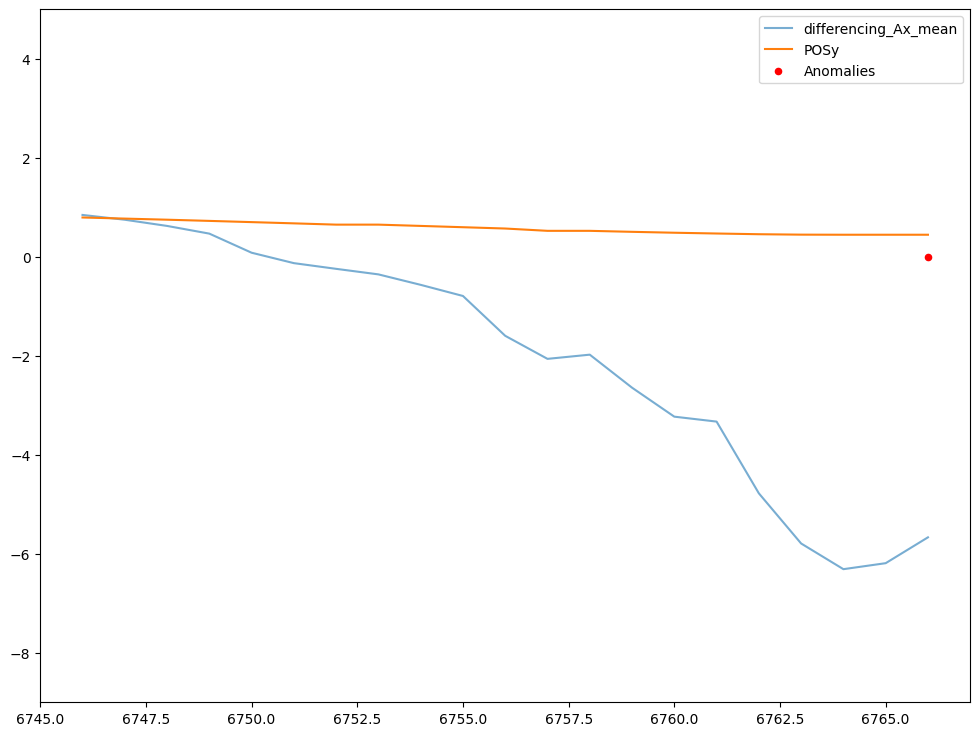

...

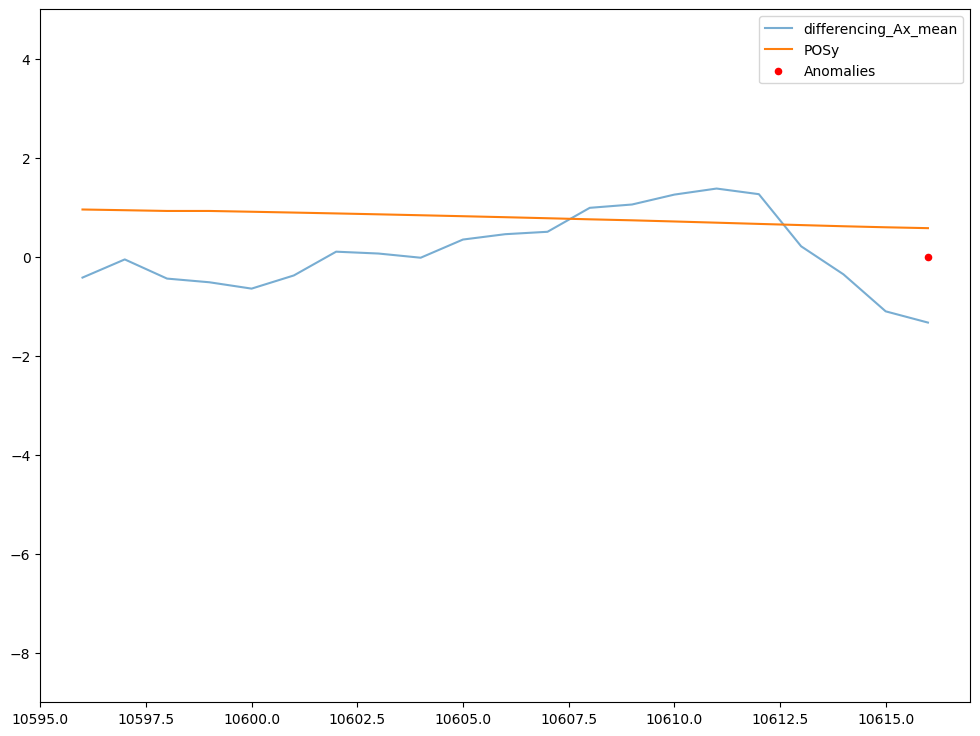

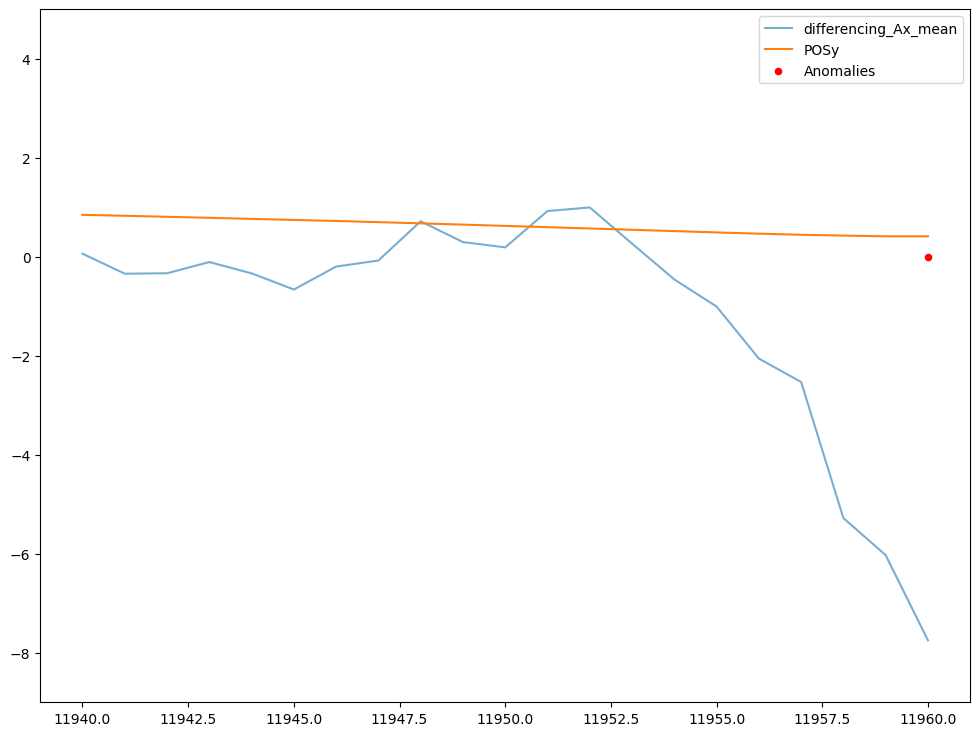

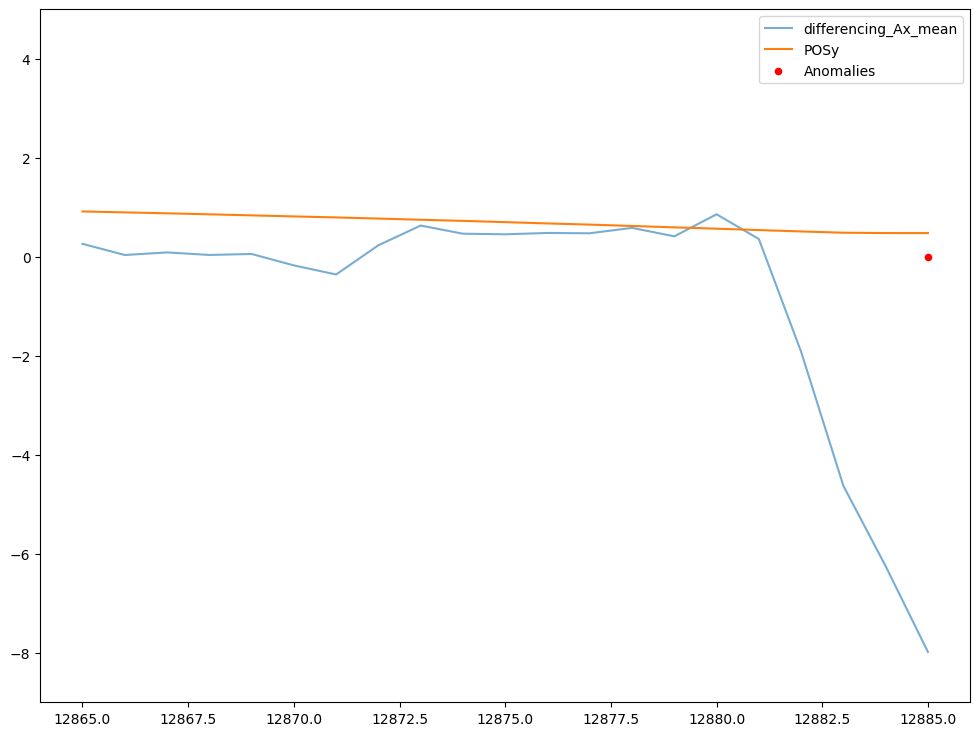

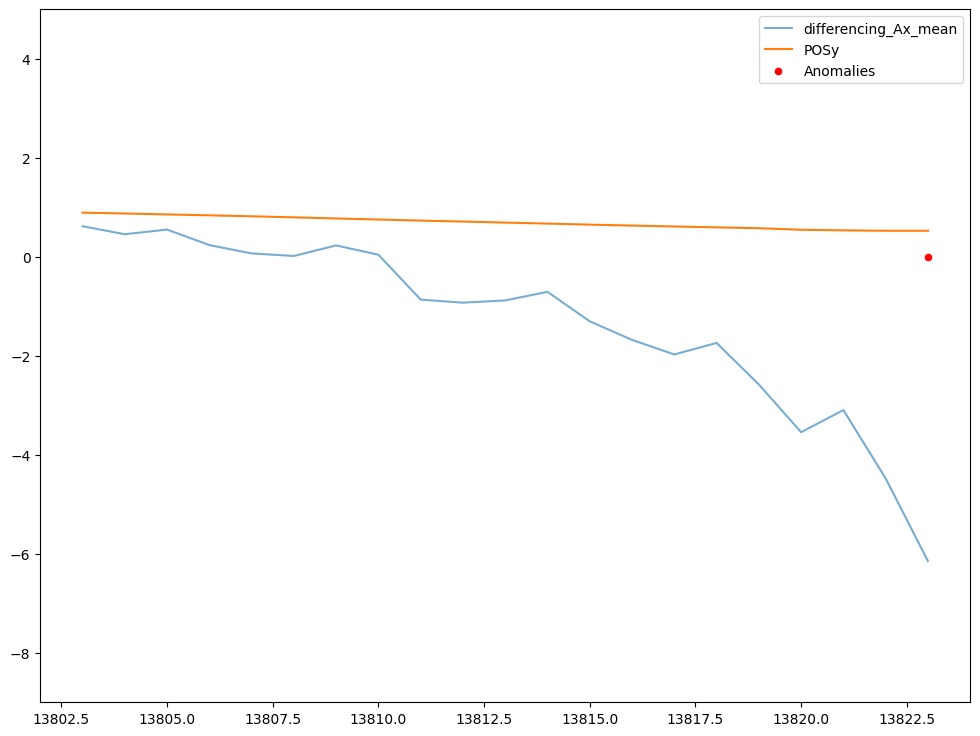

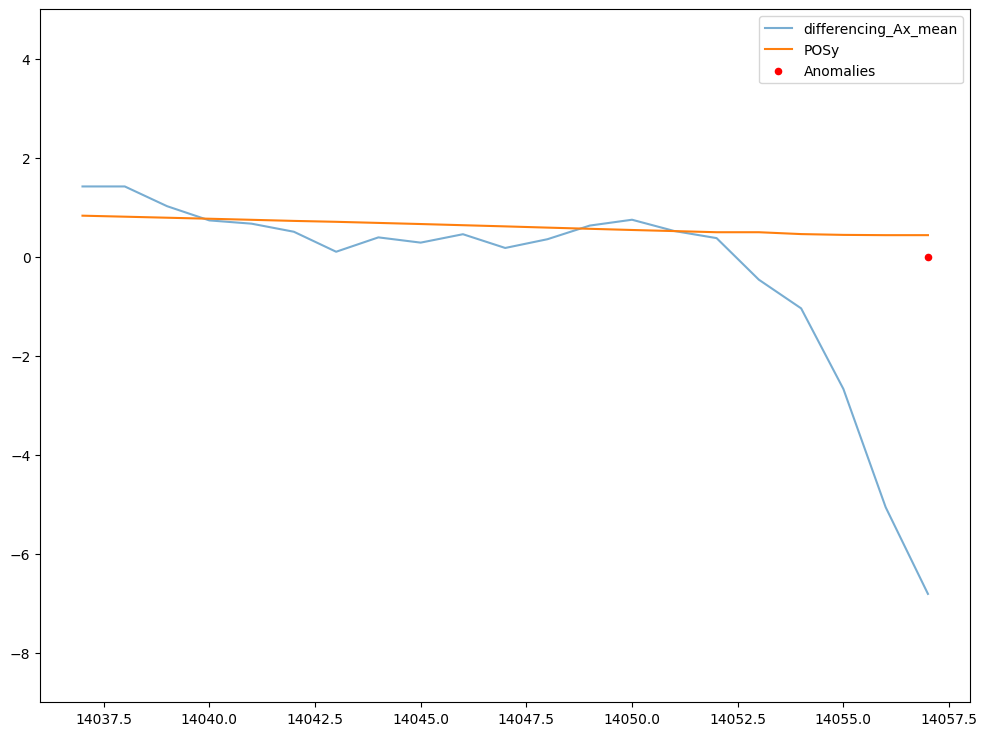

In [ ]:
plot_only_faults(df, "differencing_Ax_mean")

#### Ay & Gz: mean values with differencing zooming on all signal

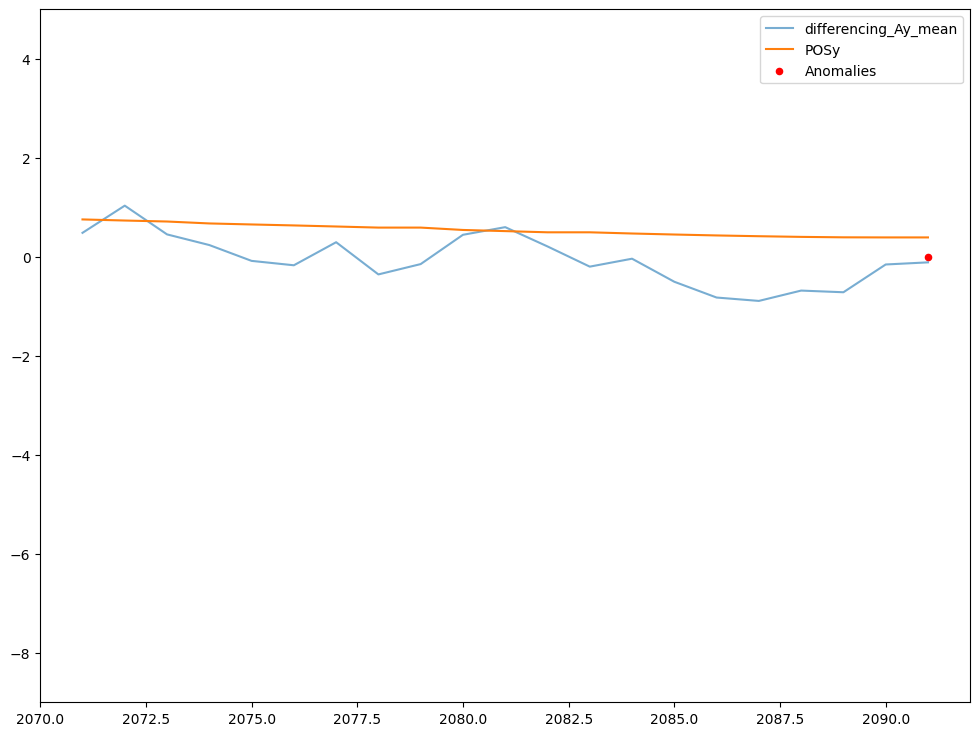

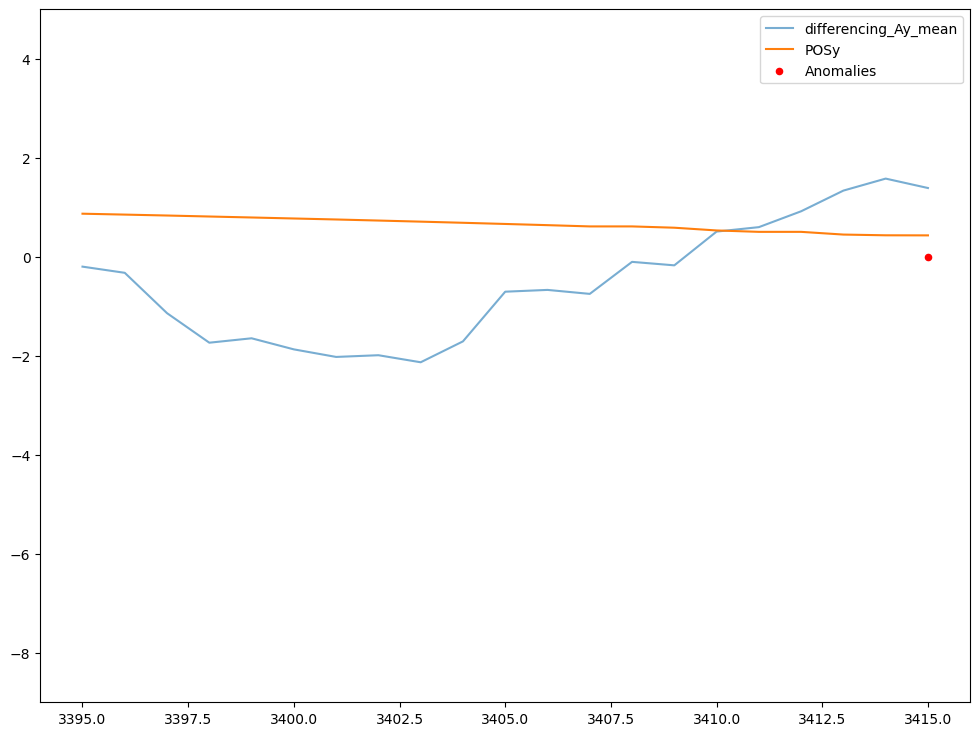

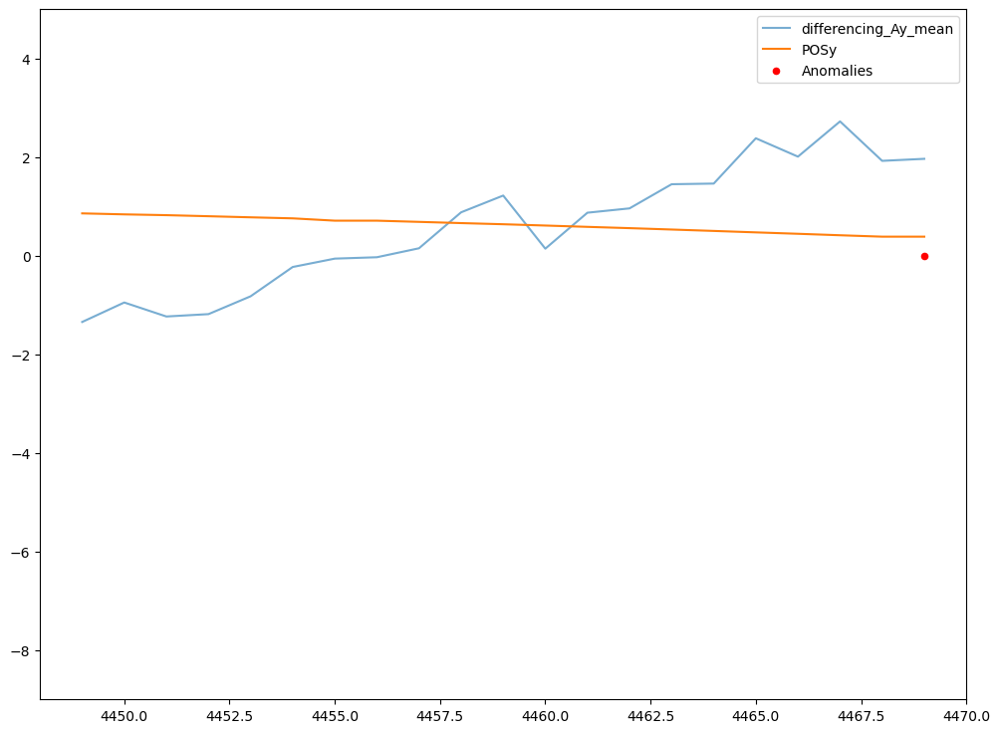

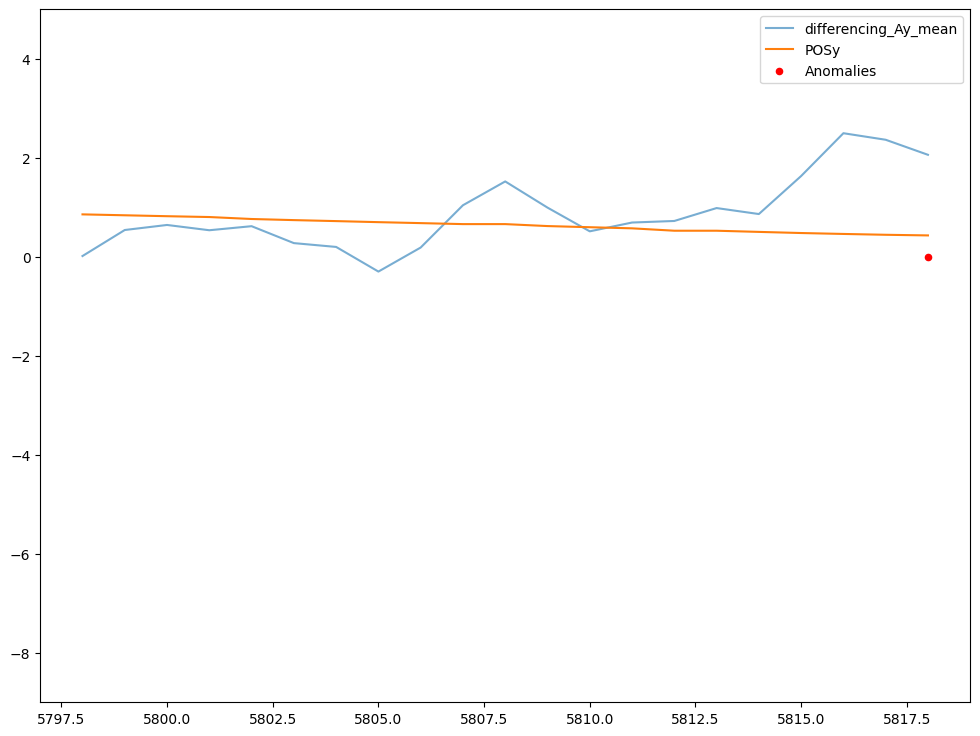

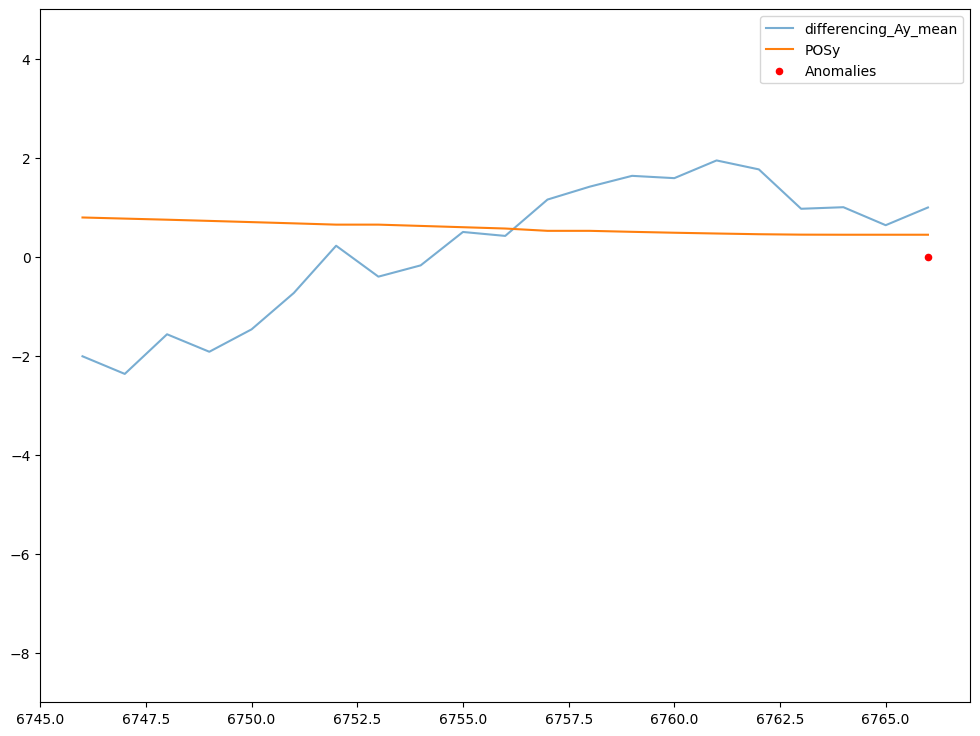

...

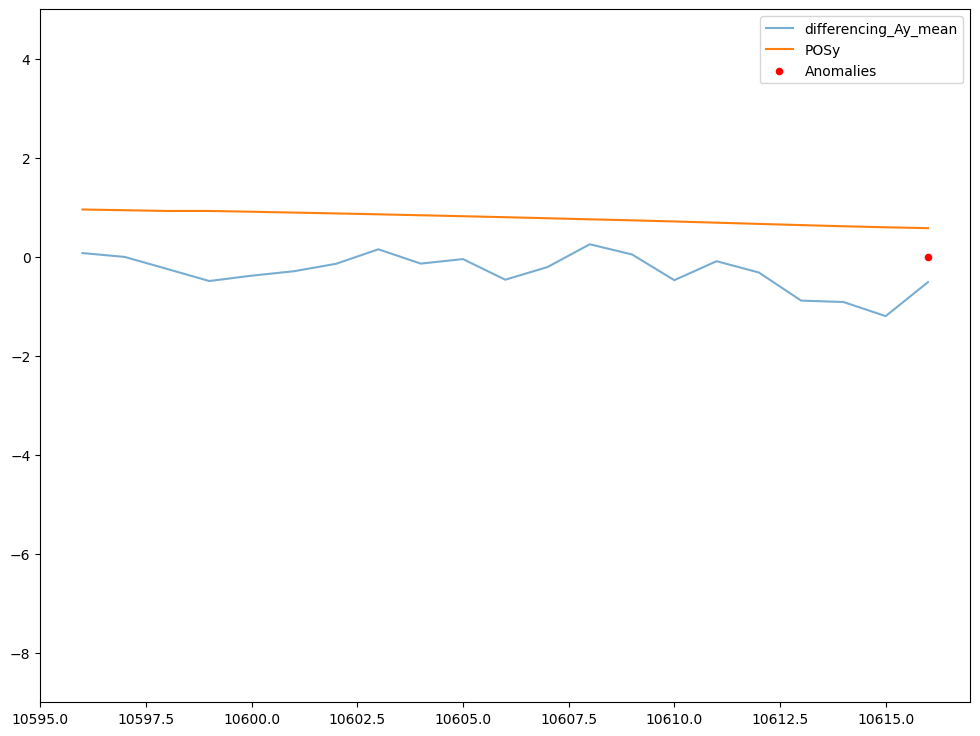

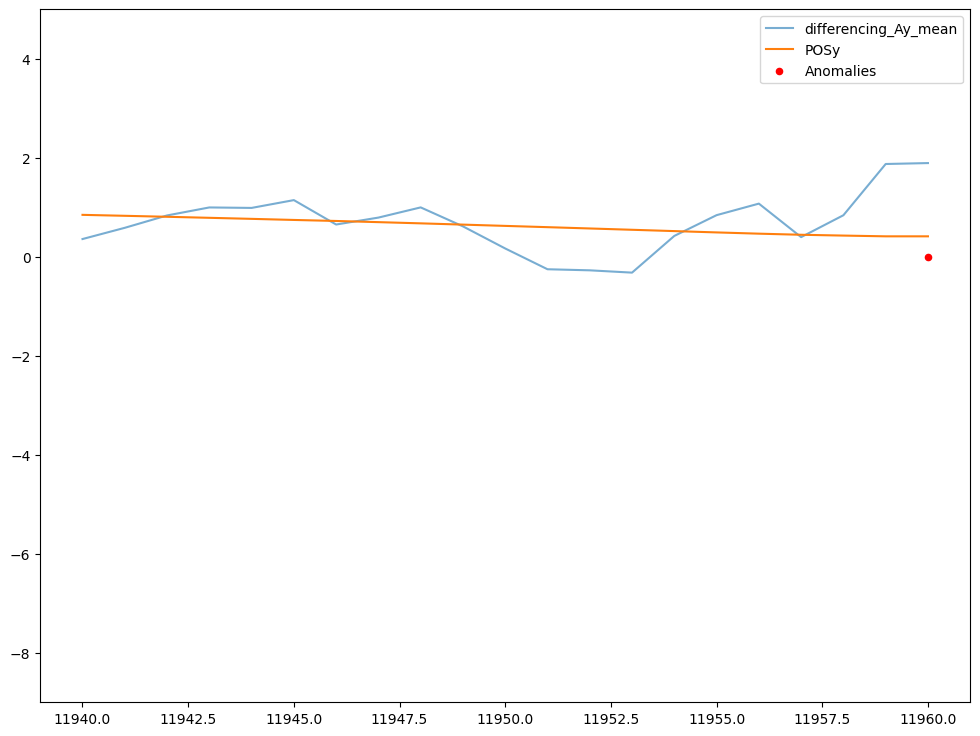

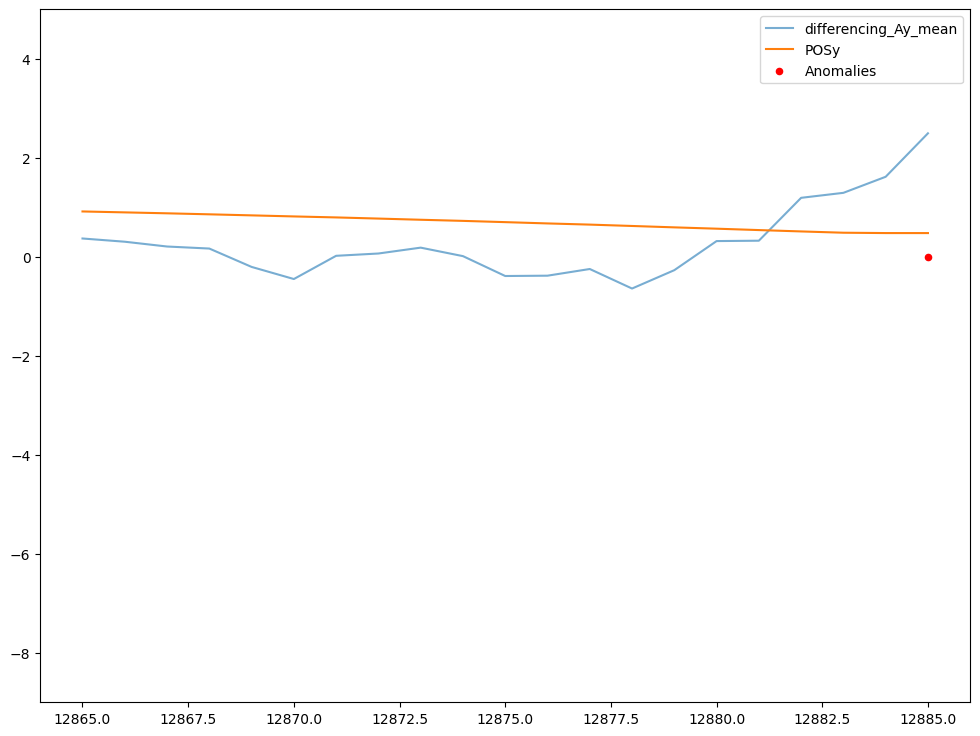

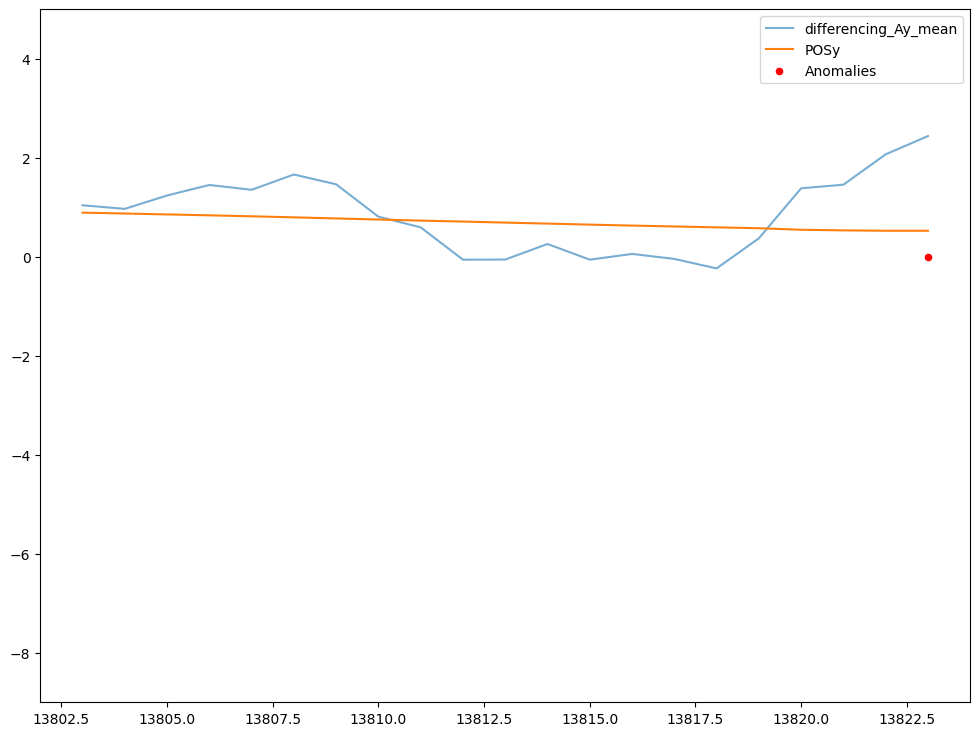

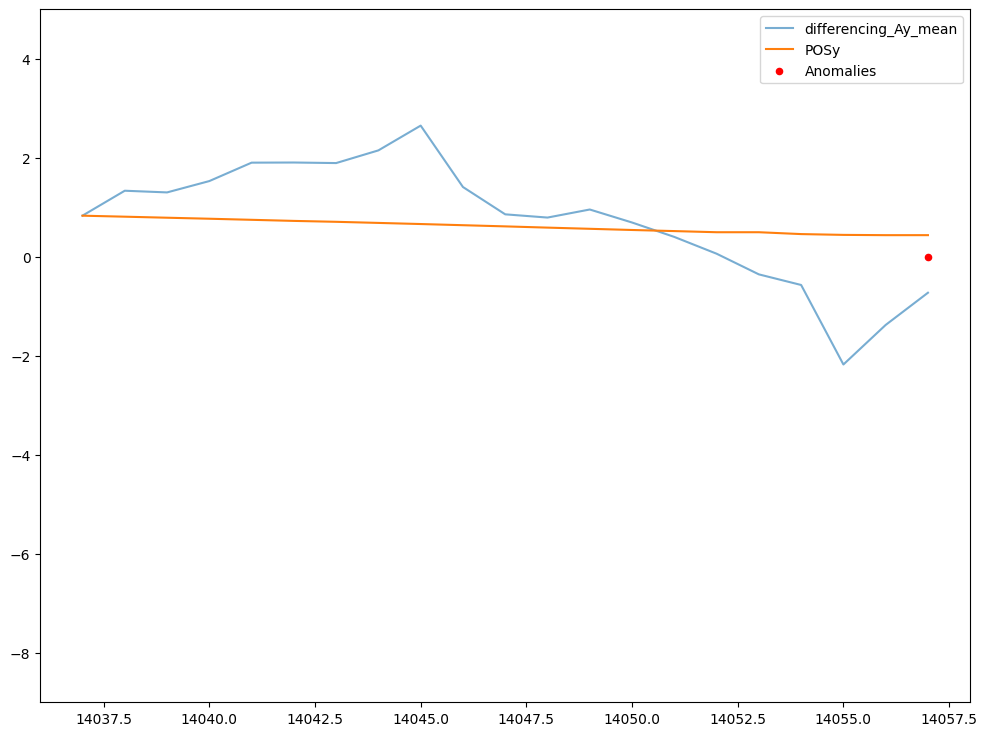

In [ ]:
plot_only_faults(df, "differencing_Ay_mean")

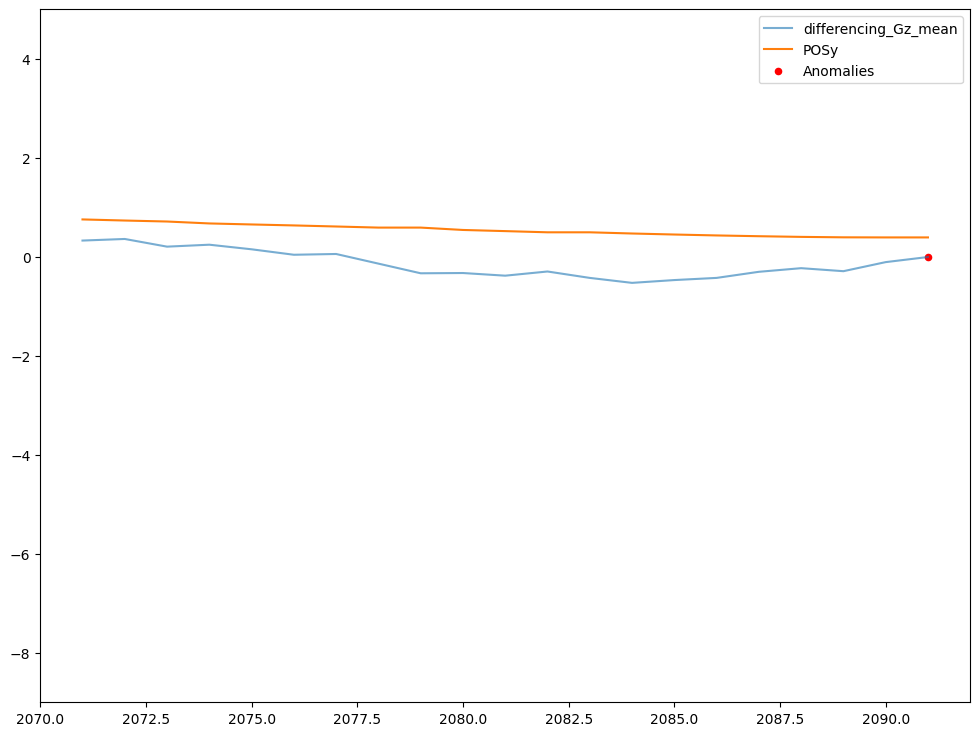

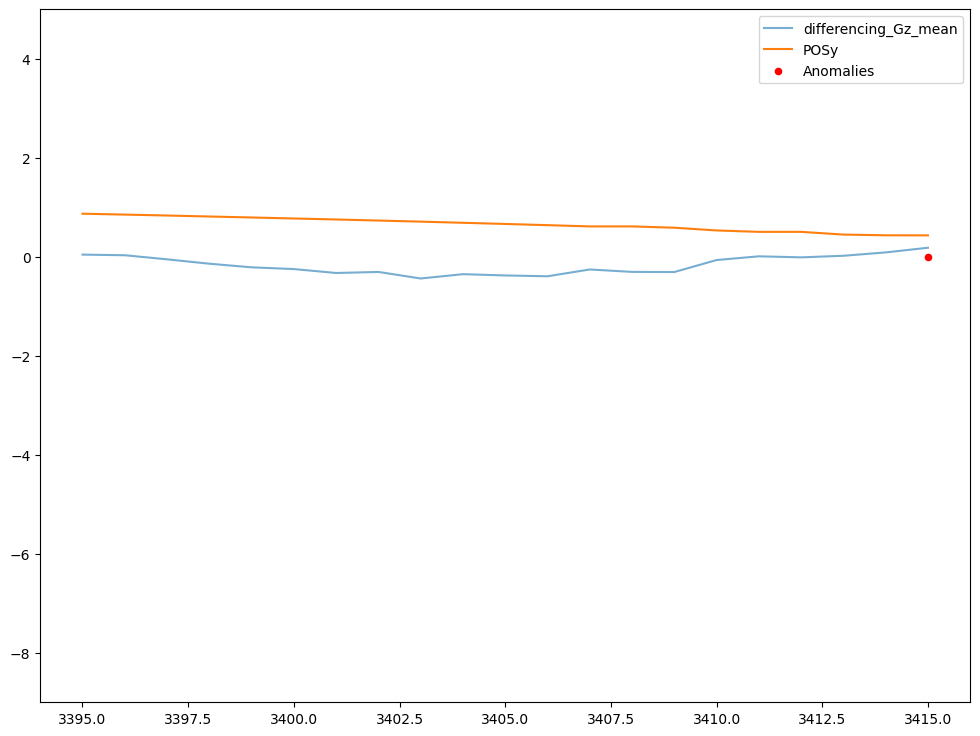

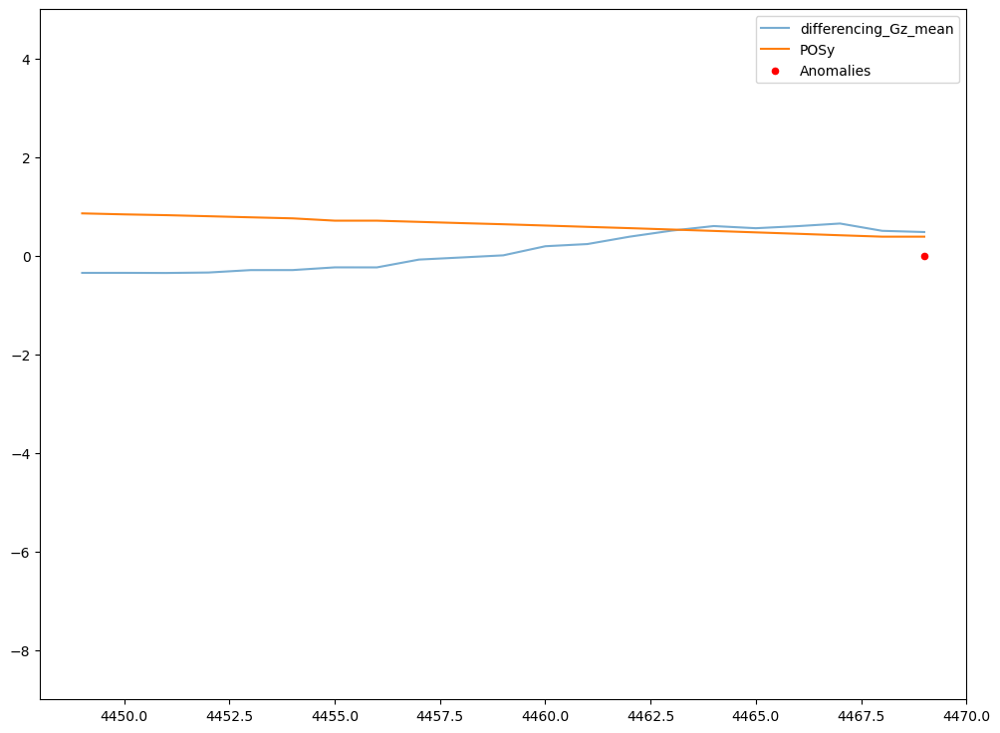

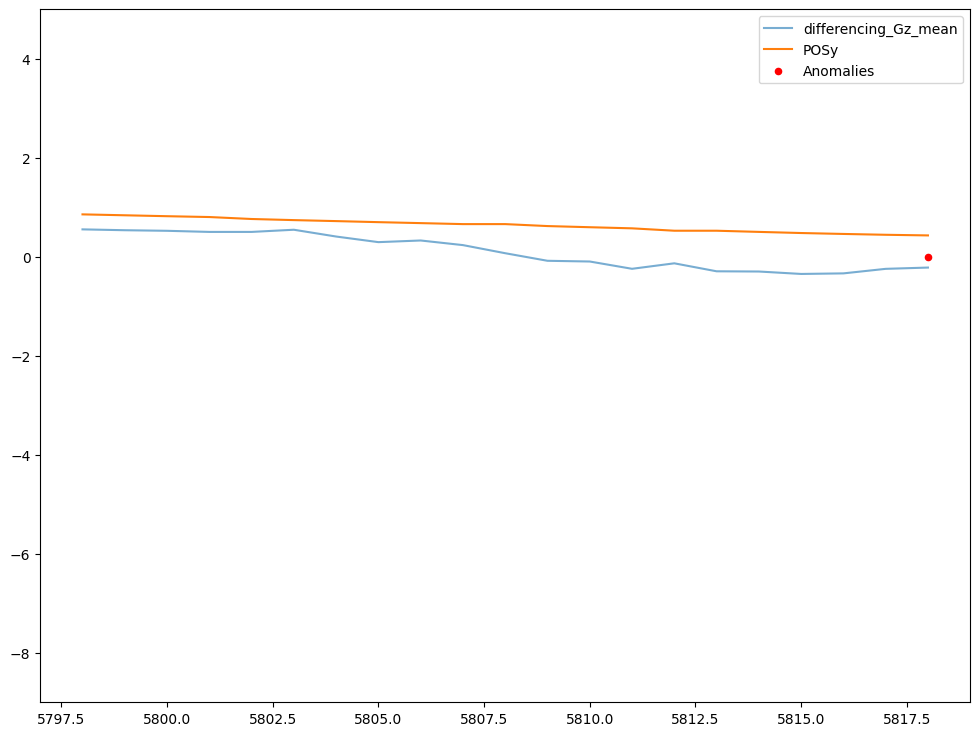

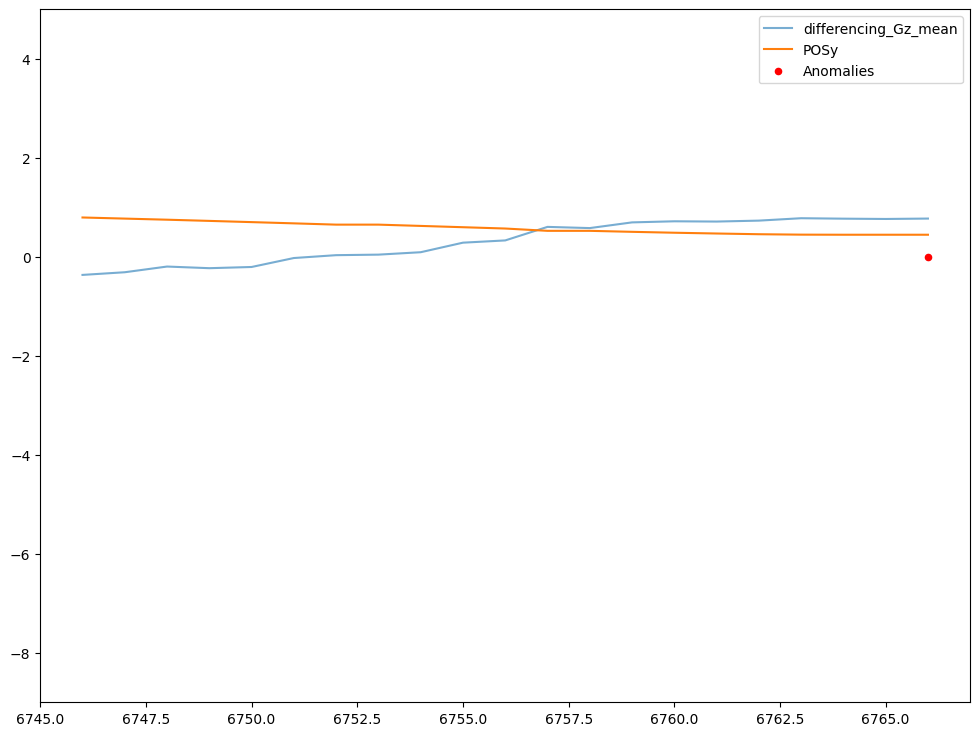

...

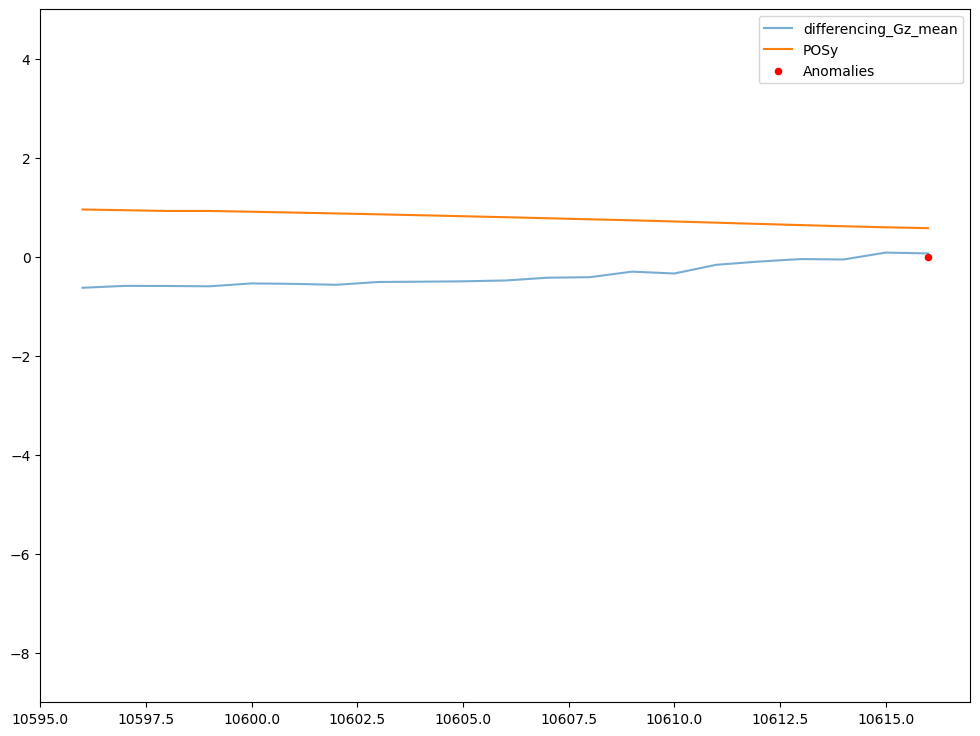

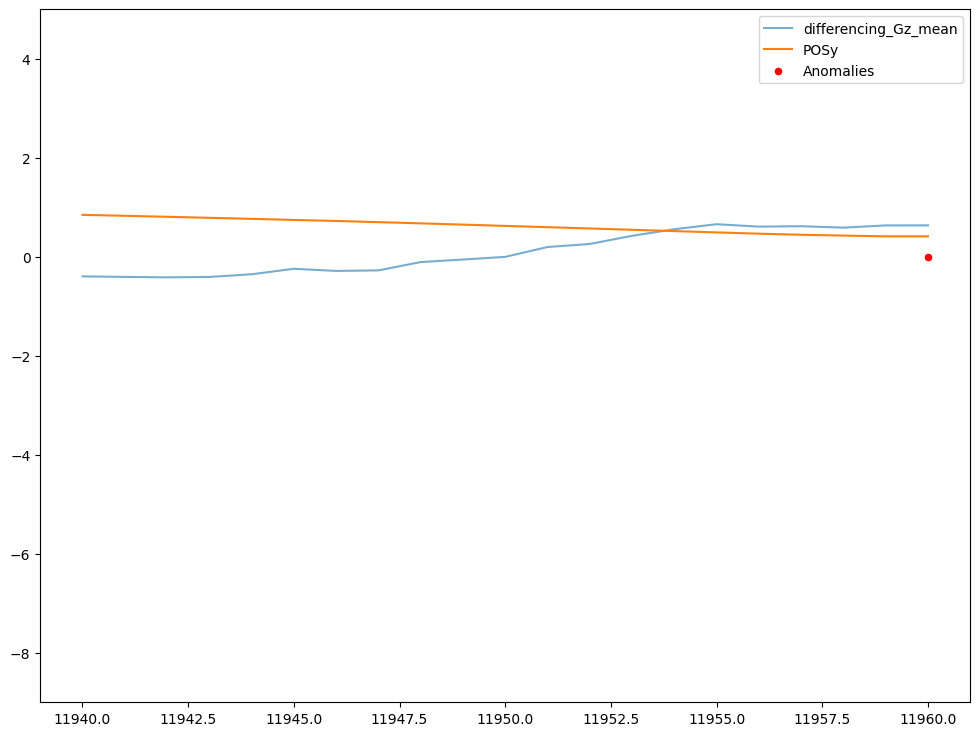

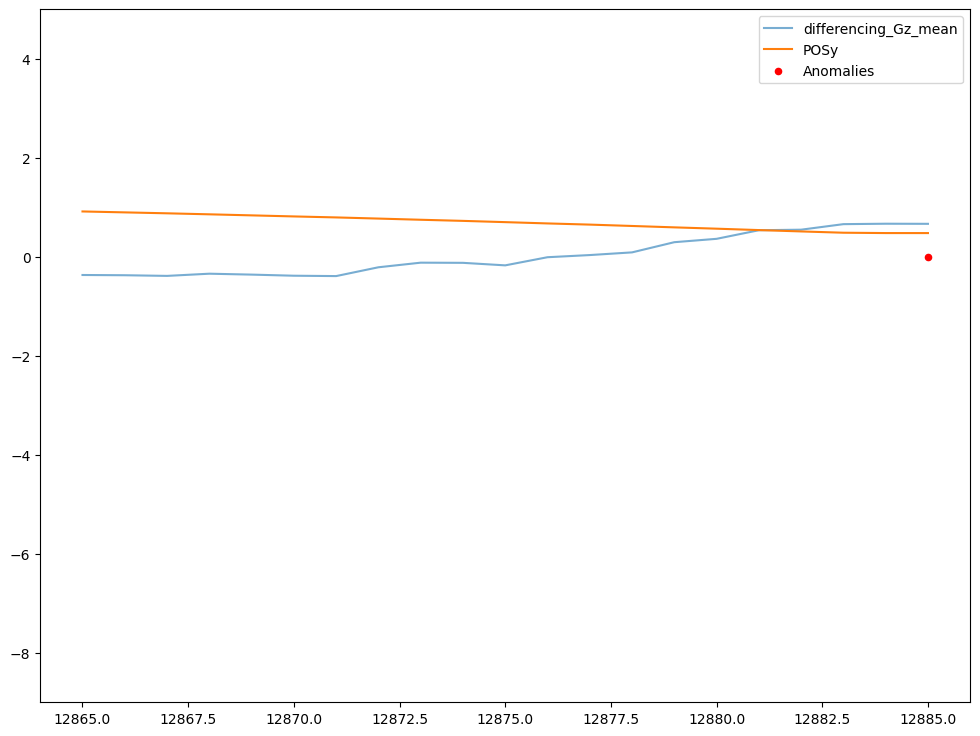

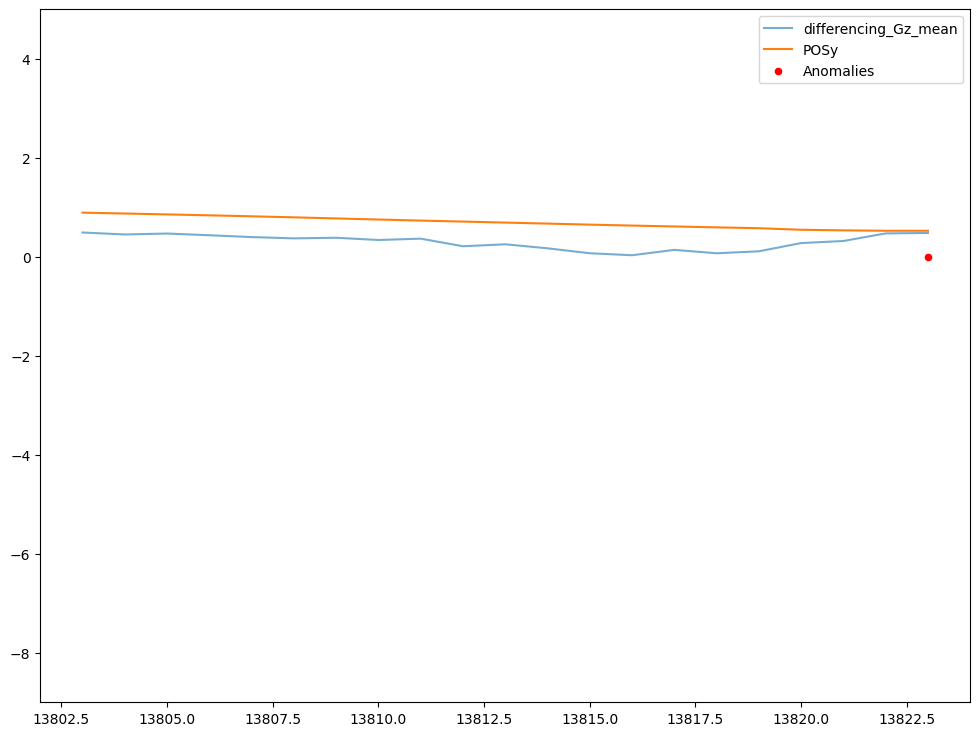

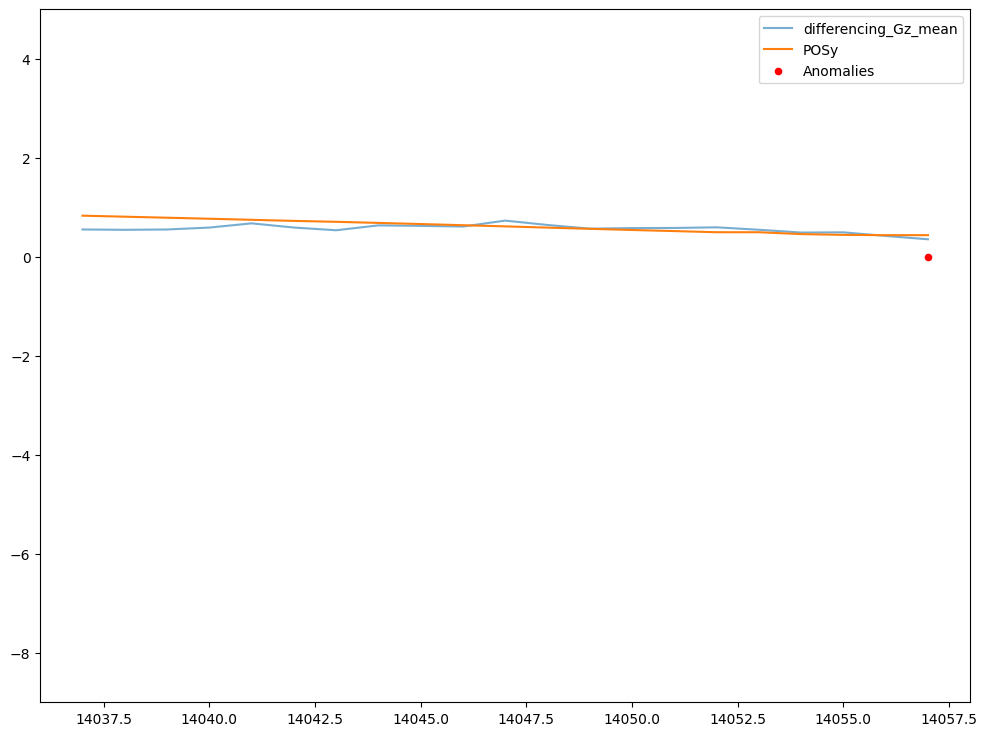

In [ ]:
plot_only_faults(df, "differencing_Gz_mean")

## Dataset preprocessing for machine learning models

In this section, RUL labels are converted to binary labels (`0/1`, namely `not_fault/fault`) in order to perform classification instead of regression.

For the `AutoEncoder` model, the dataset is partitioned such that the training set does not contain faults or samples which anticipate a fault. In other words, each sample must be compliant with the `good_samples_thr` threshold.

We basically need an entire section of dataset where faults are not present.

In [ ]:
training_columns = ["differencing_Gz_mean", "differencing_Ax_mean", 
                    "differencing_Ay_mean", "label"]

We will prepare the training, validation and test set with the following function.

In [ ]:
def build_dataset_for_ml_model(df, split_size=0.75, as_list=False, ae=False, keep=1.):
    dfs = []
    df_main = df[training_columns]
    fault_indexes = df_main.index[df_main["label"] == 0].tolist() # list of indexes representing faults
    good_samples_thr = margin * 2
    
    previous = 0
    for fi in fault_indexes:
        dfs.append(df_main.iloc[previous:fi+1, :])
        previous = fi + 1
    
    rnd_list = list(range(len(dfs)))
    # Disable the following istruction if you want to compare different models on same test data
    # random.shuffle(rnd_list) 
    
    # Drop some samples from the training set
    rnd_list = rnd_list[:round(len(rnd_list))]
    
    # If split_size is 1, there will be no val/test set
    train_size = floor(len(dfs) * split_size)
    train_index = rnd_list[:round(train_size * keep)]
    test_index = rnd_list[train_size:]

    train_rul = []
    test_rul = []
    
    if not as_list:
        first = True
        for ti in train_index:
            if not ae:
                to_concat = dfs[ti].copy()
            else:
                to_concat = dfs[ti][dfs[ti]["label"] >= good_samples_thr].copy()
            if first:
                training_set = to_concat
                first = False
            else:
                training_set = pd.concat([training_set, to_concat])

        first = True
        for ti in test_index:
            to_concat = dfs[ti].copy()
            if first:
                test_set = to_concat
                first = False
            else:
                test_set = pd.concat([test_set, to_concat])
        
        train_rul = training_set['label'].tolist()
        if split_size < 1:
            test_rul = test_set['label'].tolist()
        
        training_set['label'] = (training_set['label'] >= margin).map({True: 1, False: 0})
        if split_size < 1:
            test_set['label'] = (test_set['label'] >= margin).map({True: 1, False: 0})

        training_set = training_set.to_numpy()
        if split_size < 1:
            test_set = test_set.to_numpy()
        
    else:
        first = True
        for ti in train_index:
            if not ae:
                to_concat = dfs[ti].copy()
            else:
                to_concat = dfs[ti][dfs[ti]["label"] >= good_samples_thr].copy()
            if first:
                training_set = [to_concat]
                first = False
            else:
                training_set.append(to_concat)
                
        first = True
        for ti in test_index:
            to_concat = dfs[ti].copy()
            if first:
                test_set = [to_concat]
                first = False
            else:
                test_set.append(to_concat)
        
        for t in training_set:
            train_rul = train_rul + t['label'].tolist()
            t['label'] = (t['label'] >= margin).map({True: 1, False: 0})
        if split_size < 1:
            for t in test_set:
                test_rul = test_rul + t['label'].tolist()
                t['label'] = (t['label'] >= margin).map({True: 1, False: 0})
    if split_size < 1:
        return training_set, test_set
    return training_set

## Cost model for threshold optimization and performance evaluation

In general ML models, such as Logistic Neural Networks, predict as output a continuous value, such as a sigmoidal output between 0 and 1. Hence, it is necessary to determine a threshold for the classification of a fault. This process goes under the name of "Threshold Optimization", and it is basically an iterative procedure, testing over a set of possible good threshold.

The threshold optimization process involves same arguments, such as the cost for false positive (false alarms) and false negative (missed faults). For the moment, we will keep these values constant.

In the following 2 lists we will collect the performance of the ML models over the validation (`all_perf`) and test set (`all_perf_test`).

In [ ]:
all_perf = [] 

In [ ]:
all_perf_test = []

In [ ]:
BASE_FP = 0.2
BASE_FN = 1

def false_positive_cost(i, is_fault, fault_found):
    return BASE_FP

def false_negative_cost(i, is_fault, fault_found):
    if not fault_found:
        for j in range(1, margin + 1):
            if i + j < is_fault.shape[0] and not is_fault[i + j] or i + j >= is_fault.shape[0]:
                return (margin + 1 - j) * BASE_FN
    else:
        return 0

In [ ]:
def threshold_optimization(signal, rul, start, end, n_steps):
    best_cost = sys.maxsize
    best_thr = -1
    all_cost = []
    all_thr = []
    is_fault = (rul == 0)
    
    for thr in np.linspace(start, end, n_steps):
        tmp_cost = 0
        fault_found = False
        for i in range(signal.shape[0]):
            if is_fault[i] and signal[i] >= thr:
                fault_found = True
            if not is_fault[i]:
                fault_found = False
            if not is_fault[i] and signal[i] >= thr:
                tmp_cost += false_positive_cost(i, is_fault, fault_found)
            elif is_fault[i] and signal[i] <= thr:
                tmp_cost += false_negative_cost(i, is_fault, fault_found)
        if tmp_cost < best_cost:
            best_thr = thr
            best_cost = tmp_cost
        all_cost.append(tmp_cost)
        all_thr.append(thr)
        
    print(f'Best threshold: {best_thr:.3f}, best cost = {best_cost:.3f}')

    return best_cost, best_thr, all_cost, all_thr

In [ ]:
def plot_threshold(signal, thr, rul):

    plt.plot(signal, alpha=0.5)
    plt.plot(range(len(signal)), [thr] * len(signal))

    ranges = []
    signal_values = []
    for i in range(len(rul)):
        if rul[i] == 0:
            ranges.append(i)
            signal_values.append(signal[i])

    plt.scatter(ranges, signal_values, color="red", s=10)
    
    plt.ylabel('Alarm signal intensity')
    plt.xlabel('Time')
    plt.legend(['Alarm signal', "Threshold", 'Anomalies'], loc='upper right')
    plt.show()
    plt.show()

In [ ]:
def performance_evaluation(signal, thr, rul):
    fp, fn, tp, tot_p = 0, 0, 0, 0
    cost = 0
    alarm = (signal >= thr)
    anticipation = []
    is_fault = (rul == 0)
    
    fault_found = False
    for i in range(len(rul)):
        if i > 0 and is_fault[i] and not is_fault[i - 1]:
            tot_p += 1
            start = i
        if is_fault[i] and not fault_found and alarm[i]:
            tp += 1
            fault_found = True
            anticipation.append((margin - 1) - (i - start))
        if (i < len(rul) - 1 and is_fault[i] and not is_fault[i + 1] and not fault_found) or (i == len(rul) - 1 and not fault_found):
            fn += 1 
        if is_fault[i] and signal[i] <= thr:
            cost += false_negative_cost(i, is_fault, fault_found)
        if not is_fault[i]:
            fault_found = False
            if alarm[i]:
                fp += 1
                cost += false_positive_cost(i, is_fault, fault_found)
        
    print(f'The total cost of the model is {cost:.3f}')
    print(f'Detected {tp} faults over {tot_p}, missed faults: {fn}. False alarm: {fp}')
    print(f'Faults detected with an anticipation of:')
    for a in anticipation:
        a = a / 10
        print(f' - {a:.1f}s')
    tot_a = sum(anticipation) / 10
    if sum(anticipation) > 0:
        mean_a = mean(anticipation) / 10
    else:
        mean_a = 0
    print(f'The mean anticipation is {mean_a:.2f}s. Total amount of anticipation is {tot_a:.1f}s')
    
    return [cost, mean_a, tp, fn, fp]

## RUL estimation with pre-trained machine learning models

We will now evaluate the results of pre-trained machine learning models on the dataset that we have collected. For the moment, we will omit the details about the training of the algorithm and we will assess the perfomance only. Later on we will deepen them properly.

#### Load models

Here we load all the pre-trained models and the optimal threshold found with the threshold optimization process.

In [ ]:
model_bilstm = keras.models.load_model('IoT_Academy_2023/models_rul/bilstm.bin')
model_gru = keras.models.load_model('IoT_Academy_2023/models_rul/gru.bin')
model_lstm = keras.models.load_model('IoT_Academy_2023/models_rul/lstm.bin')
lin_cl = keras.models.load_model('IoT_Academy_2023/models_rul/lin_cl.bin')
ffnn = keras.models.load_model('IoT_Academy_2023/models_rul/ffnn.bin')
cnn = keras.models.load_model('IoT_Academy_2023/models_rul/cnn.bin')
ae = keras.models.load_model('IoT_Academy_2023/models_rul/ae.bin')

with open('IoT_Academy_2023/threshold_rul/raw.bin', 'rb') as handle:
    best_thr_raw = pickle.load(handle)
with open('IoT_Academy_2023/threshold_rul/ae.bin', 'rb') as handle:
    best_thr_ae = pickle.load(handle)
with open('IoT_Academy_2023/threshold_rul/lin_cl.bin', 'rb') as handle:
    best_thr_lin_cl = pickle.load(handle)
with open('IoT_Academy_2023/threshold_rul/ffnn.bin', 'rb') as handle:
    best_thr_ffnn = pickle.load(handle)
with open('IoT_Academy_2023/threshold_rul/cnn.bin', 'rb') as handle:
    best_thr_cnn = pickle.load(handle)
with open('IoT_Academy_2023/threshold_rul/bilstm.bin', 'rb') as handle:
    best_thr_bilstm = pickle.load(handle)
with open('IoT_Academy_2023/threshold_rul/lstm.bin', 'rb') as handle:
    best_thr_lstm = pickle.load(handle)
with open('IoT_Academy_2023/threshold_rul/gru.bin', 'rb') as handle:
    best_thr_gru = pickle.load(handle)

#### Raw-signal pre-anomaly detection

In [ ]:
test_set_raw = build_dataset_for_ml_model(df, split_size=1)

In [ ]:
test_raw_signal, test_raw_rul = -test_set_raw[:, 1], test_set_raw[:, -1]

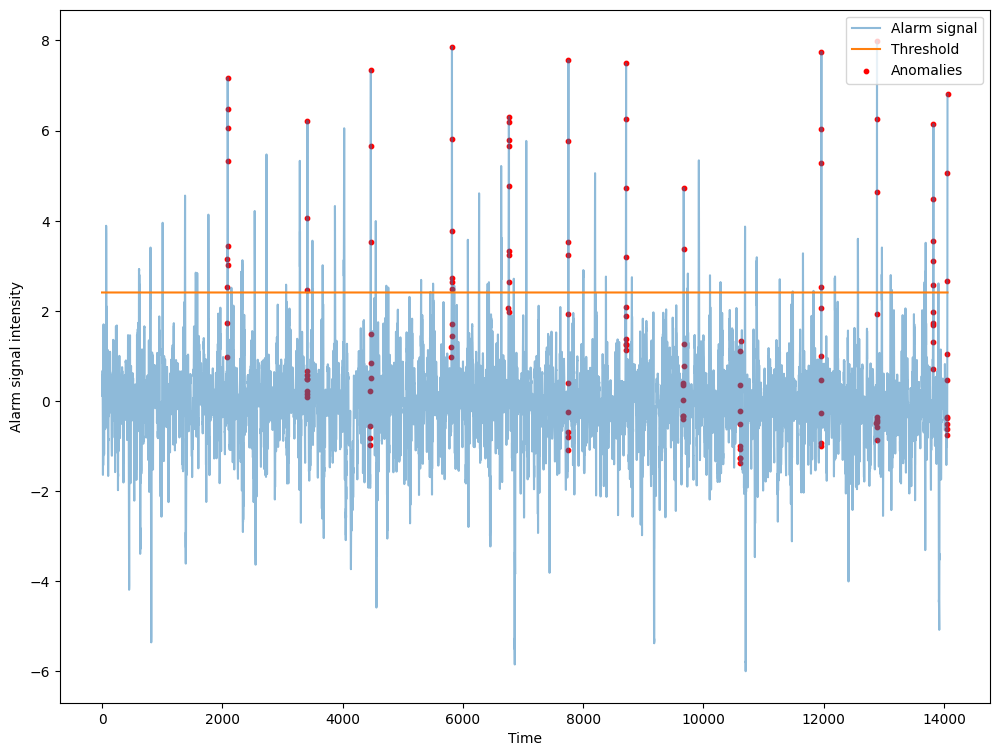

In [ ]:
plot_threshold(test_raw_signal, best_thr_raw, test_raw_rul)

In [ ]:
perf_raw_test = performance_evaluation(test_raw_signal, best_thr_raw, test_raw_rul)

The total cost of the model is 338.000
Detected 12 faults over 13, missed faults: 1. False alarm: 205
Faults detected with an anticipation of:
 - 0.7s
 - 0.2s
 - 0.2s
 - 0.5s
 - 0.7s
 - 0.3s
 - 0.3s
 - 0.1s
 - 0.3s
 - 0.2s
 - 0.4s
 - 0.2s
The mean anticipation is 0.34s. Total amount of anticipation is 4.1s


In [ ]:
all_perf_test.append(["raw_signal"] + perf_raw_test)

#### Autoencoders

In [ ]:
test_set_ae = build_dataset_for_ml_model(df, split_size=1)

In [ ]:
test_preds_ae = ae.predict(test_set_ae[:, :-1])

440/440 [==============================] - 4s 2ms/step


In [ ]:
test_signal_ae = pd.Series(data=np.sum(np.square(test_preds_ae - test_set_ae[:, :-1]), axis=1))
test_rul_ae = test_set_ae[:, -1]

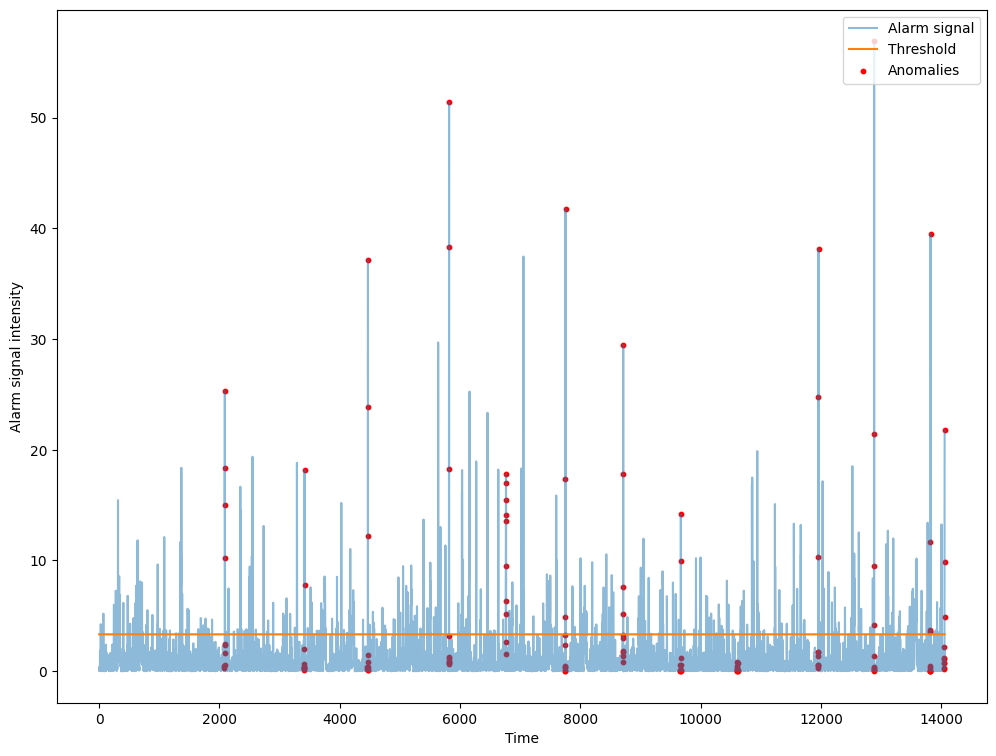

In [ ]:
plot_threshold(test_signal_ae, best_thr_ae, test_rul_ae)

In [ ]:
test_perf_ae = performance_evaluation(test_signal_ae, best_thr_ae, test_rul_ae)

The total cost of the model is 547.200
Detected 12 faults over 13, missed faults: 1. False alarm: 1001
Faults detected with an anticipation of:
 - 0.3s
 - 0.1s
 - 0.2s
 - 0.2s
 - 0.7s
 - 0.3s
 - 0.3s
 - 0.1s
 - 0.2s
 - 0.3s
 - 0.3s
 - 0.2s
The mean anticipation is 0.27s. Total amount of anticipation is 3.2s


In [ ]:
all_perf_test.append(["autoencoder"] + test_perf_ae)

#### Logistic Neural Network

In [ ]:
test_set_lin = build_dataset_for_ml_model(df, split_size=1)

In [ ]:
test_preds_lin = lin_cl.predict(test_set_lin[:, :-1]).ravel()

440/440 [==============================] - 1s 1ms/step


In [ ]:
test_signal_lin_cl = pd.Series(data=(1 - test_preds_lin))
test_rul_lin_cl = test_set_lin[:, -1]

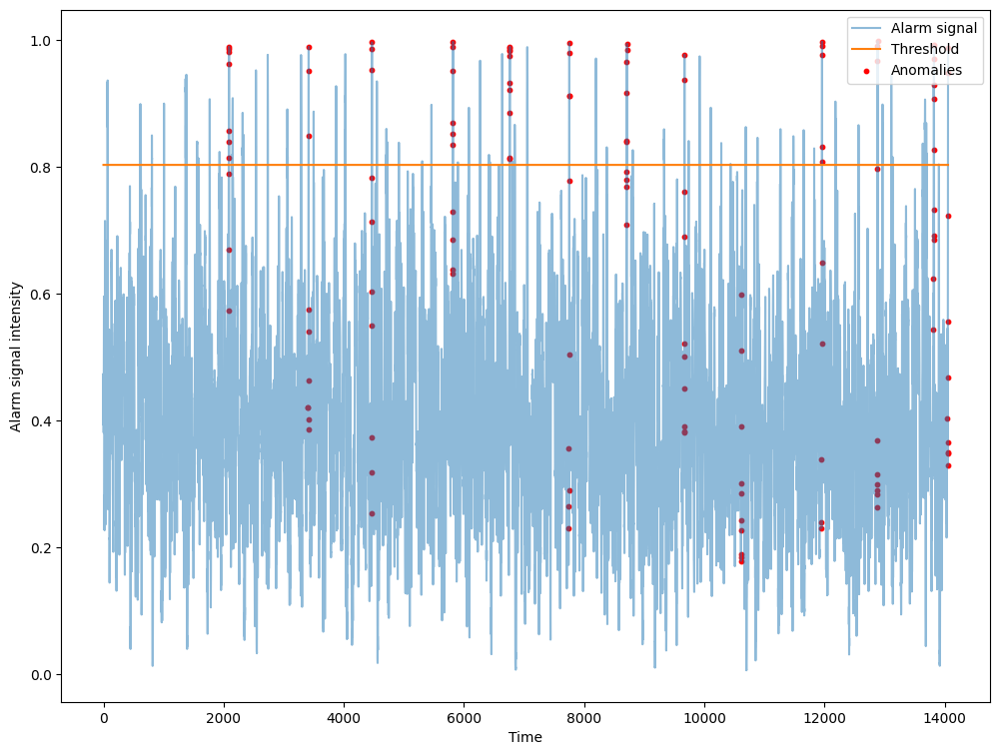

In [ ]:
plot_threshold(test_signal_lin_cl, best_thr_lin_cl, test_rul_lin_cl)

In [ ]:
test_perf_lin_cl = performance_evaluation(test_signal_lin_cl, best_thr_lin_cl, test_rul_lin_cl)

The total cost of the model is 323.400
Detected 12 faults over 13, missed faults: 1. False alarm: 222
Faults detected with an anticipation of:
 - 0.6s
 - 0.2s
 - 0.2s
 - 0.5s
 - 0.9s
 - 0.3s
 - 0.8s
 - 0.1s
 - 0.4s
 - 0.2s
 - 0.4s
 - 0.1s
The mean anticipation is 0.39s. Total amount of anticipation is 4.7s


In [ ]:
all_perf_test.append(["logistic_nn"] + test_perf_lin_cl)

#### Deep Dense Neural Network

In [ ]:
test_set_nn = build_dataset_for_ml_model(df, split_size=1)

In [ ]:
test_preds_ffnn = ffnn.predict(test_set_nn[:, :-1]).ravel()

440/440 [==============================] - 1s 1ms/step


In [ ]:
test_signal_ffnn = pd.Series(data=(1 - test_preds_ffnn))
test_rul_ffnn = test_set_nn[:, -1]

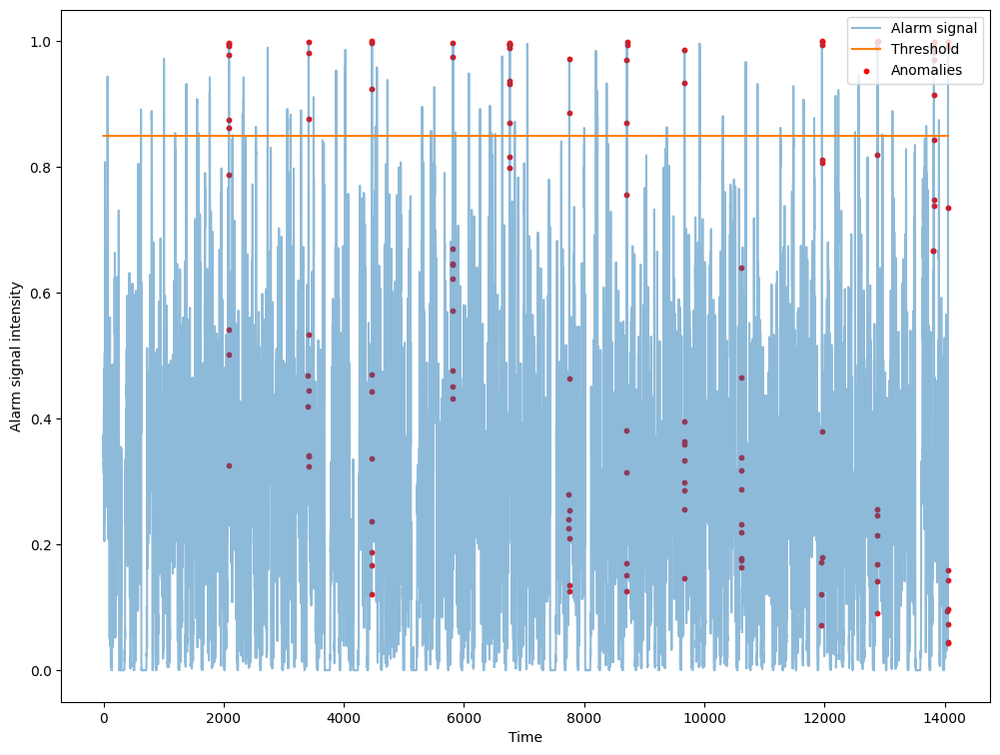

In [ ]:
plot_threshold(test_signal_ffnn, best_thr_ffnn, test_rul_ffnn)

In [ ]:
test_perf_ffnn = performance_evaluation(test_signal_ffnn, best_thr_ffnn, test_rul_ffnn)

The total cost of the model is 392.800
Detected 12 faults over 13, missed faults: 1. False alarm: 164
Faults detected with an anticipation of:
 - 0.5s
 - 0.2s
 - 0.2s
 - 0.1s
 - 0.7s
 - 0.1s
 - 0.3s
 - 0.1s
 - 0.2s
 - 0.2s
 - 0.4s
 - 0.1s
The mean anticipation is 0.26s. Total amount of anticipation is 3.1s


In [ ]:
all_perf_test.append(["deep_nn"] + test_perf_ffnn)

#### Convolutional Neural Network

##### Construct input as sequences

In [ ]:
def sliding_window_2D(data, stride=1):
    # Get shifted tables
    m = len(data)
    lt = [data.iloc[i:m-w_len+i+1:stride, :].values for i in range(w_len)]
    # Reshape to add a new axis
    s = lt[0].shape
    for i in range(w_len):
        lt[i] = lt[i].reshape(s[0], 1, s[1])
    # Concatenate
    wdata = np.concatenate(lt, axis=1)
    return wdata


def sliding_window_by_fault(data, cols, stride=1):
    l_w, l_r = [], []
    for gdata in data:
        # Apply a sliding window
        tmp_w = sliding_window_2D(gdata[cols], stride)
        # Build the RUL vector
        tmp_r = gdata['label'].iloc[w_len-1::stride]
        # Store everything
        l_w.append(tmp_w)
        l_r.append(tmp_r)
    res_w = np.concatenate(l_w)
    res_r = np.concatenate(l_r)
    return res_w, res_r

In [ ]:
test_set_cnn = build_dataset_for_ml_model(df, as_list=True, split_size=1)
train_cols_cnn = ['differencing_Ax_mean', 'differencing_Gz_mean', 'differencing_Ay_mean']
ts_sw, ts_sw_r = sliding_window_by_fault(test_set_cnn, train_cols_cnn)

In [ ]:
test_preds_cnn = cnn.predict(ts_sw).ravel()

436/436 [==============================] - 4s 2ms/step


In [ ]:
test_signal_cnn = pd.Series(data=(1 - test_preds_cnn))
test_rul_cnn = ts_sw_r

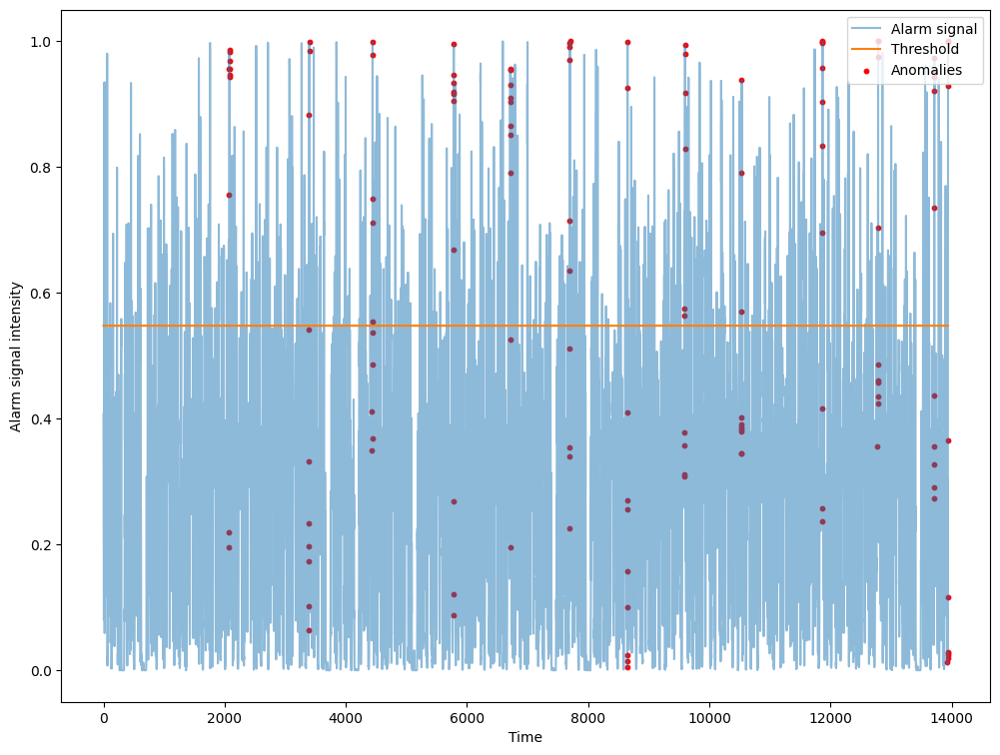

In [ ]:
plot_threshold(test_signal_cnn, best_thr_cnn, test_rul_cnn)

In [ ]:
test_perf_cnn = performance_evaluation(test_signal_cnn, best_thr_cnn, test_rul_cnn)

The total cost of the model is 393.600
Detected 13 faults over 13, missed faults: 0. False alarm: 1078
Faults detected with an anticipation of:
 - 0.7s
 - 0.2s
 - 0.6s
 - 0.6s
 - 0.9s
 - 0.8s
 - 0.1s
 - 0.9s
 - 0.2s
 - 0.6s
 - 0.3s
 - 0.4s
 - 0.2s
The mean anticipation is 0.50s. Total amount of anticipation is 6.5s


In [ ]:
all_perf_test.append(["conv_nn"] + test_perf_cnn)

#### Recurrent Neural Network

##### Construct input as sequences

In [ ]:
# Create a 3D input
def create_dataset_3D(X, y, time_steps = 1):
    Xs, ys = [], []
    for i in range(len(X)-time_steps):
        v = X[i:i+time_steps, :]
        Xs.append(v)
        ys.append(y[i+time_steps])
    return np.array(Xs), np.array(ys).reshape(-1, 1)

In [ ]:
TIME_STEPS = margin
test_set_rnn = build_dataset_for_ml_model(df, split_size=1)
X_test_rnn, y_test_rnn = create_dataset_3D(test_set_rnn[:, :-1], 
                                           test_set_rnn[:, -1], 
                                           TIME_STEPS)

In [ ]:
test_preds_bilstm = model_bilstm.predict(X_test_rnn).ravel()
test_preds_lstm = model_lstm.predict(X_test_rnn).ravel()
test_preds_gru = model_gru.predict(X_test_rnn).ravel()

test_signal_bilstm = pd.Series(data=(1 - test_preds_bilstm))
test_rul_bilstm = y_test_rnn
test_signal_lstm = pd.Series(data=(1 - test_preds_lstm))
test_rul_lstm = y_test_rnn
test_signal_gru = pd.Series(data=(1 - test_preds_gru))
test_rul_gru = y_test_rnn

439/439 [==============================] - 1s 2ms/step


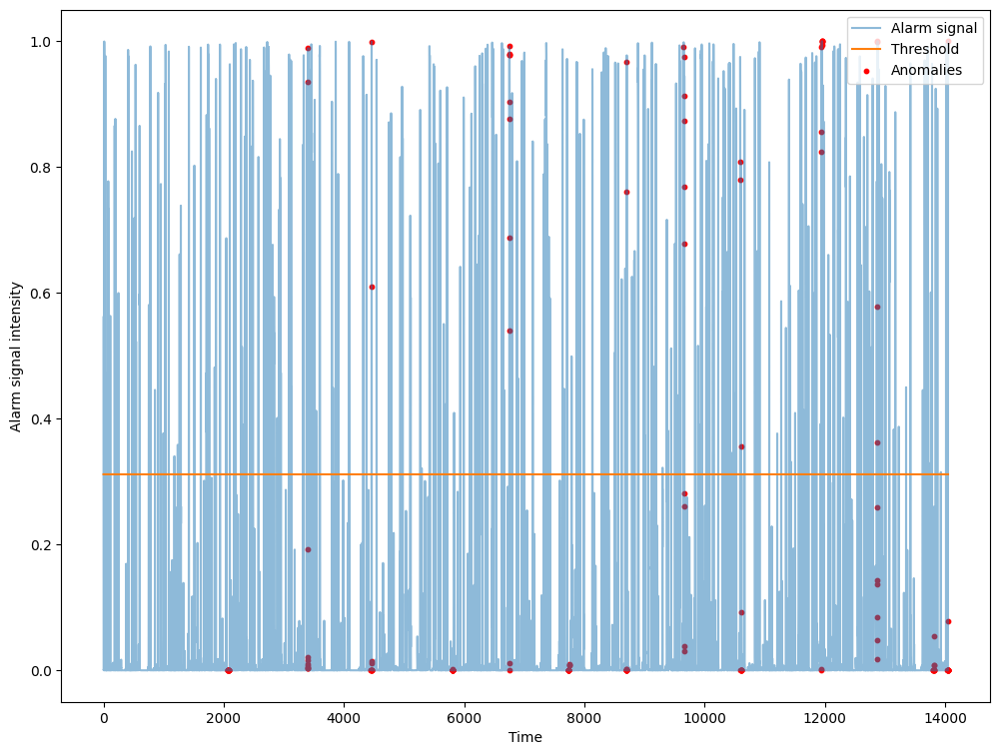

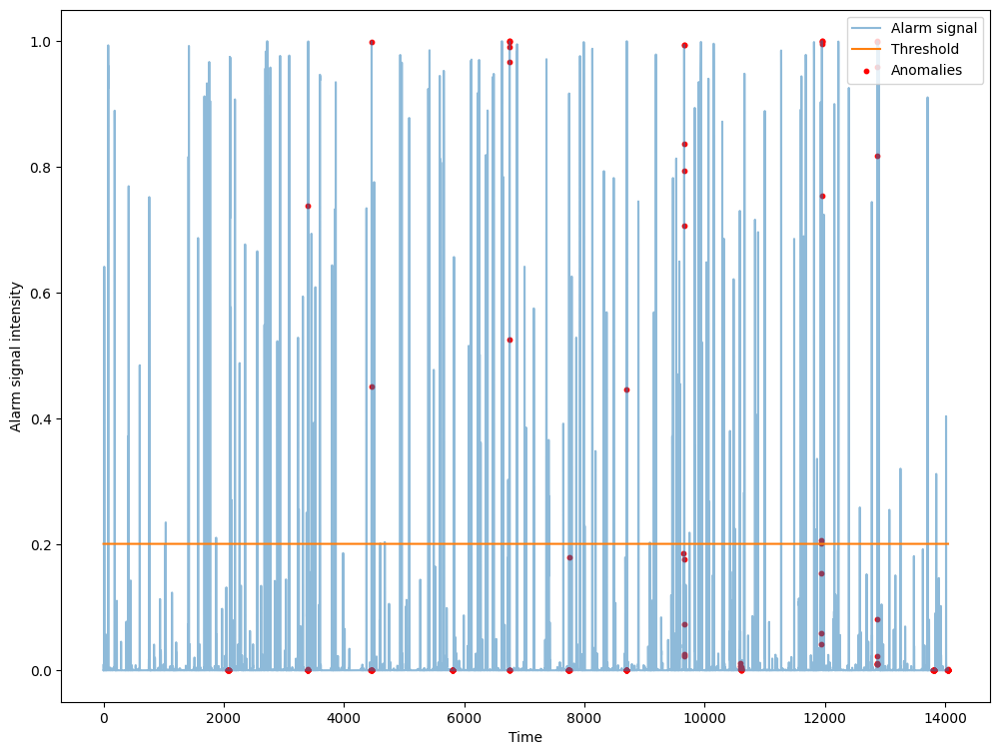

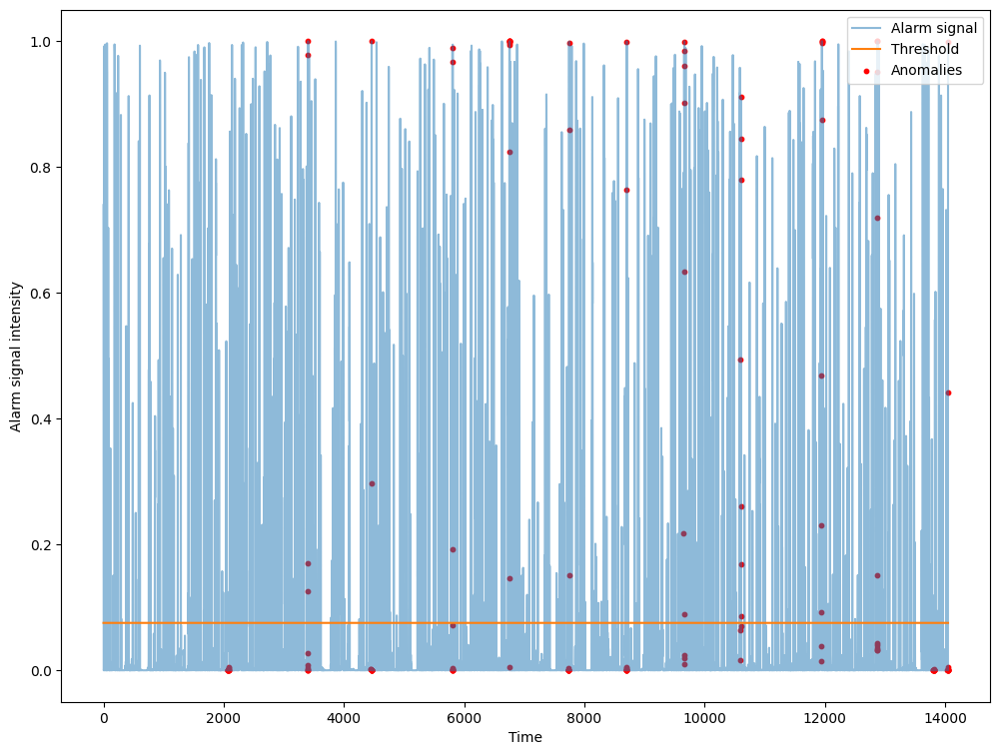

In [ ]:
plot_threshold(test_signal_bilstm, best_thr_bilstm, test_rul_bilstm)
plot_threshold(test_signal_lstm, best_thr_lstm, test_rul_lstm)
plot_threshold(test_signal_gru, best_thr_gru, test_rul_gru)

In [ ]:
print("Bi-LSTM:")
test_perf_bilstm = performance_evaluation(test_signal_bilstm, best_thr_bilstm, test_rul_bilstm)
print("\nLSTM:")
test_perf_lstm = performance_evaluation(test_signal_lstm, best_thr_lstm, test_rul_lstm)
print("\nGRU:")
test_perf_gru = performance_evaluation(test_signal_gru, best_thr_gru, test_rul_gru)

Bi-LSTM:
The total cost of the model is 545.600
Detected 9 faults over 13, missed faults: 4. False alarm: 743
Faults detected with an anticipation of:
 - 0.1s
 - 0.1s
 - 0.7s
 - 0.1s
 - 0.9s
 - 0.9s
 - 0.9s
 - 0.3s
 - 0.0s
The mean anticipation is 0.44s. Total amount of anticipation is 4.0s

LSTM:
The total cost of the model is 570.200
Detected 7 faults over 13, missed faults: 6. False alarm: 341
Faults detected with an anticipation of:
 - 0.0s
 - 0.1s
 - 0.5s
 - 0.0s
 - 0.4s
 - 0.9s
 - 0.3s
The mean anticipation is 0.31s. Total amount of anticipation is 2.2s

GRU:
The total cost of the model is 626.800
Detected 11 faults over 13, missed faults: 2. False alarm: 1624
Faults detected with an anticipation of:
 - 0.3s
 - 0.1s
 - 0.4s
 - 0.8s
 - 0.2s
 - 0.1s
 - 0.9s
 - 0.7s
 - 0.8s
 - 0.4s
 - 0.1s
The mean anticipation is 0.44s. Total amount of anticipation is 4.8s


In [ ]:
all_perf_test.append(["bilstm"] + test_perf_bilstm)
all_perf_test.append(["lstm"] + test_perf_lstm)
all_perf_test.append(["gru"] + test_perf_gru)

#### Analysis over the test set

In [ ]:
pd.DataFrame(all_perf_test, columns=["model", "cost", "anticipation", "detected_faults", "missed_faults", "false_alarms"]) 

,model,cost,anticipation,detected_faults,missed_faults,false_alarms
0,raw_signal,338.0000,0.3417,12,1,205
1,autoencoder,547.2000,0.2667,12,1,1001
2,logistic_nn,323.4000,0.3917,12,1,222
3,deep_nn,392.8000,0.2583,12,1,164
4,conv_nn,393.6000,0.5000,13,0,1078
5,bilstm,545.6000,0.4444,9,4,743
6,lstm,570.2000,0.3143,7,6,341
7,gru,626.8000,0.4364,11,2,1624


# Activity 2

## Training, tuning and performance evaluation of pre-trained ML models

## Training and tuning of ML models

Machine learning and deep learning models can't be used as a plug-and-play tool. Hyper-parameter tuning is a fundamental step which allows you to improve your model's performance. 

Try to train again some ML models modifying some hyper-parameters and discuss the results obtained. Do you improve the model's performance? Which trade-off does each hyper-parameter involve?

Now you are ready to train a new models from scratch! Try to tune the hyper-parameters available for the training phase and possibly improve the performance obtained so far.

Remember: every time you evaluate the performance of your model and save them into the list `all_perf` or `all_perf_test` assign a new name to the model, in order to distinguish them.

We will import some data collected in a few hours of experiments and process them as we did before.

#### Paths

In [ ]:
f_acc_train = r'IoT_Academy_2023/train_data/dataset_acc.csv'
f_pos_train = r'IoT_Academy_2023/train_data/dataset_pos.csv'
f_labels_train = r'IoT_Academy_2023/train_data/labels.csv'

#### Import data

In [ ]:
acc_df_train = pd.read_csv(f_acc_train, names=col_acc)
pos_df_train = pd.read_csv(f_pos_train, names=col_pos)
lab_df_train = pd.read_csv(f_labels_train, names=col_lab)

In [ ]:
merged_data_train, _ = merge_data(acc_df_train, pos_df_train, lab_df_train)

The 1° lap lasts for approx. 97.0 seconds
The 2° lap lasts for approx. 209.9 seconds
The 3° lap lasts for approx. 168.6 seconds
The 4° lap lasts for approx. 100.3 seconds
The 5° lap lasts for approx. 96.7 seconds
The 6° lap lasts for approx. 170.4 seconds
The 7° lap lasts for approx. 207.1 seconds
The 8° lap lasts for approx. 61.0 seconds
The 9° lap lasts for approx. 62.4 seconds
The 10° lap lasts for approx. 101.8 seconds
The 11° lap lasts for approx. 209.1 seconds
The 12° lap lasts for approx. 133.9 seconds
The 13° lap lasts for approx. 137.9 seconds
The 14° lap lasts for approx. 133.1 seconds
The 15° lap lasts for approx. 71.5 seconds
The 16° lap lasts for approx. 98.0 seconds
The 17° lap lasts for approx. 136.2 seconds
The 18° lap lasts for approx. 135.4 seconds
The 19° lap lasts for approx. 176.2 seconds
The 20° lap lasts for approx. 60.2 seconds
The 21° lap lasts for approx. 100.8 seconds
The 22° lap lasts for approx. 105.6 seconds
The 23° lap lasts for approx. 176.3 seconds
The 

#### Data processing

In [ ]:
raw_df_train = pd.DataFrame(merged_data_train, columns=col_acc+["time_server_pos"]+col_pos[1:]+["label"])
raw_df_reduced_train = raw_df_train[useful_columns_raw]

df_split_train = []
fault_indexes_train = raw_df_reduced_train.index[raw_df_reduced_train["label"] == 0].tolist() # list of indexes representing faults
        
previous = 0
for fi in fault_indexes_train:
    df_split_train.append(raw_df_reduced_train.iloc[previous:fi+1, :])
    previous = fi + 1

print(f'There are {len(df_split_train)} faults, hence {len(df_split_train)} datasets.')
for i, df_tmp in enumerate(df_split_train):
    print(i, df_tmp.shape)

There are 28 faults, hence 28 datasets.
0 (970, 7)
1 (2099, 7)
2 (1686, 7)
3 (1003, 7)
4 (967, 7)
5 (1704, 7)
6 (2071, 7)
7 (610, 7)
8 (624, 7)
9 (1018, 7)
10 (2091, 7)
11 (1339, 7)
12 (1379, 7)
13 (1331, 7)
14 (715, 7)
15 (980, 7)
16 (1362, 7)
17 (1354, 7)
18 (1762, 7)
19 (602, 7)
20 (1008, 7)
21 (1056, 7)
22 (1763, 7)
23 (605, 7)
24 (951, 7)
25 (428, 7)
26 (727, 7)
27 (1657, 7)


#### Feature Creation

In [ ]:
new_dfs_train = []

for temps in df_split_train:
    
    means = temps.rolling(w_len).mean()
    means.columns = [t + "_mean" for t in temps.columns]
    
    mins = temps.rolling(w_len).min()
    mins.columns = [t + "_min" for t in temps.columns]
    
    maxs = temps.rolling(w_len).max()
    maxs.columns = [t + "_max" for t in temps.columns]
    
    temps_diff = temps - temps.shift(1)
    temps_diff.columns = [t + "_diff" for t in temps.columns]
    
    df_with_nan = pd.concat([temps, means, mins, maxs, temps_diff], axis=1)
    df_curr = df_with_nan.dropna()
    
    new_dfs_train.append(df_curr)
    
df_new_features_train = new_dfs_train[0]
for to_concat in new_dfs_train[1:]:
    df_new_features_train = pd.concat([df_new_features_train, to_concat])

df_new_features_train = df_new_features_train[new_features]
df_new_features_train = df_new_features_train.reset_index(drop=True)

#### Handling seasonality with differencing over position and orientation

In [ ]:
df_new_features_train["orient_discr"] = pd.Series([1 if (orient > -45 and orient < 45) 
                                                  else -1 if (orient < -135 or orient > 135) 
                                                  else 0 for orient in df_new_features_train["orient"]])
df_new_features_train["POSy_discr"] = pd.Series([find_nearest(fixed_pos, curr_pos, return_index=False) 
                                                for curr_pos in df_new_features_train["POSy"]])

Ax_differencing_dict_train = {}
Ay_differencing_dict_train = {}
Gz_differencing_dict_train = {}
count_dict_train = {}
differencing_list_Ax_train = []
differencing_list_Ay_train = []
differencing_list_Gz_train = []

for _, row in df_new_features_train.iterrows():
    if row["label"] >= margin:
        keys = (row["orient_discr"], row["POSy_discr"])
        if keys not in Ax_differencing_dict_train:
            Ax_differencing_dict_train[keys] = row["Ax_mean"]
            Ay_differencing_dict_train[keys] = row["Ay_mean"]
            Gz_differencing_dict_train[keys] = row["Gz_mean"]
            count_dict_train[keys] = 1
        else:
            Ax_differencing_dict_train[keys] += row["Ax_mean"]
            Ay_differencing_dict_train[keys] += row["Ay_mean"]
            Gz_differencing_dict_train[keys] += row["Gz_mean"]
            count_dict_train[keys] += 1
        
for keys in Ax_differencing_dict_train:
    Ax_differencing_dict_train[keys] = Ax_differencing_dict_train[keys] / count_dict_train[keys]
    Ay_differencing_dict_train[keys] = Ay_differencing_dict_train[keys] / count_dict_train[keys]
    Gz_differencing_dict_train[keys] = Gz_differencing_dict_train[keys] / count_dict_train[keys]
    
for _, row in df_new_features_train.iterrows():
    keys = (row["orient_discr"], row["POSy_discr"])
    differencing_list_Ax_train.append(row["Ax_mean"] - Ax_differencing_dict_train[keys])
    differencing_list_Ay_train.append(row["Ay_mean"] - Ay_differencing_dict_train[keys])
    differencing_list_Gz_train.append(row["Gz_mean"] - Gz_differencing_dict_train[keys])
    
df_new_features_train["differencing_Ax_mean"] = pd.Series(differencing_list_Ax_train)
df_new_features_train["differencing_Ay_mean"] = pd.Series(differencing_list_Ay_train)
df_new_features_train["differencing_Gz_mean"] = pd.Series(differencing_list_Gz_train)

#### Feature scaling

In [ ]:
scaler_train = StandardScaler()
df_train = pd.DataFrame(scaler_train.fit_transform(df_new_features_train), 
                       columns=list(df_new_features_train.columns))
df_train = df_train.drop(columns=["label", 'orient_discr','POSy_discr'])
df_train["orient_discr"] = df_new_features_train["orient_discr"]
df_train["POSy_discr"] = df_new_features_train["POSy_discr"]
df_train["label"] = df_new_features_train["label"]
df_train.head()

,Gz,Ax,Ay,Gz_mean,Ax_mean,Ay_mean,Gz_min,Ax_min,Ay_min,Gz_max,...,Ay_diff,POSx,POSy,orient,differencing_Ax_mean,differencing_Ay_mean,differencing_Gz_mean,orient_discr,POSy_discr,label
0,-0.6282,-0.1351,-0.2329,-0.7442,1.2804,1.1006,-0.4221,0.8635,1.0306,-0.9778,...,-0.0609,-0.3129,-1.2136,-0.1270,0.3449,1.0756,-0.0996,1,20.6000,960
1,-0.6079,1.1653,0.4926,-0.7306,1.3201,1.0493,-0.4221,0.8635,1.0306,-0.9572,...,0.5677,-0.3348,-1.1995,-0.1294,0.4098,1.0222,-0.0826,1,20.6000,959
2,-0.5917,1.4625,0.5144,-0.7158,1.4003,1.2590,-0.4221,0.8635,1.2123,-0.9408,...,0.0172,-0.3585,-1.1849,-0.1316,0.5824,1.1887,-0.0896,1,20.7000,958
3,-0.5632,-0.0590,0.9757,-0.6954,1.2243,1.4664,-0.4055,0.8635,1.2123,-0.9119,...,0.3611,-0.3841,-1.1696,-0.1337,0.2945,1.4046,-0.0642,1,20.7000,957
4,0.5498,0.2192,0.6788,-0.5616,1.2194,1.4140,-0.4055,0.8635,1.2123,0.2165,...,-0.2320,-0.3881,-1.1560,-0.1336,0.3242,1.3965,0.0672,1,20.8000,956


### Baseline: raw signal pre-anomaly detection

In our problem, our previous knowledge allows us to determine that the most informative feature is `Ax`, namely the acceleration on the main axis. Assuming that `Ax` is enough to predict a fault is a simplicistic assumption. Nevertheless, we will analyze the raw signal `Ax` in this scenario to try to predict the faults.

*    There is no training phase for this model, just threshold tuning. Can you get the reason behind this?

In [ ]:
_, validation_set_raw = build_dataset_for_ml_model(df_train)

In [ ]:
val_raw_signal, val_raw_rul = -validation_set_raw[:, 1], validation_set_raw[:, -1]
best_cost_raw, best_thr_raw, all_cost_raw, all_thr_raw = threshold_optimization(val_raw_signal, val_raw_rul, start=0, end=val_raw_signal.max(), n_steps=200)

Best threshold: 2.408, best cost = 235.600


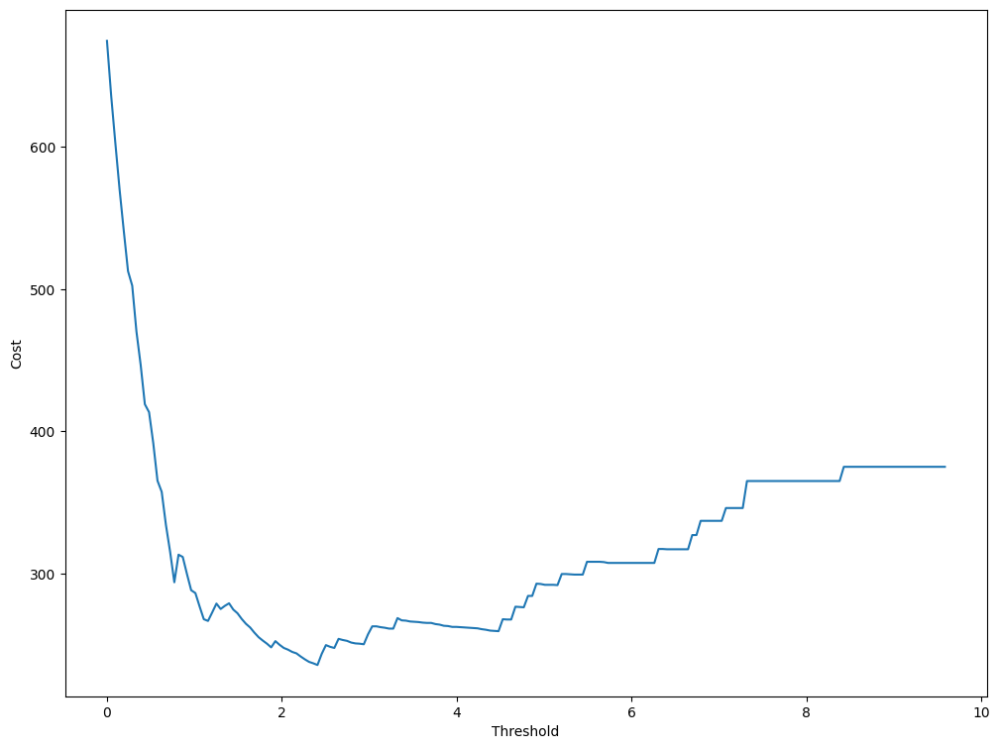

In [ ]:
plt.xlabel('Threshold')
plt.ylabel('Cost')
plt.plot(all_thr_raw, all_cost_raw)
plt.show()

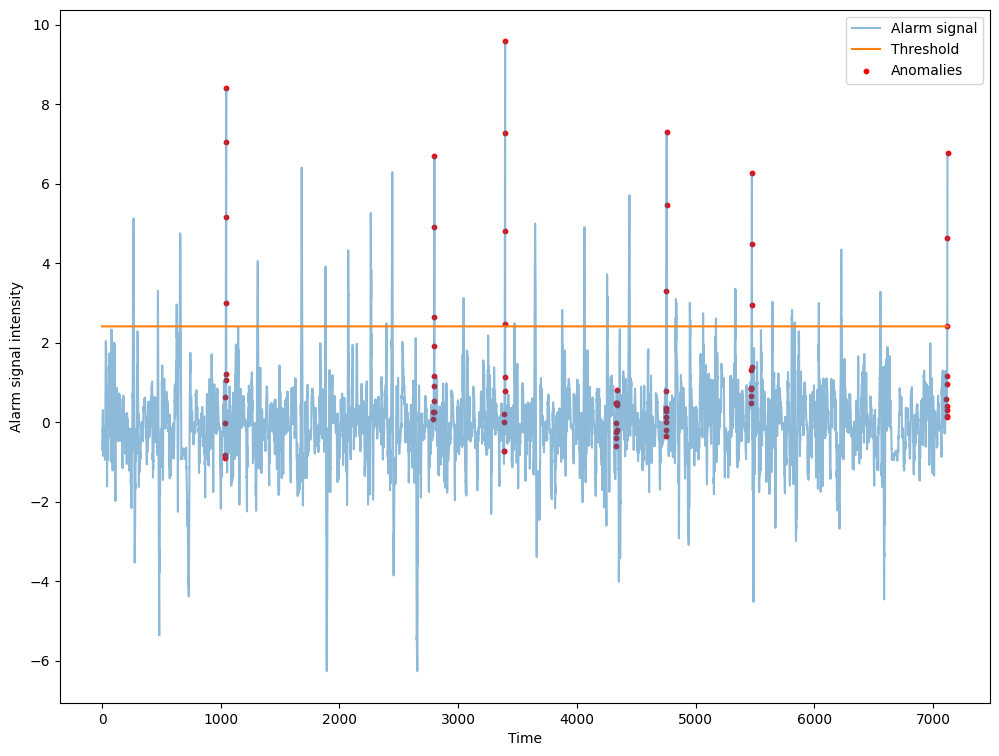

In [ ]:
plot_threshold(val_raw_signal, best_thr_raw, val_raw_rul)

In [ ]:
perf_raw = performance_evaluation(val_raw_signal, best_thr_raw, val_raw_rul)

The total cost of the model is 235.600
Detected 6 faults over 7, missed faults: 1. False alarm: 133
Faults detected with an anticipation of:
 - 0.3s
 - 0.2s
 - 0.3s
 - 0.2s
 - 0.2s
 - 0.2s
The mean anticipation is 0.23s. Total amount of anticipation is 1.4s


In [ ]:
all_perf.append(["raw_signal"] + perf_raw)

### Pre-anomaly detection with AutoEncoders

AutoEncoders are a de facto standard to perform anomaly detection in machine learning. At training time, they are fed only with samples representing a safe behaviour of the machine - i.e. not representing faults. The flag `ae=True` is thought to build the dataset accordingly to this principle.

They are trained to be able to reconstruct the input they received after that the input is processed through an encoder, which reduces the input dimensionality, and a decoder, which reconstitutes the original dimensionality.

An anomaly detection is triggered when the reconstruction error is above a certain threshold, which has to optimized on the validation set.

We talk about pre-anomaly detection since we mark as faulty all those samples which anticipates the real fall in a time window of `margin` samples.

*   How can you determine the maximum dimensionality of the inner bottleneck of an autoencoder?
*   Why the inner bottleneck in the autoencoder is required?



In [ ]:
training_set_ae, validation_set_ae = build_dataset_for_ml_model(df_train, ae=True)

In [ ]:
def build_autoencoder(input_size, hidden):
    input_shape = (input_size, )
    ae_x = keras.Input(shape=input_shape, dtype='float32')
    x = ae_x
    for h in hidden:
        x = layers.Dense(h, activation='relu')(x)
    ae_y = layers.Dense(input_size, activation='linear')(x)
    ae = keras.Model(ae_x, ae_y)   
    
    return ae

#### Model definition

In [ ]:
train_cols_ae = training_set_ae.shape[1] - 1
hidden_ae = [16, 8, 2, 8, 16] # modify here
ae = build_autoencoder(input_size=train_cols_ae, hidden=hidden_ae)
ae.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 3)]               0         
                                                                 
 dense (Dense)               (None, 16)                64        
                                                                 
 dense_1 (Dense)             (None, 8)                 136       
                                                                 
 dense_2 (Dense)             (None, 2)                 18        
                                                                 
 dense_3 (Dense)             (None, 8)                 24        
                                                                 
 dense_4 (Dense)             (None, 16)                144       
                                                                 
 dense_5 (Dense)             (None, 3)                 51    

In [ ]:
ae.compile(optimizer=keras.optimizers.RMSprop(learning_rate=0.0001), 
           loss='mse')

#### Training

In [ ]:
cb_ae = [callbacks.EarlyStopping(patience=30, restore_best_weights=True)]
history_ae = ae.fit(training_set_ae[:, :-1], training_set_ae[:, :-1], validation_split=0.15, # modify here
                    callbacks=cb_ae, batch_size=32, epochs=100, verbose=1) # modify here

Epoch 1/100
693/693 [==============================] - 6s 5ms/step - loss: 0.8815 - val_loss: 1.0164
Epoch 2/100
693/693 [==============================] - 3s 4ms/step - loss: 0.7769 - val_loss: 0.9482
Epoch 3/100
693/693 [==============================] - 3s 4ms/step - loss: 0.6974 - val_loss: 0.9265
Epoch 4/100
693/693 [==============================] - 2s 4ms/step - loss: 0.6414 - val_loss: 0.8881
Epoch 5/100
693/693 [==============================] - 3s 4ms/step - loss: 0.5014 - val_loss: 0.7331
Epoch 6/100
693/693 [==============================] - 3s 5ms/step - loss: 0.3397 - val_loss: 0.5573
Epoch 7/100
693/693 [==============================] - 3s 4ms/step - loss: 0.2767 - val_loss: 0.4667
Epoch 8/100
693/693 [==============================] - 3s 4ms/step - loss: 0.2516 - val_loss: 0.4169
Epoch 9/100
693/693 [==============================] - 3s 4ms/step - loss: 0.2359 - val_loss: 0.3842
Epoch 10/100
693/693 [==============================] - 3s 4ms/step - loss: 0.2252 - val_lo

In [ ]:
# Plot train loss and validation loss
def plot_loss(history, name):
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.ylabel('Loss')
    plt.xlabel('epoch')
    plt.legend(['Train loss', 'Validation loss'], loc='upper right')
    plt.title(name)
    plt.show()

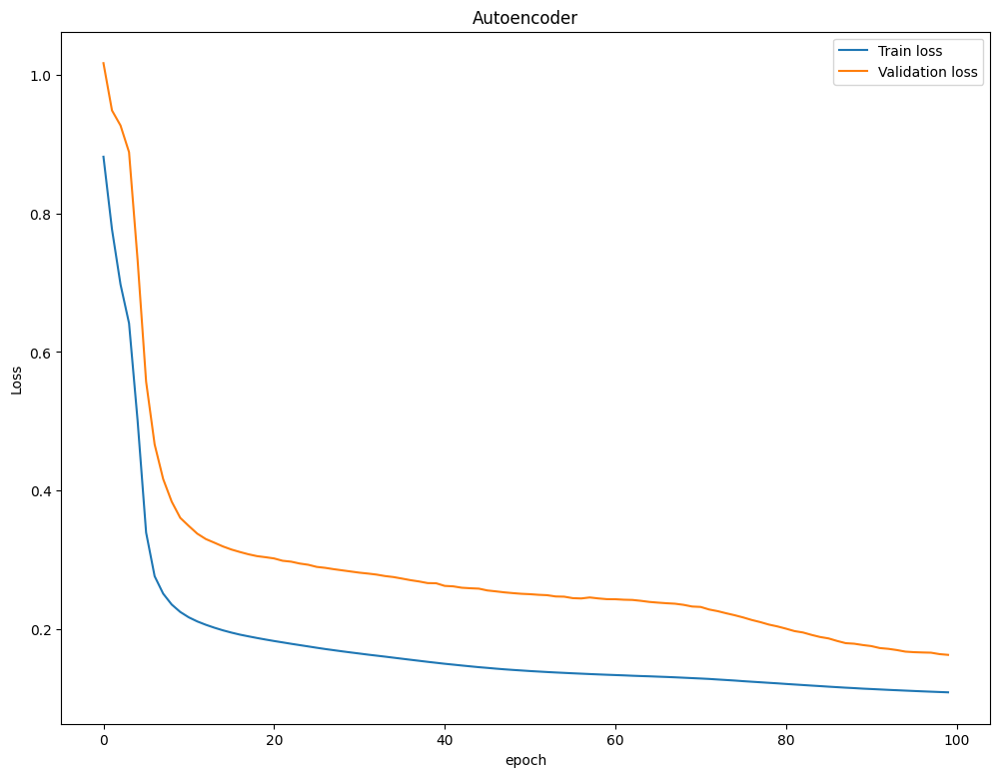

In [ ]:
plot_loss(history_ae, "Autoencoder")

#### Threshold optimization

In [ ]:
preds_ae = ae.predict(validation_set_ae[:, :-1])

223/223 [==============================] - 0s 2ms/step


In [ ]:
signal_ae = pd.Series(data=np.sum(np.square(preds_ae - validation_set_ae[:, :-1]), axis=1))
rul_ae = validation_set_ae[:, -1]

best_cost_ae, best_thr_ae, all_cost_ae, all_thr_ae = threshold_optimization(signal_ae, rul_ae, start=0, end=signal_ae.max(), n_steps=200)

Best threshold: 10.328, best cost = 385.200


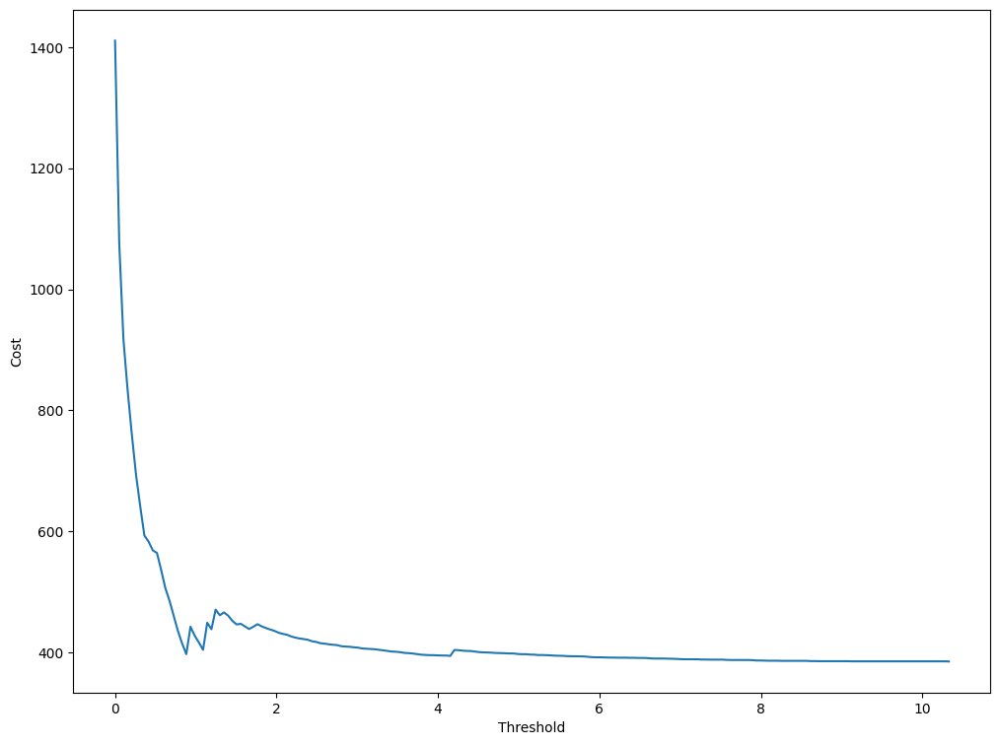

In [ ]:
plt.xlabel('Threshold')
plt.ylabel('Cost')
plt.plot(all_thr_ae, all_cost_ae)
plt.show()

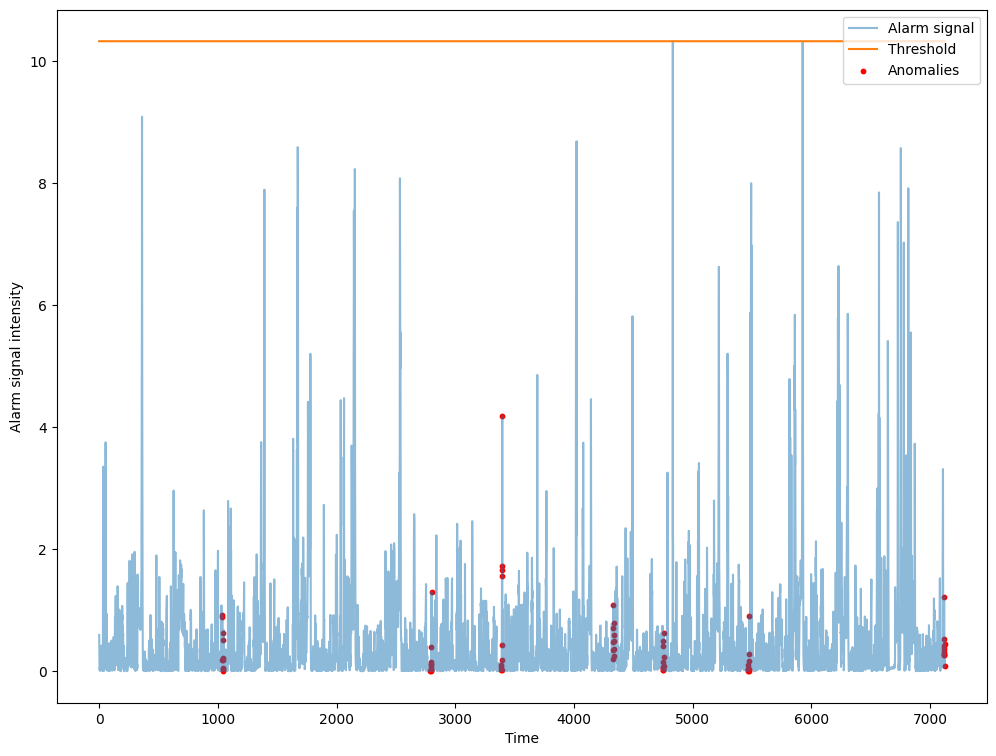

In [ ]:
plot_threshold(signal_ae, best_thr_ae, rul_ae)

In [ ]:
perf_ae = performance_evaluation(signal_ae, best_thr_ae, rul_ae)

The total cost of the model is 385.200
Detected 0 faults over 7, missed faults: 7. False alarm: 1
Faults detected with an anticipation of:
The mean anticipation is 0.00s. Total amount of anticipation is 0.0s


In [ ]:
all_perf.append(["autoencoder"] + perf_ae)

### RUL estimation with Dense Neural Networks

We now prepare a common shared dataset for the logistic neural network and the deep dense neural network. The main difference between the two is the complexity, indeed the deep dense neural networks has hidden layer to handle non-linear relations between inputs and outputs.

In [ ]:
training_set_nn, validation_set_nn = build_dataset_for_ml_model(df_train)

In [ ]:
def build_classifier(input_size, hidden):
    input_shape = (input_size,)
    model_in = keras.Input(shape=input_shape, dtype='float32')
    x = model_in
    for h in hidden:
        x = layers.Dense(h, activation='relu')(x)
    model_out = layers.Dense(1, activation='sigmoid')(x)
    model = keras.Model(model_in, model_out)
    return model

**Class weights** are useful when you have an **unbalanced dataset** and you want to improve single-label classification results. With class weights, you can weight more the samples belonging to the rarest class.

In [ ]:
counts_nn = pd.Series(training_set_nn[:, -1]).value_counts(normalize=True)
class_weight_nn = {0: 1/counts_nn[0], 1: 1/counts_nn[1]}
class_weight_nn

{0: 126.12380952380953, 1: 1.007992084031055}

In [ ]:
input_size_nn = training_set_nn.shape[1] - 1

### Logistic Neural Network

A logistic neural network outputs whether a sample is faulty or not independently from the history, by just looking at the current features.

#### Model definition

In [ ]:
lin_cl = build_classifier(input_size=input_size_nn, hidden=[])
lin_cl.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 3)]               0         
                                                                 
 dense_6 (Dense)             (None, 1)                 4         
                                                                 
Total params: 4
Trainable params: 4
Non-trainable params: 0
_________________________________________________________________


In [ ]:
lin_cl.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), 
               loss='binary_crossentropy')

#### Training

In [ ]:
cb_lin = [callbacks.EarlyStopping(patience=30, restore_best_weights=True)]
history_lin_cl = lin_cl.fit(training_set_nn[:, :-1], training_set_nn[:, -1], validation_split=0.2, # modify here
                            callbacks=cb_lin, class_weight=class_weight_nn, # modify here
                            batch_size=32, epochs=100, verbose=1) # modify here

Epoch 1/100
663/663 [==============================] - 3s 3ms/step - loss: 1.0561 - val_loss: 0.7853
Epoch 2/100
663/663 [==============================] - 2s 3ms/step - loss: 1.0264 - val_loss: 0.7405
Epoch 3/100
663/663 [==============================] - 2s 3ms/step - loss: 1.0111 - val_loss: 0.7099
Epoch 4/100
663/663 [==============================] - 2s 3ms/step - loss: 1.0020 - val_loss: 0.6869
Epoch 5/100
663/663 [==============================] - 2s 3ms/step - loss: 0.9967 - val_loss: 0.6722
Epoch 6/100
663/663 [==============================] - 3s 4ms/step - loss: 0.9932 - val_loss: 0.6637
Epoch 7/100
663/663 [==============================] - 2s 3ms/step - loss: 0.9907 - val_loss: 0.6565
Epoch 8/100
663/663 [==============================] - 2s 3ms/step - loss: 0.9891 - val_loss: 0.6454
Epoch 9/100
663/663 [==============================] - 2s 3ms/step - loss: 0.9879 - val_loss: 0.6432
Epoch 10/100
663/663 [==============================] - 2s 3ms/step - loss: 0.9869 - val_lo

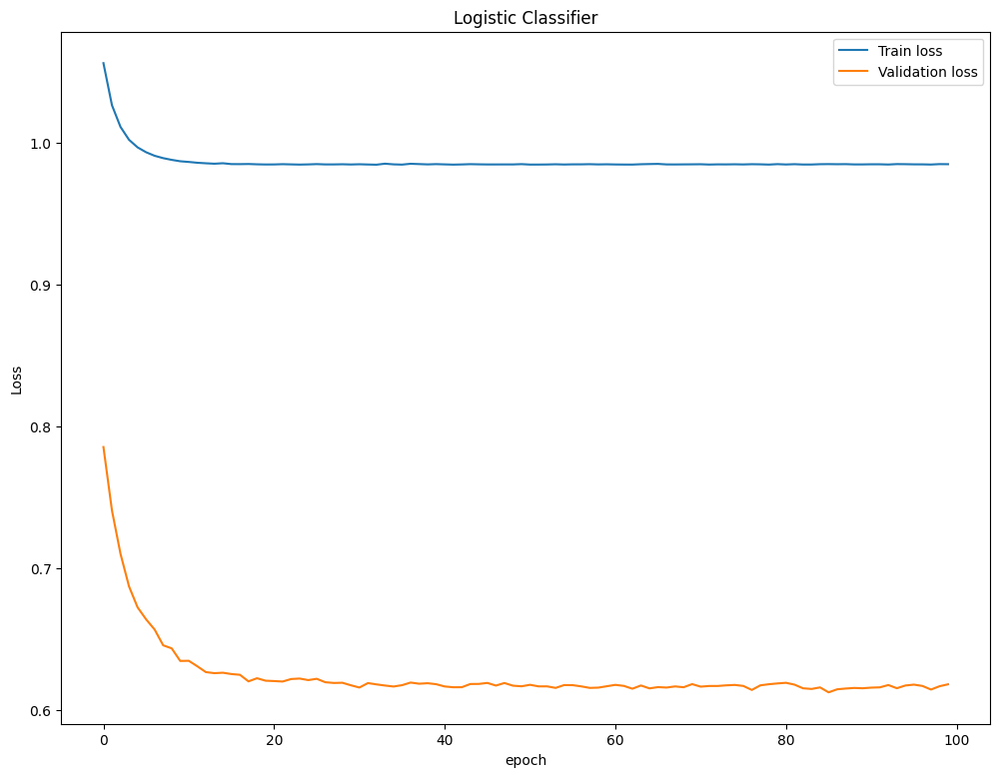

In [ ]:
plot_loss(history_lin_cl, "Logistic Classifier")

#### Threshold optimization

In [ ]:
preds_lin_cl = lin_cl.predict(validation_set_nn[:, :-1]).ravel()

223/223 [==============================] - 0s 1ms/step


In [ ]:
signal_lin_cl = pd.Series(data=(1 - preds_lin_cl))
rul_lin_cl = validation_set_nn[:, -1]

best_cost_lin_cl, best_thr_lin_cl, all_cost_lin_cl, all_thr_lin_cl = threshold_optimization(signal_lin_cl, rul_lin_cl, start=0, end=signal_lin_cl.max(), n_steps=200)

Best threshold: 0.959, best cost = 262.000


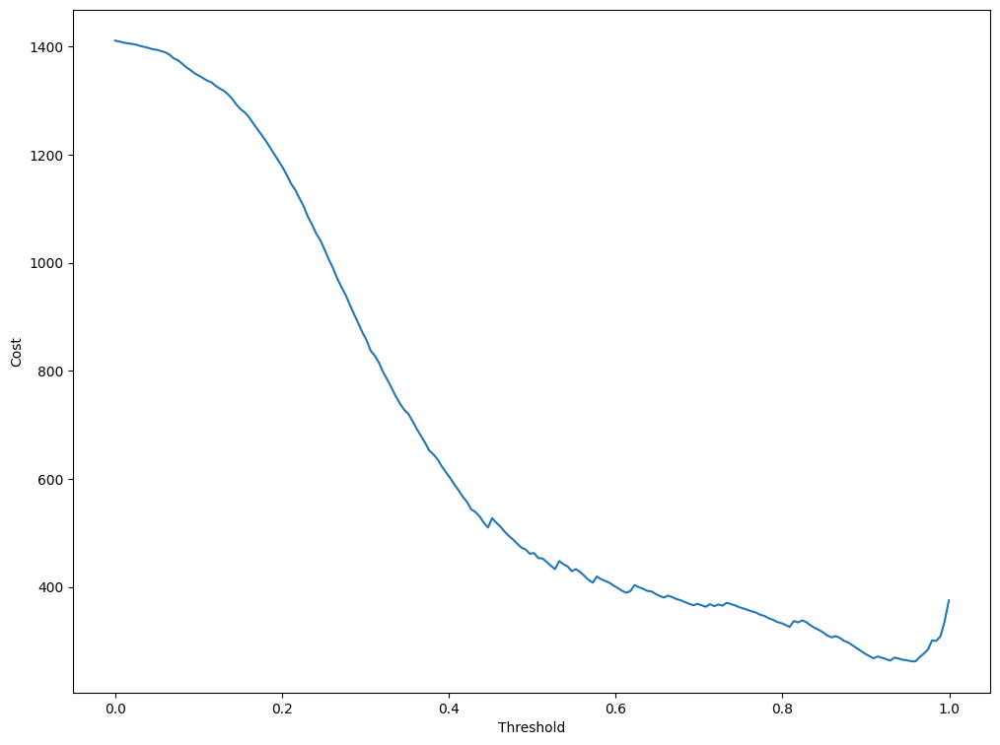

In [ ]:
plt.xlabel('Threshold')
plt.ylabel('Cost')
plt.plot(all_thr_lin_cl, all_cost_lin_cl)
plt.show()

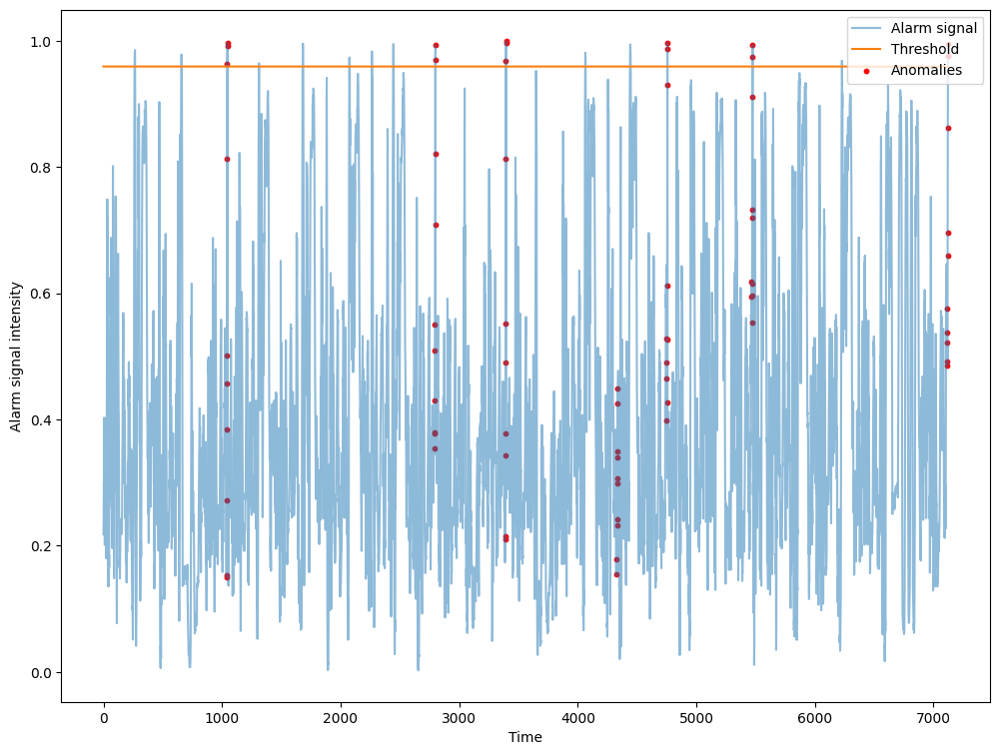

In [ ]:
plot_threshold(signal_lin_cl, best_thr_lin_cl, rul_lin_cl)

In [ ]:
perf_lin_cl = performance_evaluation(signal_lin_cl, best_thr_lin_cl, rul_lin_cl)

The total cost of the model is 262.000
Detected 6 faults over 7, missed faults: 1. False alarm: 35
Faults detected with an anticipation of:
 - 0.2s
 - 0.1s
 - 0.2s
 - 0.1s
 - 0.1s
 - 0.1s
The mean anticipation is 0.13s. Total amount of anticipation is 0.8s


In [ ]:
all_perf.append(["logistic_nn"] + perf_lin_cl)

### Deep Dense Neural Network

As a logistic neural network, a deep dense neural network takes advantage of only the current features to establish whether a sample is faulty or not. It can have several hidden layers.

*    This model can also be referred as "Deep Dense Feed Forward Neural Network", can you get the reason?

#### Model definition

In [ ]:
ffnn = build_classifier(input_size=input_size_nn, hidden=[64, 32]) # modify here
ffnn.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 3)]               0         
                                                                 
 dense_7 (Dense)             (None, 64)                256       
                                                                 
 dense_8 (Dense)             (None, 32)                2080      
                                                                 
 dense_9 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2,369
Trainable params: 2,369
Non-trainable params: 0
_________________________________________________________________


In [ ]:
ffnn.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001), 
             loss='binary_crossentropy')

#### Training

In [ ]:
cb_ffnn = [callbacks.EarlyStopping(patience=30, restore_best_weights=True)]
history_ffnn = ffnn.fit(training_set_nn[:, :-1], training_set_nn[:, -1], validation_split=0.2, # modify here
                        callbacks=cb_ffnn,  # modify here
                        class_weight=class_weight_nn, # modify here
                        batch_size=32, epochs=100, verbose=1) # modify here

Epoch 1/100
663/663 [==============================] - 4s 4ms/step - loss: 1.1872 - val_loss: 0.5925
Epoch 2/100
663/663 [==============================] - 2s 4ms/step - loss: 1.0375 - val_loss: 0.5491
Epoch 3/100
663/663 [==============================] - 3s 5ms/step - loss: 0.9785 - val_loss: 0.5176
Epoch 4/100
663/663 [==============================] - 2s 4ms/step - loss: 0.9486 - val_loss: 0.5014
Epoch 5/100
663/663 [==============================] - 2s 3ms/step - loss: 0.9307 - val_loss: 0.5063
Epoch 6/100
663/663 [==============================] - 2s 3ms/step - loss: 0.9176 - val_loss: 0.4853
Epoch 7/100
663/663 [==============================] - 2s 4ms/step - loss: 0.9084 - val_loss: 0.4813
Epoch 8/100
663/663 [==============================] - 3s 5ms/step - loss: 0.8999 - val_loss: 0.4682
Epoch 9/100
663/663 [==============================] - 2s 3ms/step - loss: 0.8940 - val_loss: 0.4713
Epoch 10/100
663/663 [==============================] - 2s 3ms/step - loss: 0.8884 - val_lo

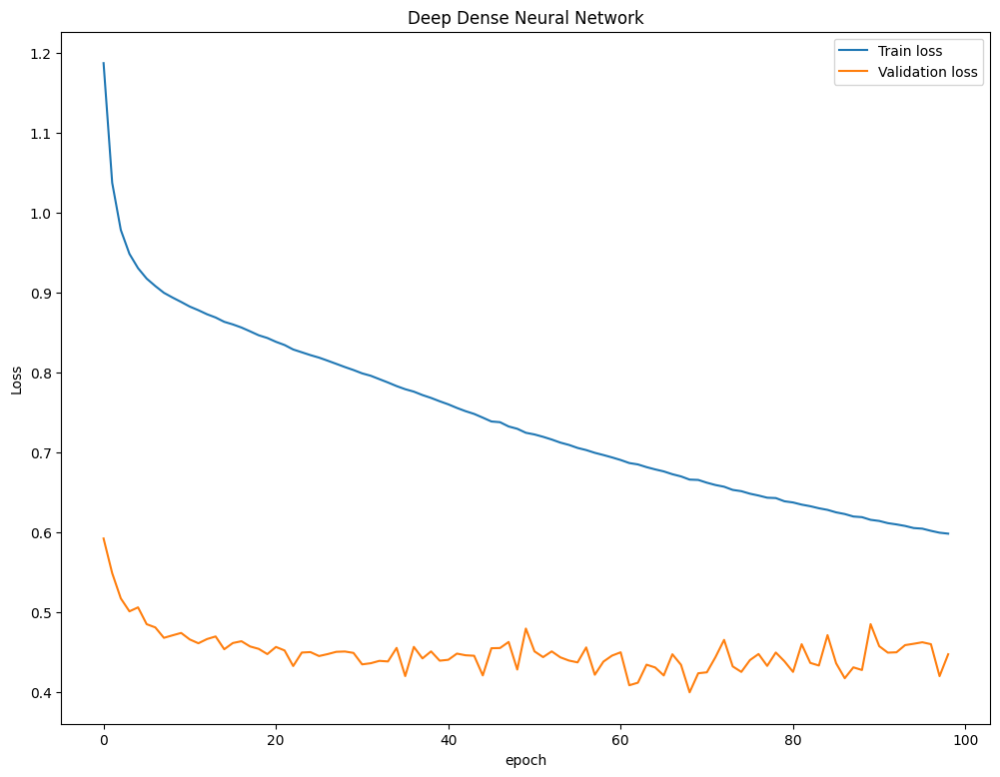

In [ ]:
plot_loss(history_ffnn, "Deep Dense Neural Network")

#### Threshold optimization

In [ ]:
preds_ffnn = ffnn.predict(validation_set_nn[:, :-1]).ravel()

223/223 [==============================] - 0s 1ms/step


In [ ]:
signal_ffnn = pd.Series(data=(1 - preds_ffnn))
rul_ffnn = validation_set_nn[:, -1]

best_cost_ffnn, best_thr_ffnn, all_cost_ffnn, all_thr_ffnn = threshold_optimization(signal_ffnn, rul_ffnn, start=0, end=signal_ffnn.max(), n_steps=200)

Best threshold: 0.729, best cost = 278.000


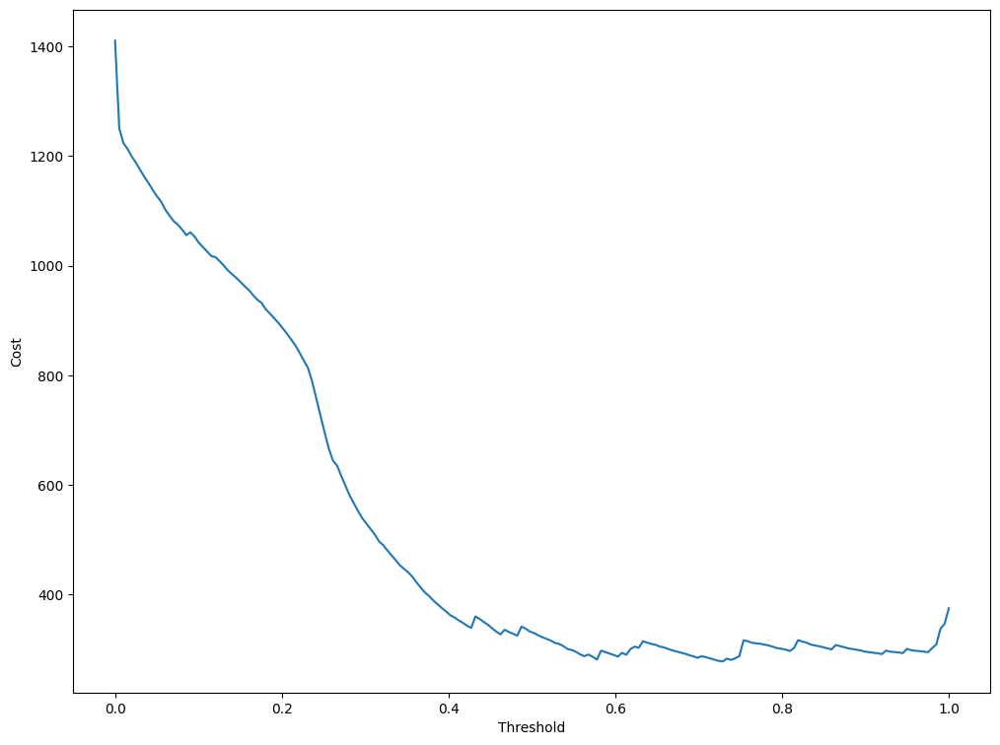

In [ ]:
plt.xlabel('Threshold')
plt.ylabel('Cost')
plt.plot(all_thr_ffnn, all_cost_ffnn)
plt.show()

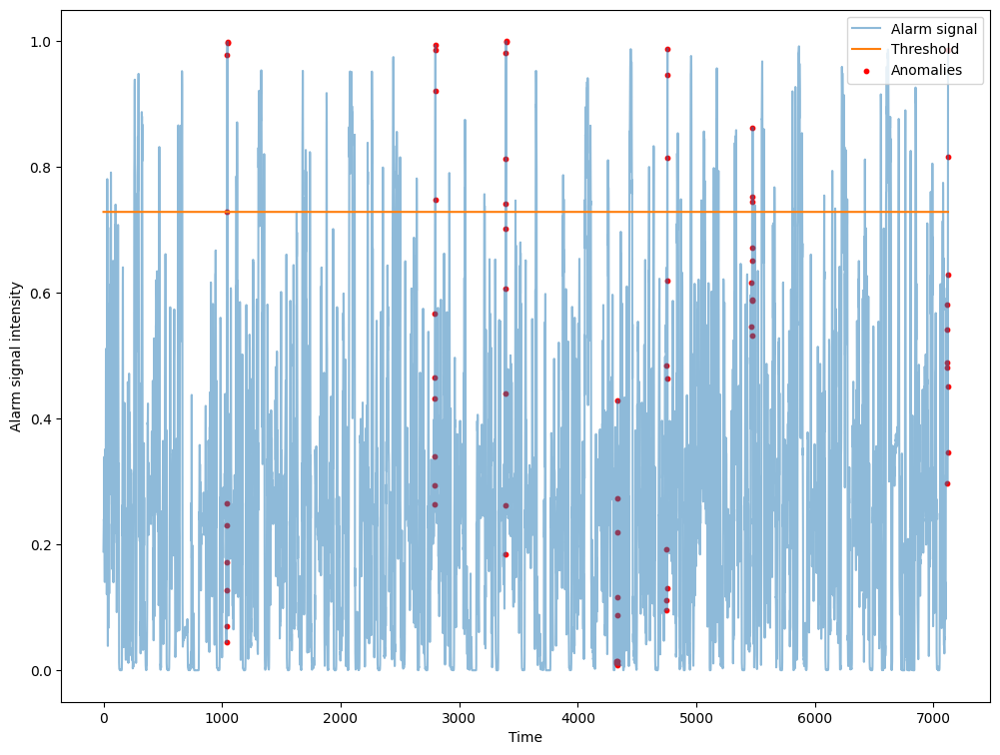

In [ ]:
plot_threshold(signal_ffnn, best_thr_ffnn, rul_ffnn)

In [ ]:
perf_ffnn = performance_evaluation(signal_ffnn, best_thr_ffnn, rul_ffnn)

The total cost of the model is 278.000
Detected 6 faults over 7, missed faults: 1. False alarm: 435
Faults detected with an anticipation of:
 - 0.3s
 - 0.3s
 - 0.4s
 - 0.2s
 - 0.4s
 - 0.1s
The mean anticipation is 0.28s. Total amount of anticipation is 1.7s


In [ ]:
all_perf.append(["deep_nn"] + perf_ffnn)

### Convolutional Neural Network

Convolutional neural networks can handle sequences of a fixed length as input, therefore they can rely on a history of observations to detect a fault.

In [ ]:
traning_set_cnn, validation_set_cnn = build_dataset_for_ml_model(df_train, as_list=True)

train_cols_cnn = ['differencing_Ax_mean', 'differencing_Gz_mean', 'differencing_Ay_mean']
tr_sw, tr_sw_r = sliding_window_by_fault(traning_set_cnn, train_cols_cnn)
val_sw, val_sw_r = sliding_window_by_fault(validation_set_cnn, train_cols_cnn)

In [ ]:
# some sequences
tr_sw[0].shape, tr_sw_r[0], tr_sw[-1].shape, tr_sw_r[-1]

((10, 3), 1, (10, 3), 0)

In [ ]:
input_size_cnn = tr_sw[0].shape[1]

In [ ]:
counts_cnn = pd.Series(tr_sw_r).value_counts(normalize=True)
class_weight_cnn = {0: 1/counts_cnn[0], 1: 1/counts_cnn[1]}
class_weight_cnn

{0: 125.22380952380952, 1: 1.0080499865833557}

#### Model definition

In [ ]:
def build_cnn_regressor(input_size, filters, kernel_size, hidden):
    input_shape = (w_len, input_size)
    model_in = keras.Input(shape=input_shape, dtype='float32')
    model_out = layers.Conv1D(filters, kernel_size=kernel_size, 
                              activation='relu')(model_in)
    model_out = layers.Flatten()(model_out)
    for h in hidden:
        model_out = layers.Dense(h, activation='relu')(model_out)
    model_out = layers.Dense(1, activation='sigmoid')(model_out)
    model = keras.Model(model_in, model_out)
    return model

In [ ]:
cnn = build_cnn_regressor(input_size=input_size_cnn, filters=4, # modify here
                          kernel_size=5, hidden=[64, 32]) # modify here
cnn.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 10, 3)]           0         
                                                                 
 conv1d (Conv1D)             (None, 6, 4)              64        
                                                                 
 flatten (Flatten)           (None, 24)                0         
                                                                 
 dense_10 (Dense)            (None, 64)                1600      
                                                                 
 dense_11 (Dense)            (None, 32)                2080      
                                                                 
 dense_12 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3,777
Trainable params: 3,777
Non-trainable p

In [ ]:
cnn.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001), 
            loss='binary_crossentropy')

#### Training

In [ ]:
cb_cnn = [callbacks.EarlyStopping(patience=30, restore_best_weights=True)]
history_cnn = cnn.fit(tr_sw, tr_sw_r, validation_split=0.2, # modify here
                      callbacks=cb_cnn, # modify here
                      class_weight=class_weight_cnn, # modify here
                      batch_size=32, epochs=100, verbose=1) # modify here

Epoch 1/100
658/658 [==============================] - 6s 5ms/step - loss: 1.3982 - val_loss: 0.5376
Epoch 2/100
658/658 [==============================] - 3s 4ms/step - loss: 1.3168 - val_loss: 0.5582
Epoch 3/100
658/658 [==============================] - 3s 4ms/step - loss: 1.2604 - val_loss: 0.5267
Epoch 4/100
658/658 [==============================] - 3s 4ms/step - loss: 1.2063 - val_loss: 0.5296
Epoch 5/100
658/658 [==============================] - 3s 4ms/step - loss: 1.1441 - val_loss: 0.5200
Epoch 6/100
658/658 [==============================] - 3s 5ms/step - loss: 1.0829 - val_loss: 0.5515
Epoch 7/100
658/658 [==============================] - 3s 4ms/step - loss: 1.0289 - val_loss: 0.5080
Epoch 8/100
658/658 [==============================] - 3s 4ms/step - loss: 0.9899 - val_loss: 0.5144
Epoch 9/100
658/658 [==============================] - 3s 4ms/step - loss: 0.9589 - val_loss: 0.4855
Epoch 10/100
658/658 [==============================] - 3s 5ms/step - loss: 0.9384 - val_lo

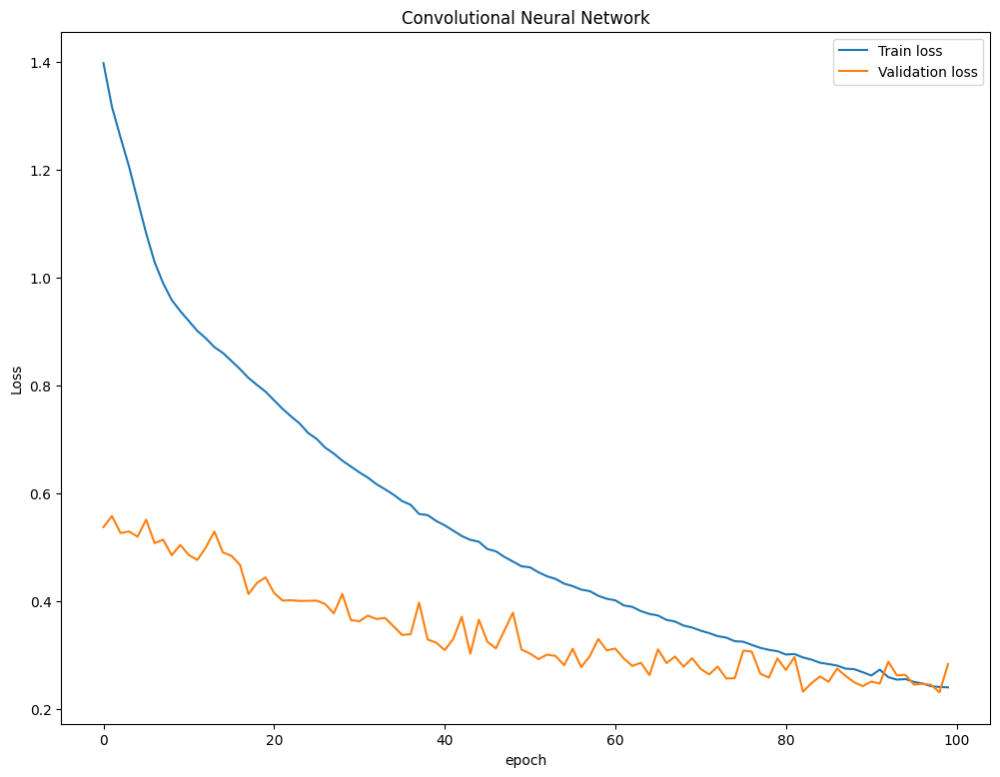

In [ ]:
plot_loss(history_cnn, "Convolutional Neural Network")

#### Threshold optimization

In [ ]:
preds_cnn = cnn.predict(val_sw).ravel()

221/221 [==============================] - 0s 2ms/step


In [ ]:
signal_cnn = pd.Series(data=(1 - preds_cnn))
rul_cnn = val_sw_r

best_cost_cnn, best_thr_cnn, all_cost_cnn, all_thr_cnn = threshold_optimization(signal_cnn, rul_cnn, start=0, end=signal_cnn.max(), n_steps=200)

Best threshold: 0.709, best cost = 167.600


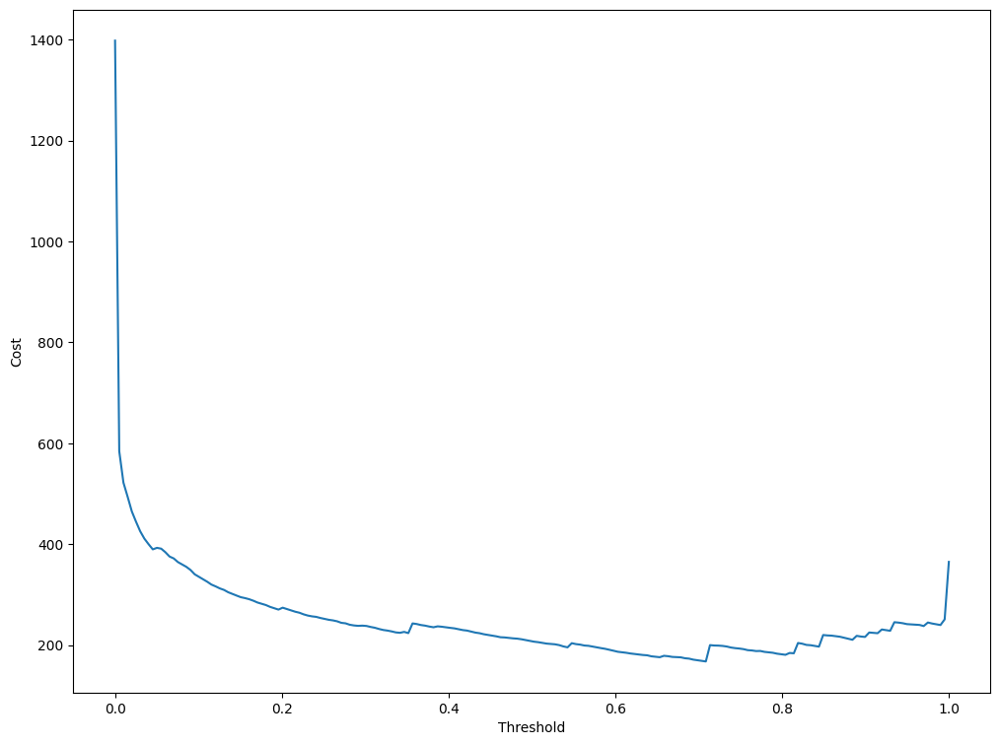

In [ ]:
plt.xlabel('Threshold')
plt.ylabel('Cost')
plt.plot(all_thr_cnn, all_cost_cnn)
plt.show()

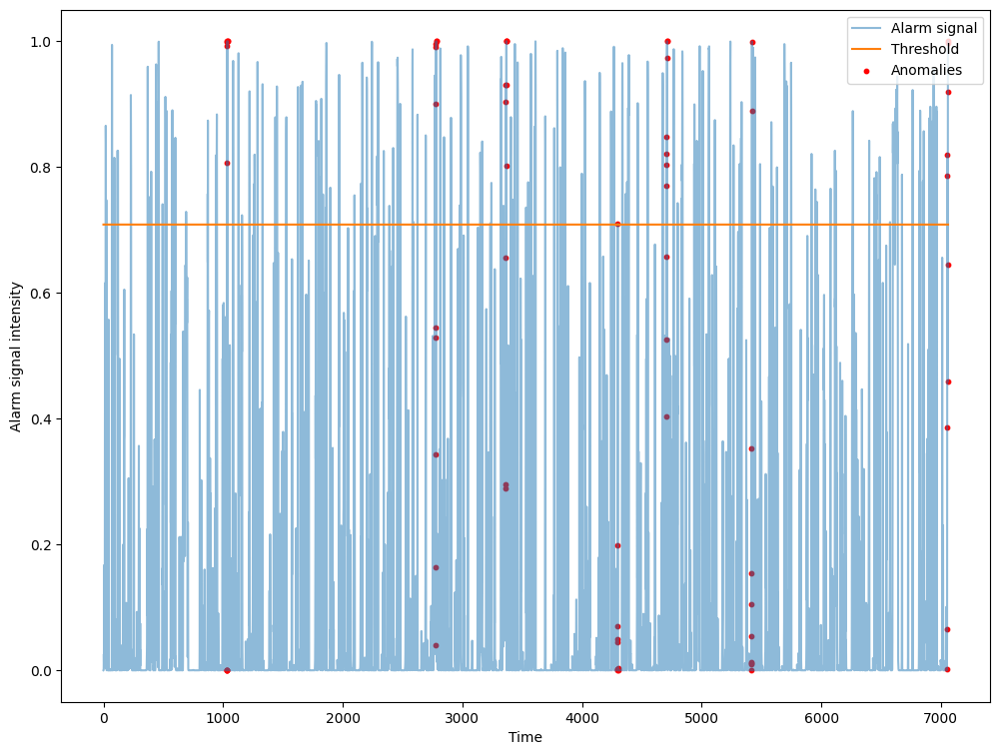

In [ ]:
plot_threshold(signal_cnn, best_thr_cnn, rul_cnn)

In [ ]:
perf_cnn = performance_evaluation(signal_cnn, best_thr_cnn, rul_cnn)

The total cost of the model is 167.600
Detected 7 faults over 7, missed faults: 0. False alarm: 363
Faults detected with an anticipation of:
 - 0.5s
 - 0.4s
 - 0.6s
 - 0.3s
 - 0.8s
 - 0.1s
 - 0.6s
The mean anticipation is 0.47s. Total amount of anticipation is 3.3s


In [ ]:
all_perf.append(["conv_nn"] + perf_cnn)

### Recurrent Neural Network

Recurrent models can handle a sequence of indefinite lenght as input to predict a fault. They are the most complex models taken into account in this testbed.

In [ ]:
TIME_STEPS = margin

traning_set_rnn, validation_set_rnn = build_dataset_for_ml_model(df_train)
X_train_rnn, y_train_rnn = create_dataset_3D(traning_set_rnn[:, :-1], 
                                             traning_set_rnn[:, -1], 
                                             TIME_STEPS)
X_val_rnn, y_val_rnn = create_dataset_3D(validation_set_rnn[:, :-1], 
                                         validation_set_rnn[:, -1],   
                                         TIME_STEPS)
print('X_train_rnn.shape: ', X_train_rnn.shape)
print('y_train_rnn.shape: ', y_train_rnn.shape)
print('X_val_rnn.shape: ', X_val_rnn.shape)
print('y_val_rnn.shape: ', y_val_rnn.shape)

X_train_rnn.shape:  (26476, 10, 3)
y_train_rnn.shape:  (26476, 1)
X_val_rnn.shape:  (7114, 10, 3)
y_val_rnn.shape:  (7114, 1)


In [ ]:
counts_rnn = pd.Series(tr_sw_r).value_counts(normalize=True)
class_weight_rnn = {0: 1/counts_rnn[0], 1: 1/counts_rnn[1]}
class_weight_rnn

{0: 125.22380952380952, 1: 1.0080499865833557}

#### Model definition

In [ ]:
# Create BiLSTM model for classification
def create_model_bilstm_cl(units, X_train, lr=0.0001):
    model = keras.Sequential()
    model.add(keras.layers.Bidirectional(keras.layers.LSTM(units=units,                             
              return_sequences=True),
              input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(keras.layers.Bidirectional(keras.layers.LSTM(units=units)))
    model.add(keras.layers.Dense(1, activation="sigmoid"))
    #Compile model
    model.compile(loss='binary_crossentropy', 
                  optimizer=keras.optimizers.Adam(learning_rate=lr))
    return model

# Create LSTM or GRU model
def create_model_cl(units, m, X_train, lr=0.0001):
    model = keras.Sequential()
    model.add(m (units = units, return_sequences = True,
                input_shape = [X_train.shape[1], X_train.shape[2]]))
    model.add(keras.layers.Dropout(0.2))
    model.add(m (units = units))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.Dense(units = 1, activation="sigmoid"))
    #Compile model
    model.compile(loss='binary_crossentropy', 
                  optimizer=keras.optimizers.Adam(learning_rate=lr))
    return model

In [ ]:
# BiLSTM
model_bilstm = create_model_bilstm_cl(64, X_train_rnn) # modify here
# GRU and LSTM
model_gru = create_model_cl(64, keras.layers.GRU, X_train_rnn) # modify here
model_lstm = create_model_cl(64, keras.layers.LSTM, X_train_rnn) # modify here

#### Training

In [ ]:
def fit_model(model, name, X_train, y_train, pat=12, ep=50, bs=32):
        print("\n", name)
        early_stop = keras.callbacks.EarlyStopping(monitor='val_loss',
                                                   patience=pat)
        history = model.fit(X_train, y_train, epochs=ep,
                            class_weight=class_weight_rnn,
                            validation_split=0.2, batch_size=bs,
                            shuffle=False, callbacks=[early_stop])
        return history

In [ ]:
history_bilstm = fit_model(model_bilstm, "model_bilstm", X_train_rnn, y_train_rnn) # modify here
history_lstm = fit_model(model_lstm, "model_lstm", X_train_rnn, y_train_rnn) # modify here
history_gru = fit_model(model_gru, "model_gru", X_train_rnn, y_train_rnn) # modify here


 model_bilstm
Epoch 1/50
662/662 [==============================] - 17s 13ms/step - loss: 1.2882 - val_loss: 0.6897
Epoch 2/50
662/662 [==============================] - 6s 9ms/step - loss: 1.1486 - val_loss: 0.6365
Epoch 3/50
662/662 [==============================] - 7s 10ms/step - loss: 1.0844 - val_loss: 0.6080
Epoch 4/50
662/662 [==============================] - 6s 9ms/step - loss: 1.0225 - val_loss: 0.5980
Epoch 5/50
662/662 [==============================] - 6s 10ms/step - loss: 1.0061 - val_loss: 0.5855
Epoch 6/50
662/662 [==============================] - 6s 9ms/step - loss: 0.9793 - val_loss: 0.5736
Epoch 7/50
662/662 [==============================] - 6s 10ms/step - loss: 0.9703 - val_loss: 0.5610
Epoch 8/50
662/662 [==============================] - 6s 9ms/step - loss: 0.9478 - val_loss: 0.5503
Epoch 9/50
662/662 [==============================] - 6s 9ms/step - loss: 0.9404 - val_loss: 0.5394
Epoch 10/50
662/662 [==============================] - 6s 10ms/step - loss: 0.92

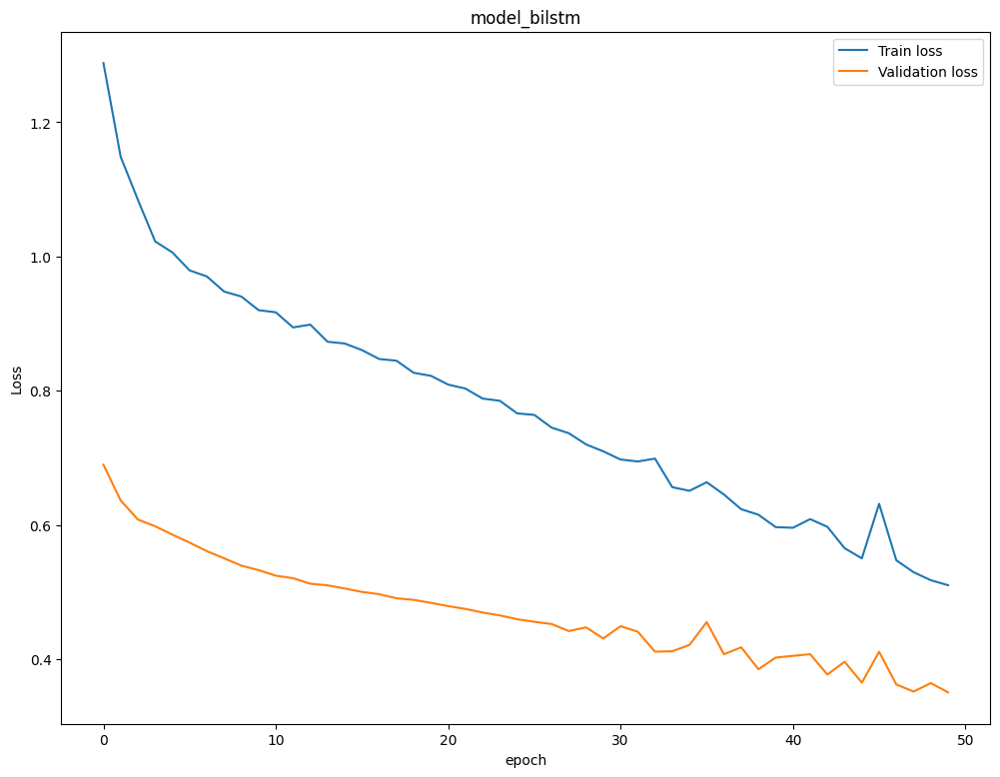

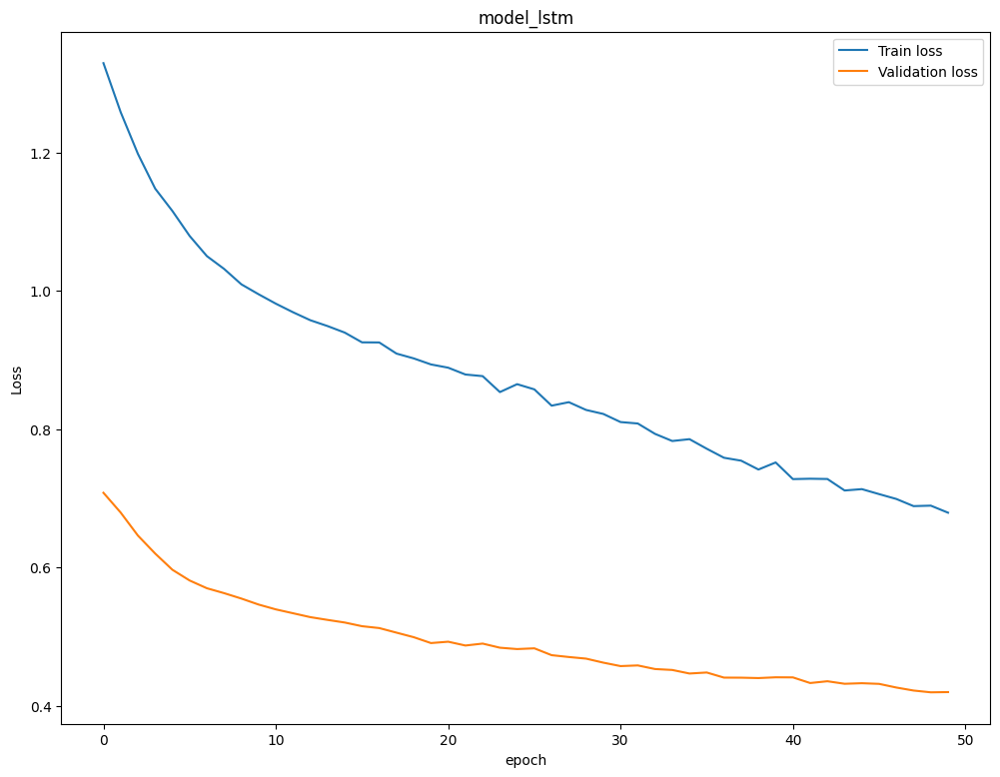

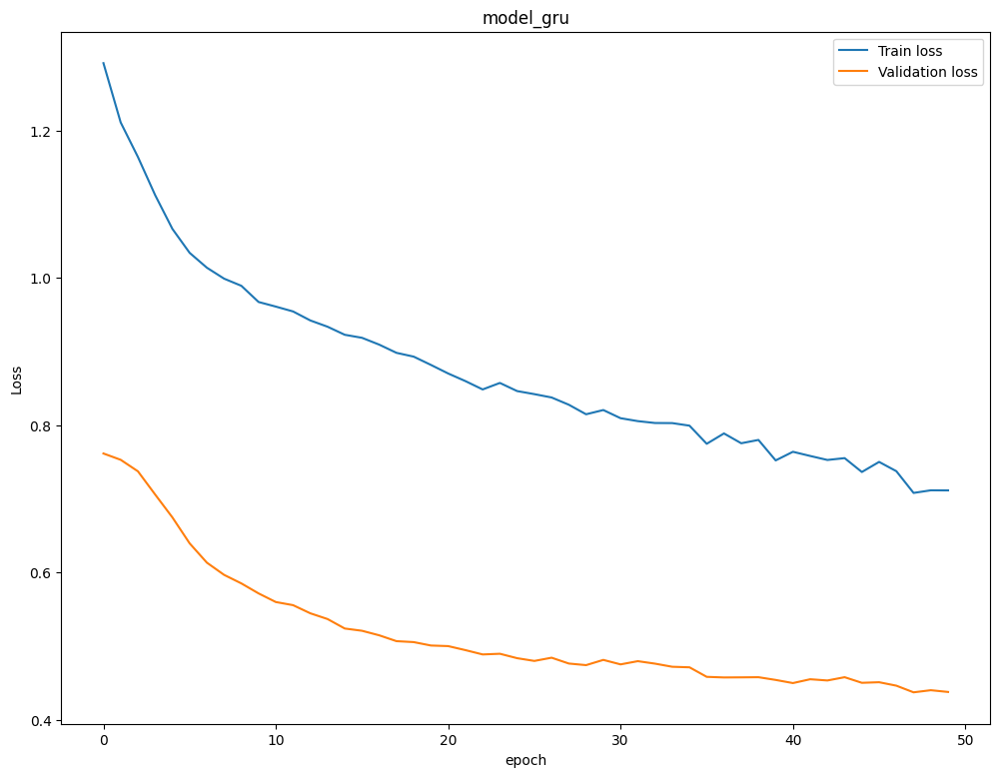

In [ ]:
plot_loss(history_bilstm, "model_bilstm")
plot_loss(history_lstm, "model_lstm")
plot_loss(history_gru, "model_gru")

#### Threshold optimization

In [ ]:
preds_bilstm = model_bilstm.predict(X_val_rnn).ravel()
preds_lstm = model_lstm.predict(X_val_rnn).ravel()
preds_gru = model_gru.predict(X_val_rnn).ravel()

signal_bilstm = pd.Series(data=(1 - preds_bilstm))
rul_bilstm = y_val_rnn
signal_lstm = pd.Series(data=(1 - preds_lstm))
rul_lstm = y_val_rnn
signal_gru = pd.Series(data=(1 - preds_gru))
rul_gru = y_val_rnn

best_cost_bilstm, best_thr_bilstm, all_cost_bilstm, all_thr_bilstm = threshold_optimization(signal_bilstm, rul_bilstm, start=0, end=signal_bilstm.max(), n_steps=200)
best_cost_lstm, best_thr_lstm, all_cost_lstm, all_thr_lstm = threshold_optimization(signal_lstm, rul_lstm, start=0, end=signal_lstm.max(), n_steps=200)
best_cost_gru, best_thr_gru, all_cost_gru, all_thr_gru = threshold_optimization(signal_gru, rul_gru, start=0, end=signal_gru.max(), n_steps=200)

223/223 [==============================] - 1s 2ms/step
Best threshold: 0.798, best cost = 219.600
Best threshold: 0.653, best cost = 242.000
Best threshold: 0.823, best cost = 192.800


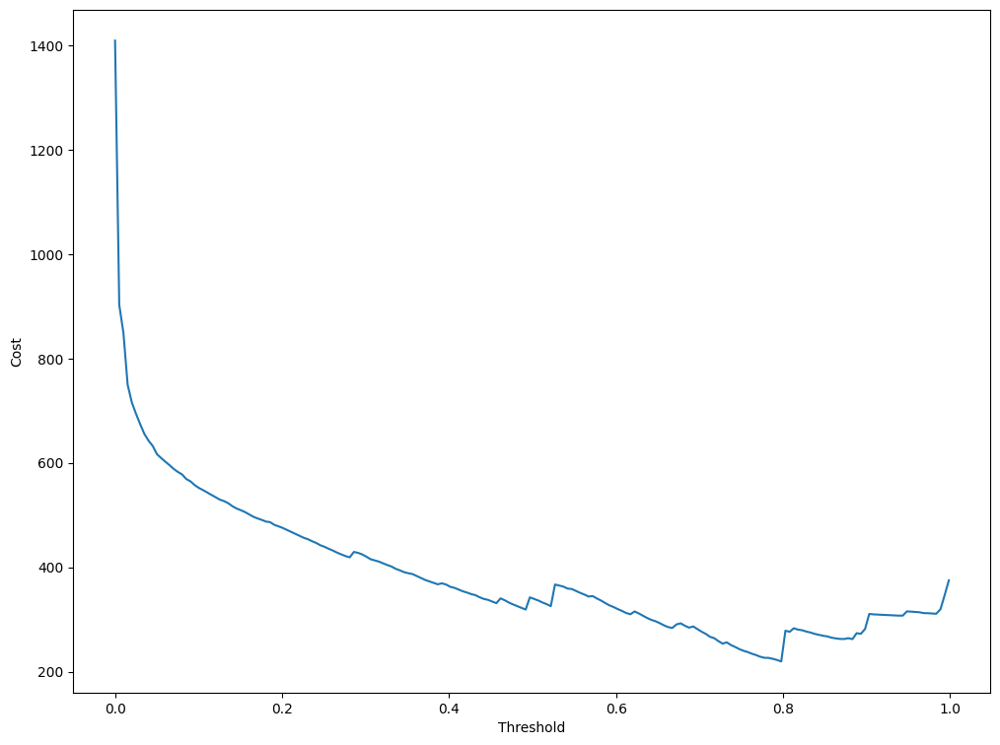

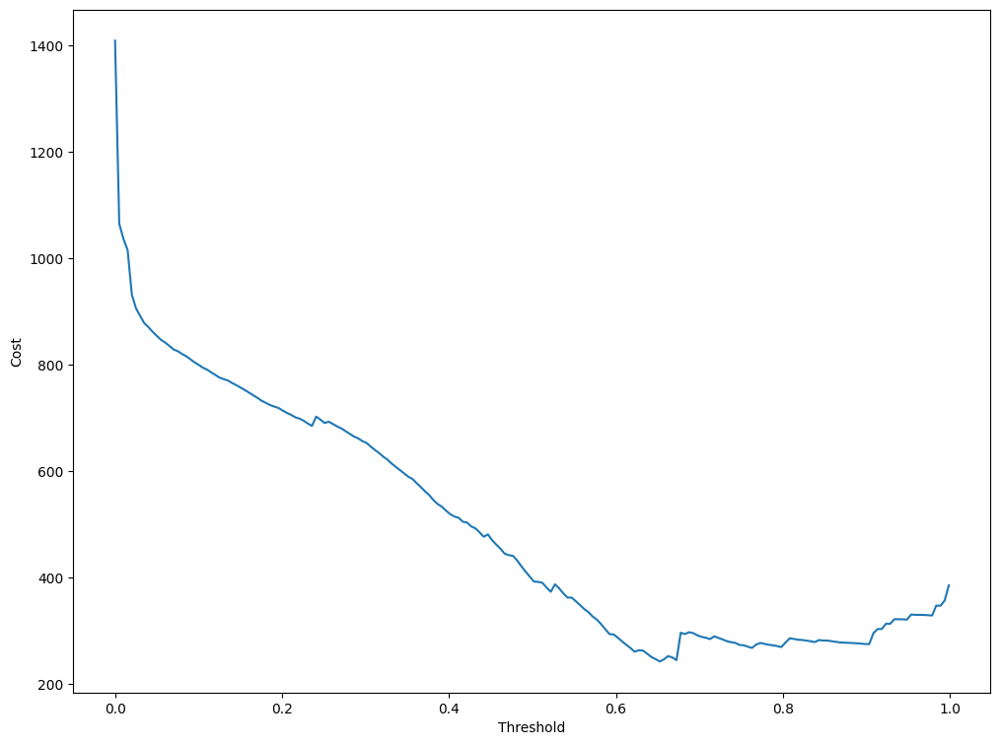

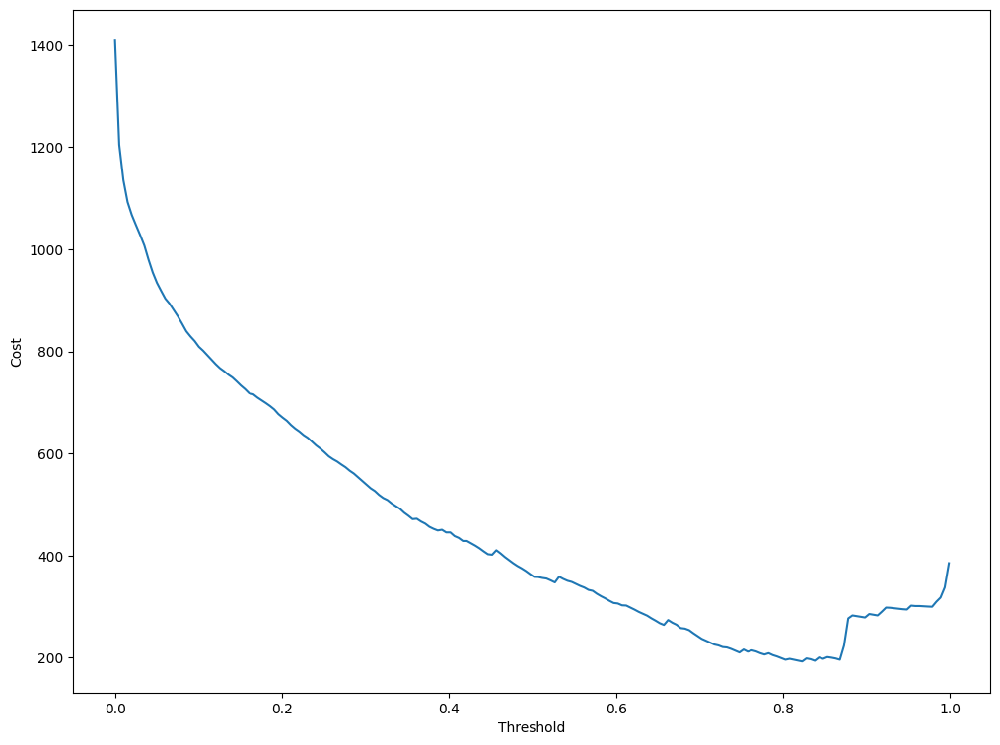

In [ ]:
plt.xlabel('Threshold')
plt.ylabel('Cost')
plt.plot(all_thr_bilstm, all_cost_bilstm)
plt.show()
plt.xlabel('Threshold')
plt.ylabel('Cost')
plt.plot(all_thr_lstm, all_cost_lstm)
plt.show()
plt.xlabel('Threshold')
plt.ylabel('Cost')
plt.plot(all_thr_gru, all_cost_gru)
plt.show()

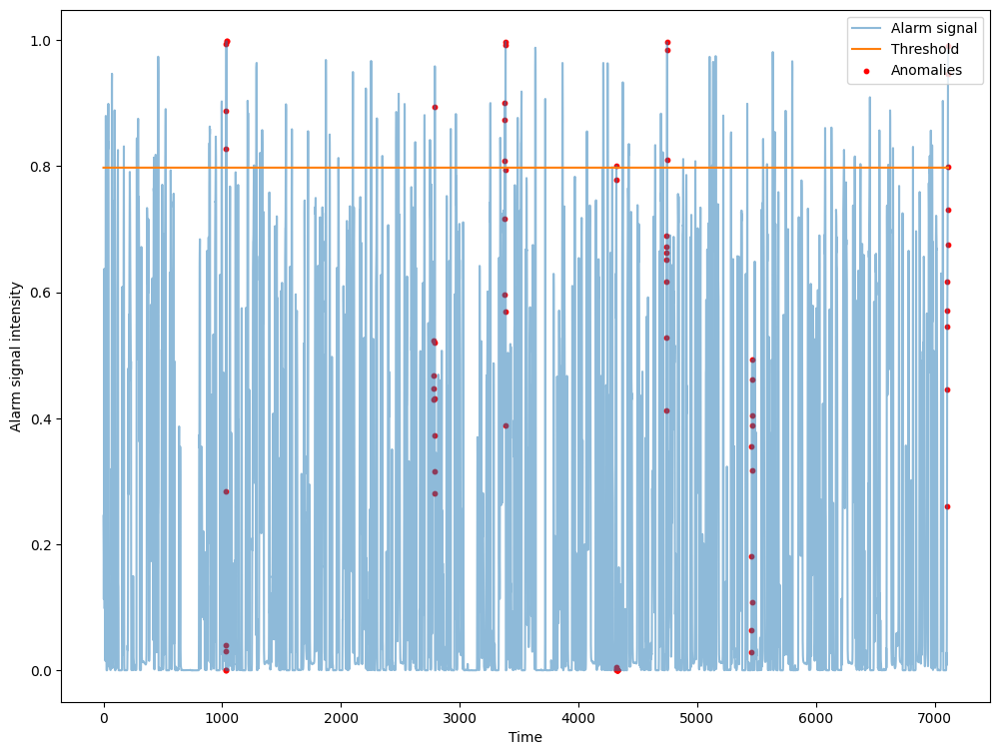

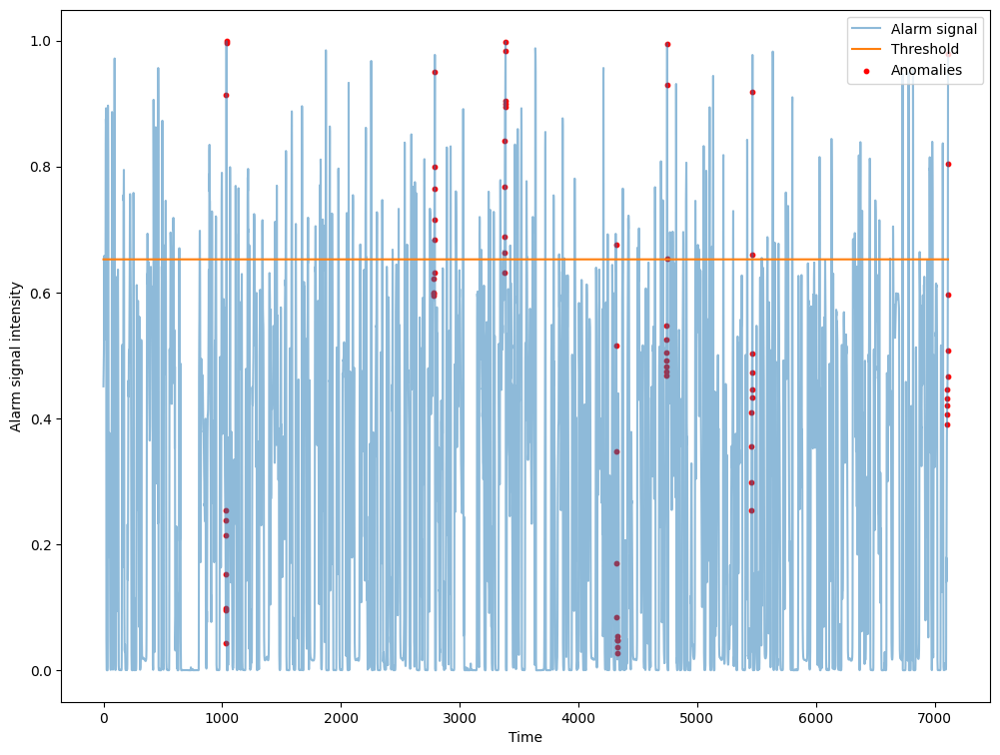

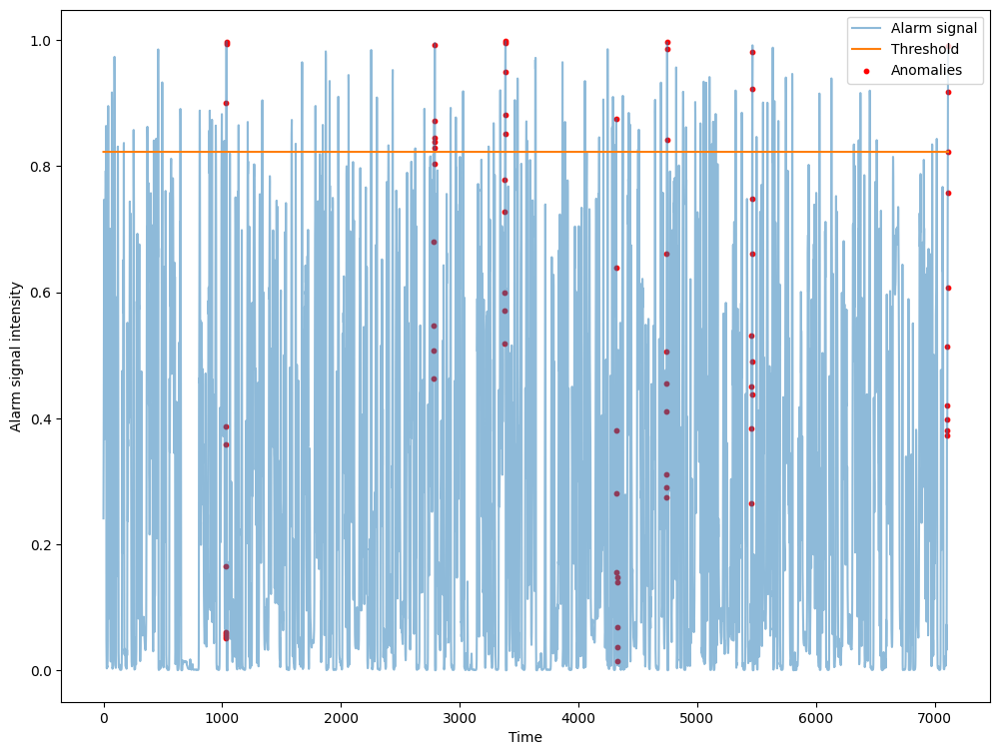

In [ ]:
plot_threshold(signal_bilstm, best_thr_bilstm, rul_bilstm)
plot_threshold(signal_lstm, best_thr_lstm, rul_lstm)
plot_threshold(signal_gru, best_thr_gru, rul_gru)

In [ ]:
print("Bi-LSTM:")
perf_bilstm = performance_evaluation(signal_bilstm, best_thr_bilstm, rul_bilstm)
print("\nLSTM:")
perf_lstm = performance_evaluation(signal_lstm, best_thr_lstm, rul_lstm)
print()
print("\nGRU:")
perf_gru = performance_evaluation(signal_gru, best_thr_gru, rul_gru)

Bi-LSTM:
The total cost of the model is 219.600
Detected 6 faults over 7, missed faults: 1. False alarm: 233
Faults detected with an anticipation of:
 - 0.4s
 - 0.0s
 - 0.8s
 - 0.8s
 - 0.2s
 - 0.2s
The mean anticipation is 0.40s. Total amount of anticipation is 2.4s

LSTM:
The total cost of the model is 242.000
Detected 7 faults over 7, missed faults: 0. False alarm: 490
Faults detected with an anticipation of:
 - 0.2s
 - 0.4s
 - 0.8s
 - 0.9s
 - 0.2s
 - 0.1s
 - 0.1s
The mean anticipation is 0.39s. Total amount of anticipation is 2.7s


GRU:
The total cost of the model is 192.800
Detected 7 faults over 7, missed faults: 0. False alarm: 214
Faults detected with an anticipation of:
 - 0.2s
 - 0.4s
 - 0.4s
 - 0.9s
 - 0.2s
 - 0.1s
 - 0.2s
The mean anticipation is 0.34s. Total amount of anticipation is 2.4s


In [ ]:
all_perf.append(["bilstm"] + perf_bilstm)
all_perf.append(["lstm"] + perf_lstm)
all_perf.append(["gru"] + perf_gru)

## Evaluation phase

In this section, we will analyze the results obtained so far on the validation set and on the test set.

## Analysis over the validation set

In [ ]:
pd.DataFrame(all_perf, columns=["model", "cost", "anticipation", "detected_faults", "missed_faults", "false_alarms"]) 

,model,cost,anticipation,detected_faults,missed_faults,false_alarms
0,raw_signal,235.6000,0.2333,6,1,133
1,autoencoder,385.2000,0.0000,0,7,1
2,logistic_nn,262.0000,0.1333,6,1,35
3,deep_nn,278.0000,0.2833,6,1,435
4,conv_nn,167.6000,0.4714,7,0,363
5,bilstm,219.6000,0.4000,6,1,233
6,lstm,242.0000,0.3857,7,0,490
7,gru,192.8000,0.3429,7,0,214


## Analysis over the test set

We will use the dataset `df` already defined before.

#### Raw-signal pre-anomaly detection

In [ ]:
test_set_raw = build_dataset_for_ml_model(df, split_size=1)

In [ ]:
test_raw_signal, test_raw_rul = -test_set_raw[:, 1], test_set_raw[:, -1]

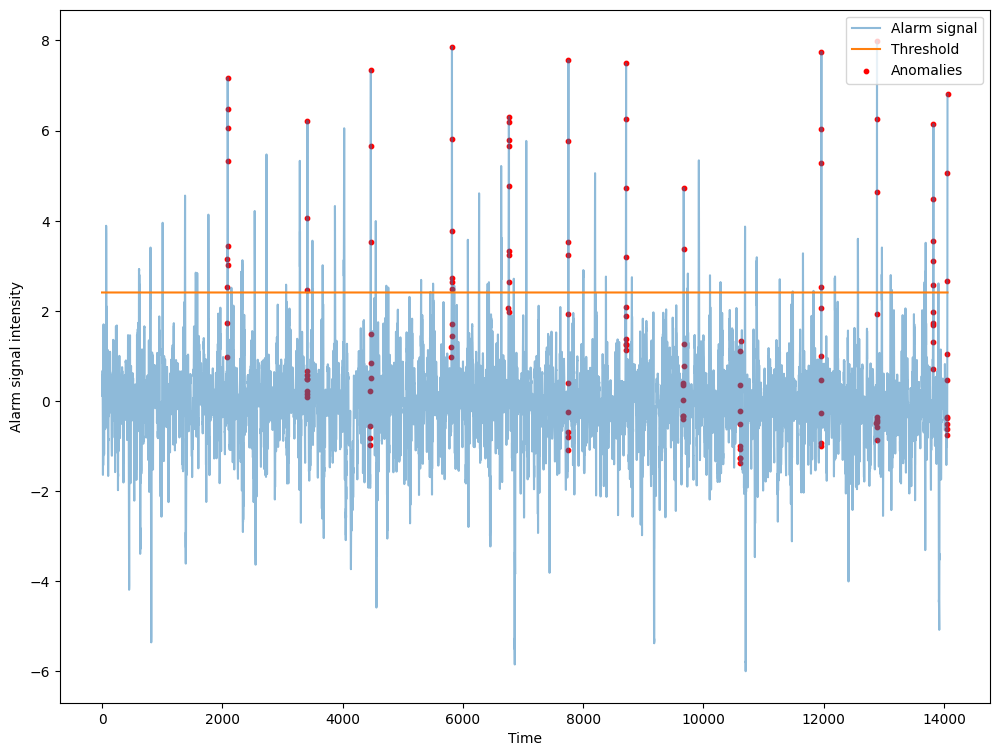

In [ ]:
plot_threshold(test_raw_signal, best_thr_raw, test_raw_rul)

In [ ]:
perf_raw_test = performance_evaluation(test_raw_signal, best_thr_raw, test_raw_rul)

The total cost of the model is 338.000
Detected 12 faults over 13, missed faults: 1. False alarm: 205
Faults detected with an anticipation of:
 - 0.7s
 - 0.2s
 - 0.2s
 - 0.5s
 - 0.7s
 - 0.3s
 - 0.3s
 - 0.1s
 - 0.3s
 - 0.2s
 - 0.4s
 - 0.2s
The mean anticipation is 0.34s. Total amount of anticipation is 4.1s


In [ ]:
all_perf_test.append(["raw_signal"] + perf_raw_test)

#### Autoencoders

In [ ]:
test_set_ae = build_dataset_for_ml_model(df, split_size=1)

In [ ]:
test_preds_ae = ae.predict(test_set_ae[:, :-1])

440/440 [==============================] - 1s 2ms/step


In [ ]:
test_signal_ae = pd.Series(data=np.sum(np.square(test_preds_ae - test_set_ae[:, :-1]), axis=1))
test_rul_ae = test_set_ae[:, -1]

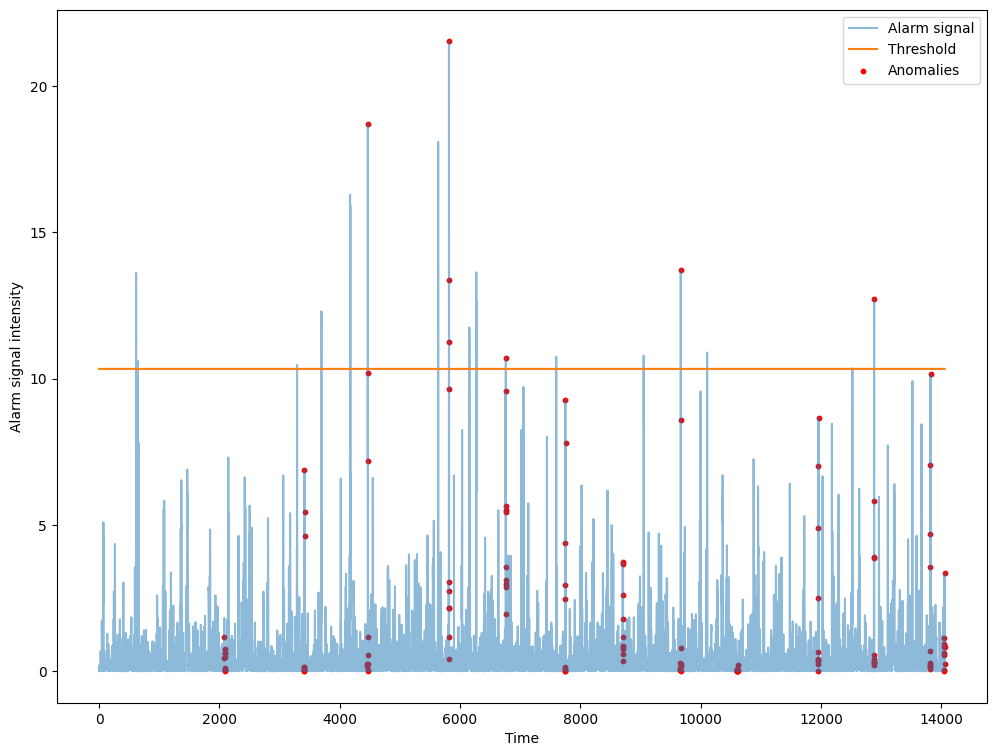

In [ ]:
plot_threshold(test_signal_ae, best_thr_ae, test_rul_ae)

In [ ]:
test_perf_ae = performance_evaluation(test_signal_ae, best_thr_ae, test_rul_ae)

The total cost of the model is 583.800
Detected 5 faults over 13, missed faults: 8. False alarm: 19
Faults detected with an anticipation of:
 - 0.2s
 - 0.3s
 - 0.5s
 - 0.1s
 - 0.0s
The mean anticipation is 0.22s. Total amount of anticipation is 1.1s


In [ ]:
all_perf_test.append(["autoencoder"] + test_perf_ae)

#### Logistic Neural Network

In [ ]:
test_set_lin = build_dataset_for_ml_model(df, split_size=1)

In [ ]:
test_preds_lin = lin_cl.predict(test_set_lin[:, :-1]).ravel()

440/440 [==============================] - 1s 2ms/step


In [ ]:
test_signal_lin_cl = pd.Series(data=(1 - test_preds_lin))
test_rul_lin_cl = test_set_lin[:, -1]

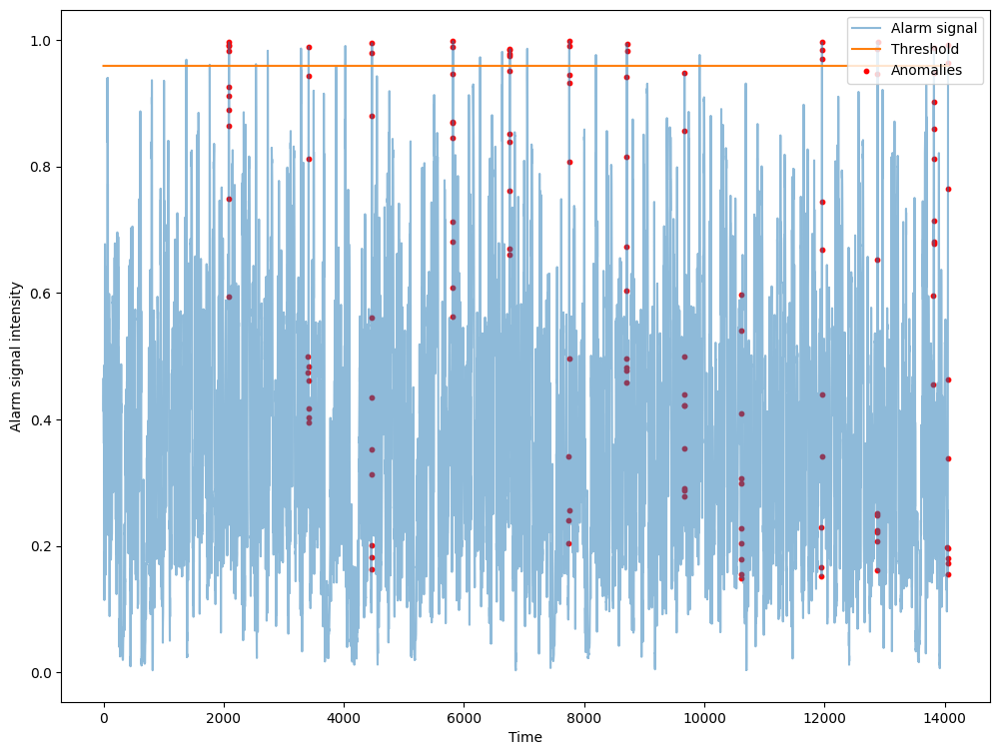

In [ ]:
plot_threshold(test_signal_lin_cl, best_thr_lin_cl, test_rul_lin_cl)

In [ ]:
test_perf_lin_cl = performance_evaluation(test_signal_lin_cl, best_thr_lin_cl, test_rul_lin_cl)

The total cost of the model is 491.600
Detected 11 faults over 13, missed faults: 2. False alarm: 28
Faults detected with an anticipation of:
 - 0.3s
 - 0.0s
 - 0.1s
 - 0.1s
 - 0.3s
 - 0.1s
 - 0.1s
 - 0.2s
 - 0.1s
 - 0.0s
 - 0.1s
The mean anticipation is 0.13s. Total amount of anticipation is 1.4s


In [ ]:
all_perf_test.append(["logistic_nn"] + test_perf_lin_cl)

#### Deep Dense Neural Network

In [ ]:
test_set_nn = build_dataset_for_ml_model(df, split_size=1)

In [ ]:
test_preds_ffnn = ffnn.predict(test_set_nn[:, :-1]).ravel()

440/440 [==============================] - 1s 1ms/step


In [ ]:
test_signal_ffnn = pd.Series(data=(1 - test_preds_ffnn))
test_rul_ffnn = test_set_nn[:, -1]

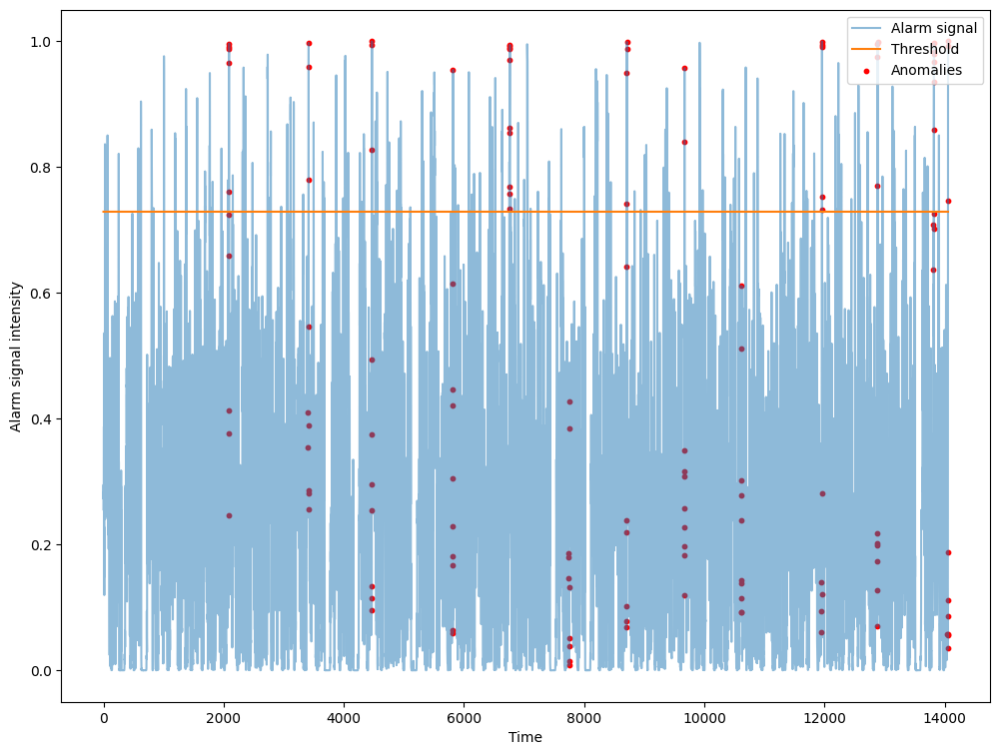

In [ ]:
plot_threshold(test_signal_ffnn, best_thr_ffnn, test_rul_ffnn)

In [ ]:
test_perf_ffnn = performance_evaluation(test_signal_ffnn, best_thr_ffnn, test_rul_ffnn)

The total cost of the model is 434.000
Detected 11 faults over 13, missed faults: 2. False alarm: 430
Faults detected with an anticipation of:
 - 0.5s
 - 0.2s
 - 0.2s
 - 0.0s
 - 0.9s
 - 0.3s
 - 0.1s
 - 0.4s
 - 0.3s
 - 0.6s
 - 0.2s
The mean anticipation is 0.34s. Total amount of anticipation is 3.7s


In [ ]:
all_perf_test.append(["deep_nn"] + test_perf_ffnn)

#### Convolutional Neural Network

In [ ]:
test_set_cnn = build_dataset_for_ml_model(df, as_list=True, split_size=1)
ts_sw, ts_sw_r = sliding_window_by_fault(test_set_cnn, train_cols_cnn)

In [ ]:
test_preds_cnn = cnn.predict(ts_sw).ravel()

436/436 [==============================] - 1s 2ms/step


In [ ]:
test_signal_cnn = pd.Series(data=(1 - test_preds_cnn))
test_rul_cnn = ts_sw_r

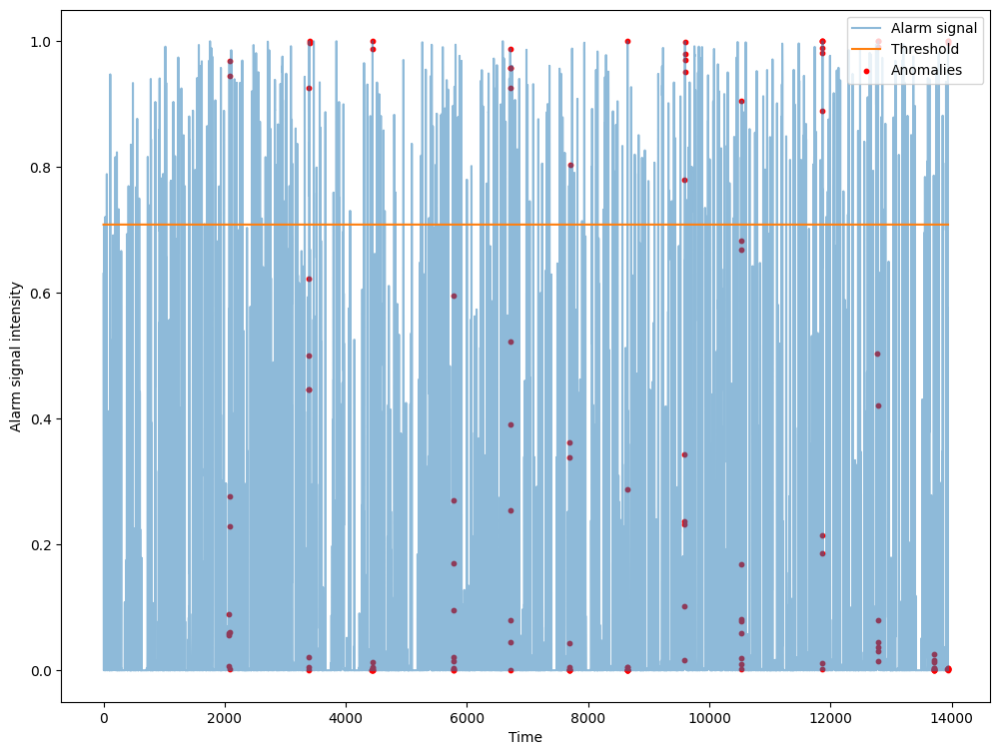

In [ ]:
plot_threshold(test_signal_cnn, best_thr_cnn, test_rul_cnn)

In [ ]:
test_perf_cnn = performance_evaluation(test_signal_cnn, best_thr_cnn, test_rul_cnn)

The total cost of the model is 541.600
Detected 11 faults over 13, missed faults: 2. False alarm: 698
Faults detected with an anticipation of:
 - 0.3s
 - 0.2s
 - 0.1s
 - 0.9s
 - 0.0s
 - 0.0s
 - 0.4s
 - 0.1s
 - 0.5s
 - 0.2s
 - 0.2s
The mean anticipation is 0.26s. Total amount of anticipation is 2.9s


In [ ]:
all_perf_test.append(["conv_nn"] + test_perf_cnn)

#### Recurrent Neural Network

In [ ]:
test_set_rnn = build_dataset_for_ml_model(df, split_size=1)
X_test_rnn, y_test_rnn = create_dataset_3D(test_set_rnn[:, :-1], 
                                           test_set_rnn[:, -1], 
                                           TIME_STEPS)

In [ ]:
test_preds_bilstm = model_bilstm.predict(X_test_rnn).ravel()
test_preds_lstm = model_lstm.predict(X_test_rnn).ravel()
test_preds_gru = model_gru.predict(X_test_rnn).ravel()

test_signal_bilstm = pd.Series(data=(1 - test_preds_bilstm))
test_rul_bilstm = y_test_rnn
test_signal_lstm = pd.Series(data=(1 - test_preds_lstm))
test_rul_lstm = y_test_rnn
test_signal_gru = pd.Series(data=(1 - test_preds_gru))
test_rul_gru = y_test_rnn

439/439 [==============================] - 1s 2ms/step


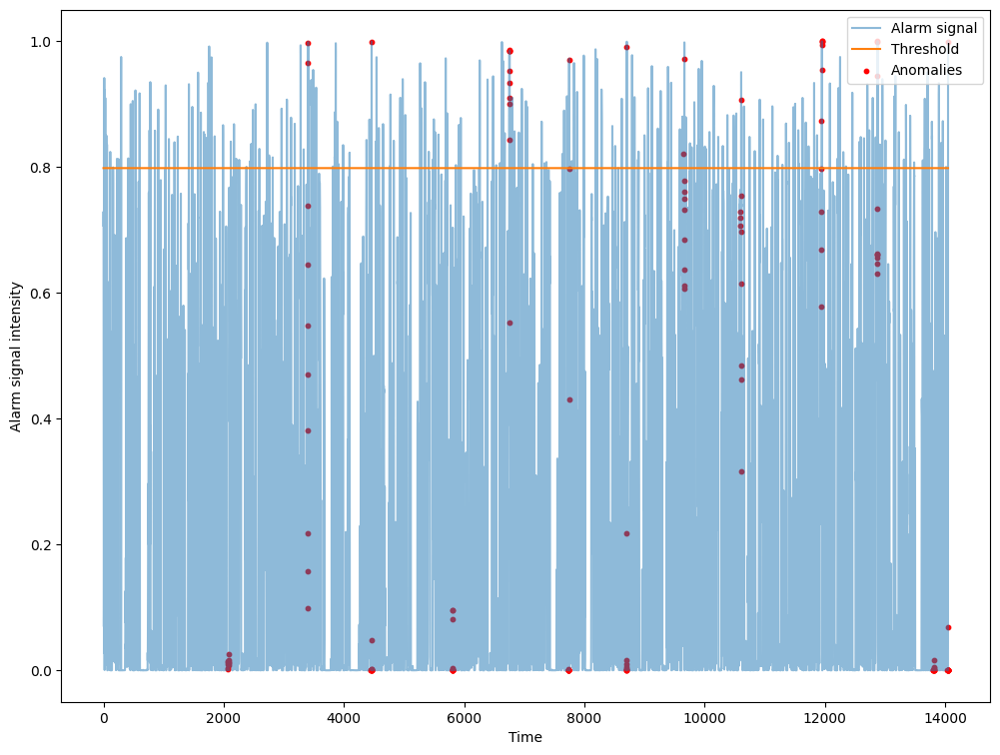

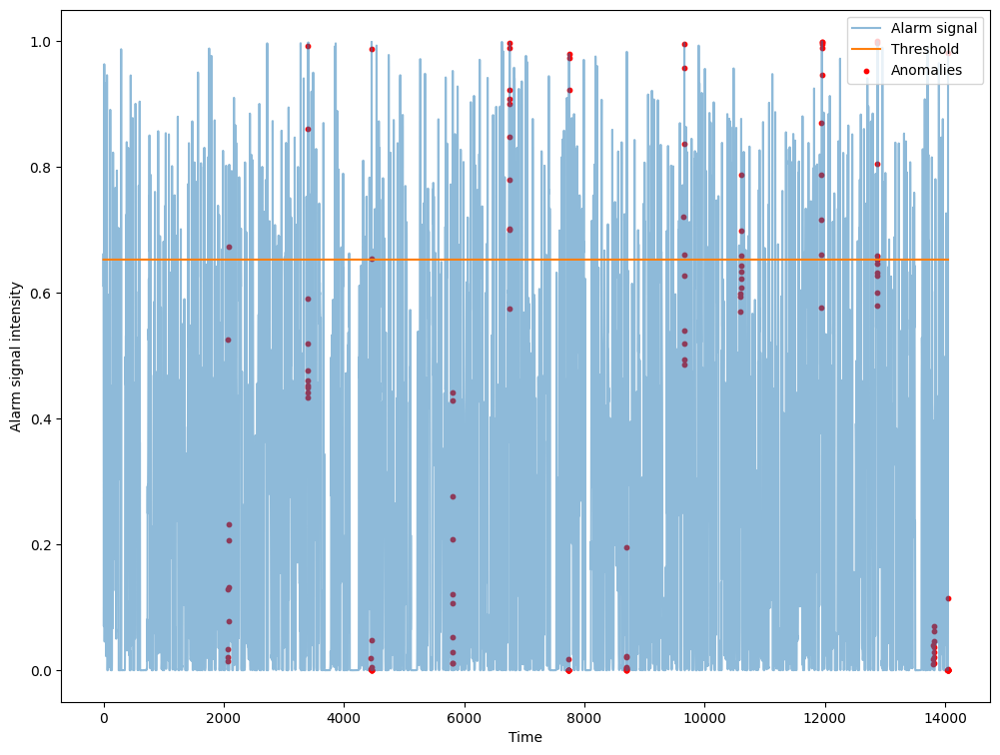

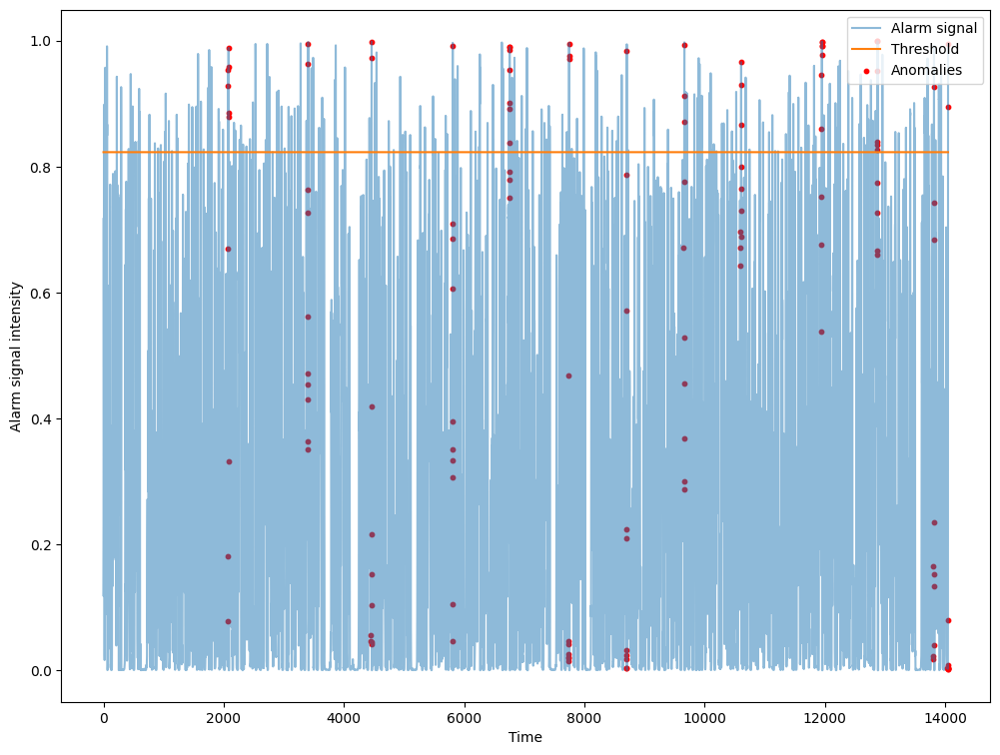

In [ ]:
plot_threshold(test_signal_bilstm, best_thr_bilstm, test_rul_bilstm)
plot_threshold(test_signal_lstm, best_thr_lstm, test_rul_lstm)
plot_threshold(test_signal_gru, best_thr_gru, test_rul_gru)

In [ ]:
print("Bi-LSTM:")
test_perf_bilstm = performance_evaluation(test_signal_bilstm, best_thr_bilstm, test_rul_bilstm)
print("\nLSTM:")
test_perf_lstm = performance_evaluation(test_signal_lstm, best_thr_lstm, test_rul_lstm)
print("\nGRU:")
test_perf_gru = performance_evaluation(test_signal_gru, best_thr_gru, test_rul_gru)

Bi-LSTM:
The total cost of the model is 566.200
Detected 10 faults over 13, missed faults: 3. False alarm: 506
Faults detected with an anticipation of:
 - 0.1s
 - 0.0s
 - 0.8s
 - 0.0s
 - 0.0s
 - 0.9s
 - 0.0s
 - 0.5s
 - 0.2s
 - 0.0s
The mean anticipation is 0.25s. Total amount of anticipation is 2.5s

LSTM:
The total cost of the model is 617.400
Detected 10 faults over 13, missed faults: 3. False alarm: 1267
Faults detected with an anticipation of:
 - 0.4s
 - 0.1s
 - 0.1s
 - 0.9s
 - 0.2s
 - 0.9s
 - 0.2s
 - 0.8s
 - 0.5s
 - 0.0s
The mean anticipation is 0.41s. Total amount of anticipation is 4.1s

GRU:
The total cost of the model is 429.200
Detected 13 faults over 13, missed faults: 0. False alarm: 431
Faults detected with an anticipation of:
 - 0.6s
 - 0.1s
 - 0.1s
 - 0.0s
 - 0.8s
 - 0.2s
 - 0.0s
 - 0.2s
 - 0.2s
 - 0.6s
 - 0.7s
 - 0.0s
 - 0.1s
The mean anticipation is 0.28s. Total amount of anticipation is 3.6s


In [ ]:
all_perf_test.append(["bilstm"] + test_perf_bilstm)
all_perf_test.append(["lstm"] + test_perf_lstm)
all_perf_test.append(["gru"] + test_perf_gru)

## Analysis over the test set

In [ ]:
pd.DataFrame(all_perf_test, columns=["model", "cost", "anticipation", "detected_faults", "missed_faults", "false_alarms"]) 

,model,cost,anticipation,detected_faults,missed_faults,false_alarms
0,raw_signal,338.0000,0.3417,12,1,205
1,autoencoder,547.2000,0.2667,12,1,1001
2,logistic_nn,323.4000,0.3917,12,1,222
3,deep_nn,392.8000,0.2583,12,1,164
4,conv_nn,393.6000,0.5000,13,0,1078
5,bilstm,545.6000,0.4444,9,4,743
6,lstm,570.2000,0.3143,7,6,341
7,gru,626.8000,0.4364,11,2,1624
8,raw_signal,338.0000,0.3417,12,1,205
9,autoencoder,583.8000,0.2200,5,8,19


## Exercises over activity 2

You can now experience hyperparameter tuning. Can you describe what are these parameters representing and how do they affect the performance?

We will pick as example 1DCNN. Try to:

1. Set the number of hidden layers to `[16]` and then to `[128, 64, 32]`.
2. Set the number of filters to `1` and to `10`.
3. Set the kernel size to `3` and to `7`.
4. Set the learning rate of the optimizer to `0.1` and to `0.0000001`.
5. Remove the class weights.
6. Set the batch size to `256` and to `1`.

**IMPORTANT**

To perform the exercises:
1. Change and execute the training code, remembering to change the model name to be stored in `all_perf` list.
2. Execute the evaluation code, remembering to change the model name to be stored in `all_perf_test` list.

**NOTE**

Are different models really comparable in such a fast way? What are we omitting?

# Activity 3

## Performance evaluation when using different pre-processing and threshold optimization techniques

## Feature selection and engineering

Within the notebook, we developed code to elaborate raw features in order to perform feature engineering. Feature engineering is a technique which aims at clean and improve the input data to obtain better performance.

The choice of the features to employ at training time is never trivial. We struggled a lot before identify differencing as a key technique. You will now experience what would change in case you train some ML models with different features.

At this point, you can start by modifying the features used by the model at training and inference time. Do it in the next cell. Then perform again some of the previous trainings.

In particular, you can try to train over: 
* `"Gz_min", "Ax_min", "Ay_min"`
* `"Gz_max", "Ax_max", "Ay_max"`
* `"Gz_diff", "Ax_diff", "Ay_diff"`

In [ ]:
training_columns = ['Gz', 'Ax', 'Ay', 'Gz_mean', 'Ax_mean', 'Ay_mean', 'Gz_min', 'Ax_min',
       'Ay_min', 'Gz_max', 'Ax_max', 'Ay_max', 'Gz_diff', 'Ax_diff', 'Ay_diff',
       'POSx', 'POSy', 'orient', 'orient_discr', 'POSy_discr',
       'differencing_Ax_mean', 'differencing_Ay_mean', 'differencing_Gz_mean', 'label']  # change this list

## Threshold tuning

Accordingly to the scenario, false positive and false negative can have different impacts. If safety is the most important key performance indicator (KPI), then it is better to recognize as many faults as possible, even if it results in having more false alarms. Whereas, if availability is the most important KPI, it is better to miss some faults and raise as less false alarms as possible.

Try to discuss the results you obtain by modifying the constants `BASE_FN` and `BASE_FP` which are used to compute the cost of false negative and false positive respectively.

To perform this exercise, modify and execute the following cell and then go back to the previous cell to perform the threshold optimization again. Do you get different results?

In particular, you can try to set:
* `BASE_FP = 1` 
* `BASE_FN = 0.2`

In [ ]:
BASE_FP = 0.2  # modify here
BASE_FN = 1  # modify here

def false_positive_cost(i, is_fault, fault_found):
    return BASE_FP

def false_negative_cost(i, is_fault, fault_found):
    if not fault_found:
        for j in range(1, margin + 1):
            if i + j < is_fault.shape[0] and not is_fault[i + j] or i + j >= is_fault.shape[0]:
                return (margin + 1 - j) * BASE_FN
    else:
        return 0

## Dataset size 

Data-driven AI model highly depend on the training set size. The lower is the number of training samples, the more difficult is the training process. Nevertheless, collecting data is always and issue and can be an expensive procedure.

Try to reduce the number of training samples in the training set and perform again the training for some of the previous models. How many samples can you throw away before lowering too much the model's performance?

To perform the exercise go back to those cells where the training set was built with the instruction `build_dataset_for_ml_model(df_train)` and modify it in `build_dataset_for_ml_model(df_train, keep=0.6)`. In this way, you will train on only the 60% of the dataset.

In particular, you can try to reduce to 30% and 60% the total size of the training set.

# Activity 4 [Optional]

## Feature selection and engineering

As you have experienced, feature selection and engineering play a key role in ML. 

Try to apply feature engineering (e.g. differencing) to other features (e.g. `max_Ax`), train on a different subset of features and discuss the result you obtain. Is the initial choice of applying the differencing technique over the mean values of the features the most effective? Try also to enlarge/shrink the margin, what are the results?

This step requires a more significant programming effort, do not be afraid if you encounter some difficulties and ask for help!